#**Libraries and Dataset**

In [ ]:
#The 1st run should include the following pip installs, refresh the session then the 2nd run you comment them and run the libraries without them
#!pip install numpy==1.23.5 pandas==1.5.3 numba==0.56.4 matplotlib==3.6.2
#!pip install ydata-profiling
#!pip uninstall -y bigframes cudf-cu12
# import ydata_profiling
# from ydata_profiling import ProfileReport


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import pickle

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score, davies_bouldin_score
from collections import Counter
from sklearn.neighbors import NearestNeighbors
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM, Input
from tensorflow.keras import Model

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Read data from CSV file
df = pd.read_csv("/content/responses.csv")

# Step 1: Handle Missing Values
# Drop non-informative rows: remove rows with >61% missing critical column values
#df = df.dropna(thresh=int(len(df.columns) * 0.61)) #Any row with fewer than 61% populated values will be removed.
# Drop rows where the 'age' column includes no values (NaN or empty)
df = df.dropna(subset=['age'])

# Drop rows where the 'test_validity' column has a value less than 2
if 'test_validity' in df.columns:
    df = df[df['test_validity'] >= 2]
else:
    print("The 'test_validity' column does not exist in the dataset.")
# df = df.drop(columns=['test_valid'])


# Drop the "user_id" column
# df = df.drop(columns=['user_id'])


# Feature Engineering

country_to_nationality = {
    "Afghanistan": "Afghan",
    "Albania": "Albanian",
    "Algeria": "Algerian",
    "Andorra": "Andorran",
    "Italy": "Italian",
    "France": "French",
    "Germany": "German",
    "Spain": "Spanish",
    "Iran": "Iranian",
    "Sweden": "Swedish",
    "Ukraine": "Ukranian",
    "Egypt": "Egyptian"
    # Add more mappings as necessary
}

# Apply the mapping to the nationality column
df['nationality'] = df['nationality'].replace(country_to_nationality)

# Define the dictionary mapping nationalities to regions
nationality_to_region = {
    # Asia
    'Afghan': 'Asia',
    'Armenian': 'Asia',
    'Indian': 'Asia',
    'Cambodian': 'Asia',
    'Azerbaijani': 'Asia',
    'Indiana': 'Asia',


    # Europe
    'Albanian': 'Europe',
    'Austrian': 'Europe',
    'Belgian': 'Europe',
    'Croatian': 'Europe',
    'Czech': 'Europe',
    'Dutch': 'Europe',
    'Estonian': 'Europe',
    'French': 'Europe',
    'German': 'Europe',
    'Greek': 'Europe',
    'Italian': 'Europe',
    'Latvian': 'Europe',
    'Luxembourgish': 'Europe',
    'Moldovan': 'Europe',
    'Polish': 'Europe',
    'Serbian': 'Europe',
    'Slovenian': 'Europe',
    'Spanish': 'Europe',
    'Swedish': 'Europe',
    'Ukrainian': 'Europe',
    'Ukranian': 'Europe',
    'Andorran': 'Europe',
    'Cypriot': 'Europe',
    'British': 'Europe',
    'Liechtensteiner': 'Europe',



    # Middle East
    'Bahraini': 'Middle East',
    'Iranian': 'Middle East',
    'Saudi Arabia': 'Middle East',
    'Egyptian': 'Middle East',

    # Africa
    'Algerian': 'Africa',
    'Angolan': 'Africa',
    'Burundian': 'Africa',
    'South African': 'Africa',
    'Tanzanian': 'Africa',
    'Tunisian': 'Africa',
    'Ivorian': 'Africa',

    # North America
    'American': 'North America',
    'Canada': 'North America',
    'United States': 'North America',
    'Belize': 'North America',
    'Anguilla': 'North America',

    # South America
    'Argentinian': 'South America',
    'Bolivian': 'South America',
    'Brazilian': 'South America',

    # Oceania
    'Australian': 'Oceania',
    'Australia': 'Oceania',
    'New Zealander': 'Oceania',
}

# Map nationalities to regions
df['region'] = df['nationality'].map(nationality_to_region)


# Display the updated DataFrame and the countries classified as 'Unknown'
print(df)

df = df.drop(columns=['nationality'])



df_original= df.copy(deep=True)



# Define the legitimate and phishing IDs as provided
legitimate_ids = [1, 5, 6, 17, 18, 19, 20, 21, 22, 25, 26, 32, 47, 48, 49, 50, 51, 53, 56, 57, 58, 61, 62, 63, 64, 66,
                  67, 80, 81, 82, 83, 84, 87, 88, 89, 91, 95, 97, 98, 99, 100, 103, 104, 110, 125, 126, 127, 128, 130,
                  131, 132, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153,
                  154, 155, 156]
phishing_ids = [2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 23, 24, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39,
                40, 41, 42, 43, 44, 45, 46, 52, 54, 55, 59, 60, 65, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 85,
                86, 90, 92, 93, 94, 96, 101, 102, 105, 106, 107, 108, 109, 111, 112, 113, 114, 115, 116, 117, 118, 119,
                120, 121, 122, 123, 124, 129, 133, 134, 136, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
                168, 169, 170, 171, 172, 173, 174, 175, 176]

# Define a function to calculate the "result" based on the given logic
def calculate_result(row):
    count = 0
    # Iterate over columns in pairs (test_answer_{num}, email_id_{num})
    for num in range(1, 11):  # Assuming we have test_answer and email_id columns up to {5}
        test_answer_col = f'test_answer_{num}'
        email_id_col = f'email_id_{num}'

        # Check if columns exist to avoid KeyErrors
        if test_answer_col in row and email_id_col in row:
            test_answer = row[test_answer_col]
            email_id = row[email_id_col]

            # Apply the incrementing logic based on conditions provided
            if (test_answer == 0.0 and email_id in legitimate_ids) or (test_answer == 1.0 and email_id in phishing_ids):
                count += 1
    return count

# Apply the function to each row and create the "result" column
df['result'] = df.apply(calculate_result, axis=1)

# Interaction Features: e.g., educationLevel_id × jobField_id
#df['education_job_interaction'] = df['educationLevel_id'] * df['jobField_id']
# # Convert 'date_joined' to datetime format
# df['date_joined'] = pd.to_datetime(df['date_joined'], errors='coerce')
# # Create separate 'month' and 'day' columns
# df['month'] = df['date_joined'].dt.month
# df['day'] = df['date_joined'].dt.day
# # Optionally drop the original 'date_joined' column if no longer needed
# df = df.drop(columns=['date_joined'])
df['gender'] = df['gender'].replace('Altro', 'Other')

df_clusters = df.copy(deep=True) #####To be used in clusters since they preserve all imp features regarding both personal traits and text traits

df_actual = df.copy(deep=True)
columns_to_drop = [
    "id_1", "id_2", "id_3", "id_4", "id_5", "id_6", "id_7", "id_8", "id_9", "id_10",
    "time_taken_to_answer_1", "time_taken_to_answer_2", "time_taken_to_answer_3",
    "time_taken_to_answer_4", "time_taken_to_answer_5", "time_taken_to_answer_6",
    "time_taken_to_answer_7", "time_taken_to_answer_8", "time_taken_to_answer_9",
    "time_taken_to_answer_10", "test_answer_1", "test_answer_2", "test_answer_3",
    "test_answer_4", "test_answer_5", "test_answer_6", "test_answer_7", "test_answer_8",
    "test_answer_9", "test_answer_10", "email_id_1", "email_id_2", "email_id_3", "email_id_4", "email_id_5", "email_id_6",
    "email_id_7", "email_id_8", "email_id_9", "email_id_10", "reported_as_spam_1",
    "reported_as_spam_2", "reported_as_spam_3", "reported_as_spam_4", "reported_as_spam_5",
    "reported_as_spam_6", "reported_as_spam_7", "reported_as_spam_8", "reported_as_spam_9",
    "reported_as_spam_10", "antiPhishing_course"
]



# Drop the columns
df = df_actual.drop(columns=columns_to_drop)
df = df.drop(columns=['region']) ############################################################################# For testinggggg ######################################3
df.info()

output_file_path = '/content/sample_data/df.csv'
df.to_csv(output_file_path, index=False)



The 'test_validity' column does not exist in the dataset.
      age  gender  years_job_experience nationality  \
0      26    Male                     0     Italian   
1      26  Female                    10     Italian   
2      50  Female                     0     Italian   
3      27  Female                     0     Italian   
4      17  Female                     0     Italian   
...   ...     ...                   ...         ...   
1491   19  Female                     0    Egyptian   
1492   23  Female                     1    Egyptian   
1493   54    Male                    28    Egyptian   
1494   90  Female                    40    Egyptian   
1495   54    Male                     1     Italian   

      computer_science_knowledge  antiPhishing_course  phishing_attack  \
0                              5                    0                0   
1                              2                    0                0   
2                              1                    0      

# **Data Exploration**

## Middle East vs. Europe

<ipython-input-6-cfc85968ed41>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_results, x='Region', y='Average Result', palette='coolwarm')


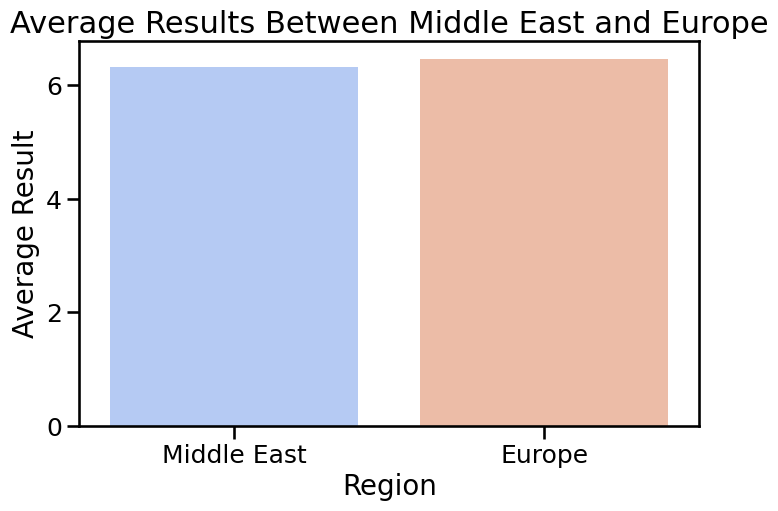

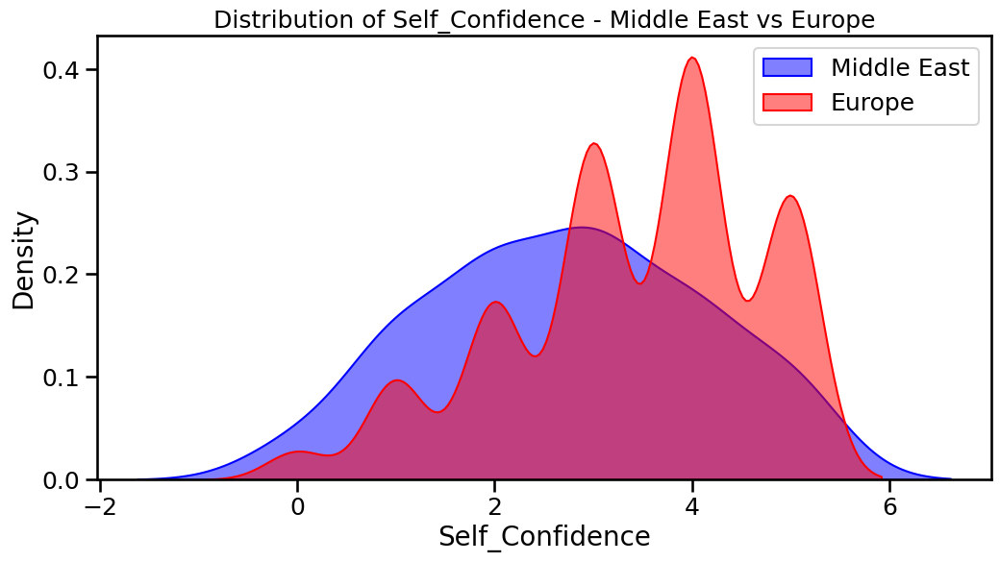

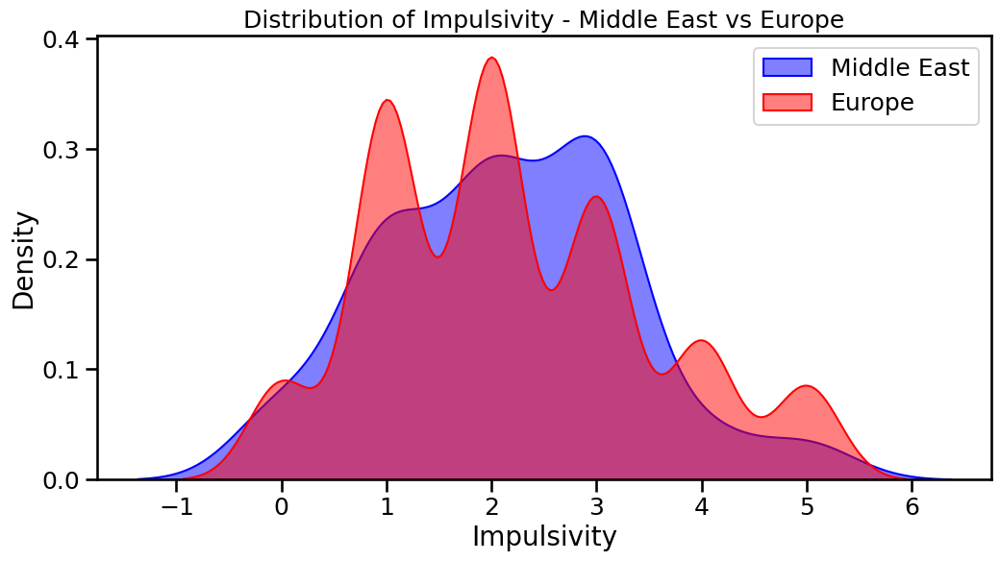

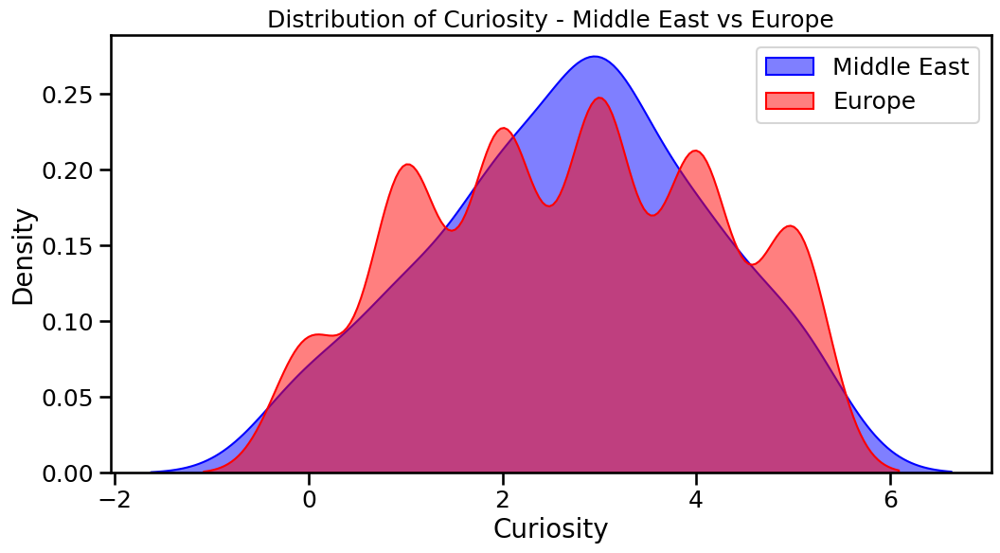

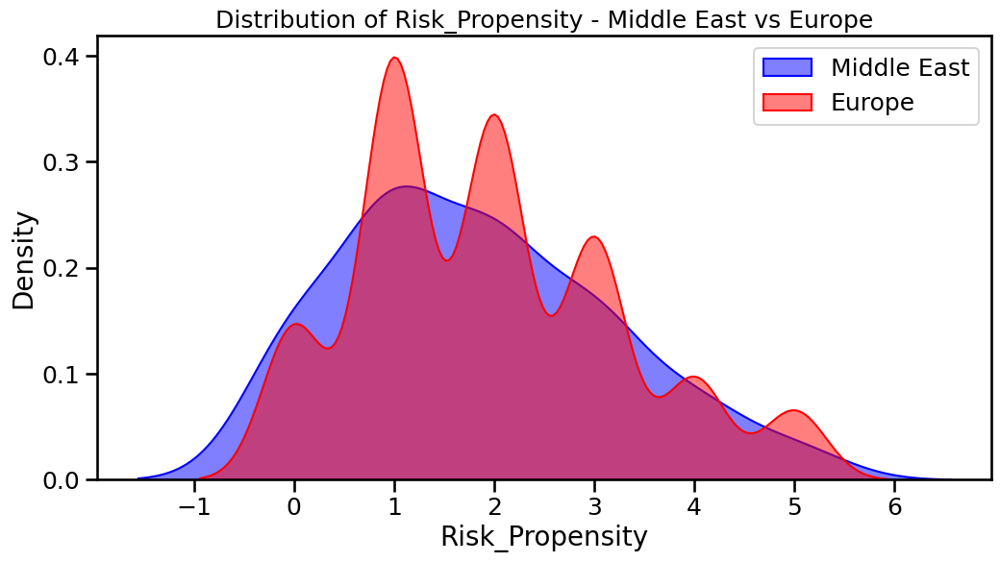

...

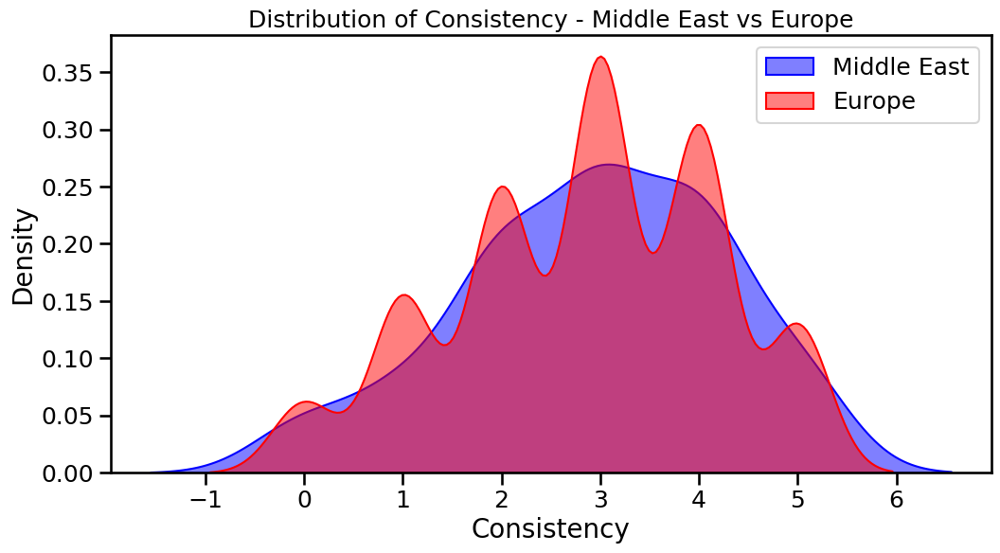

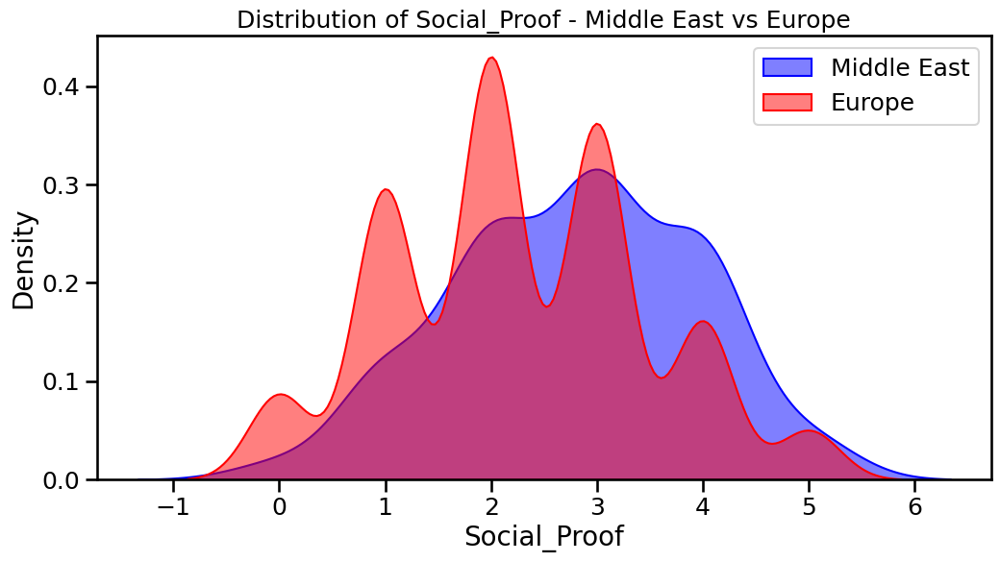

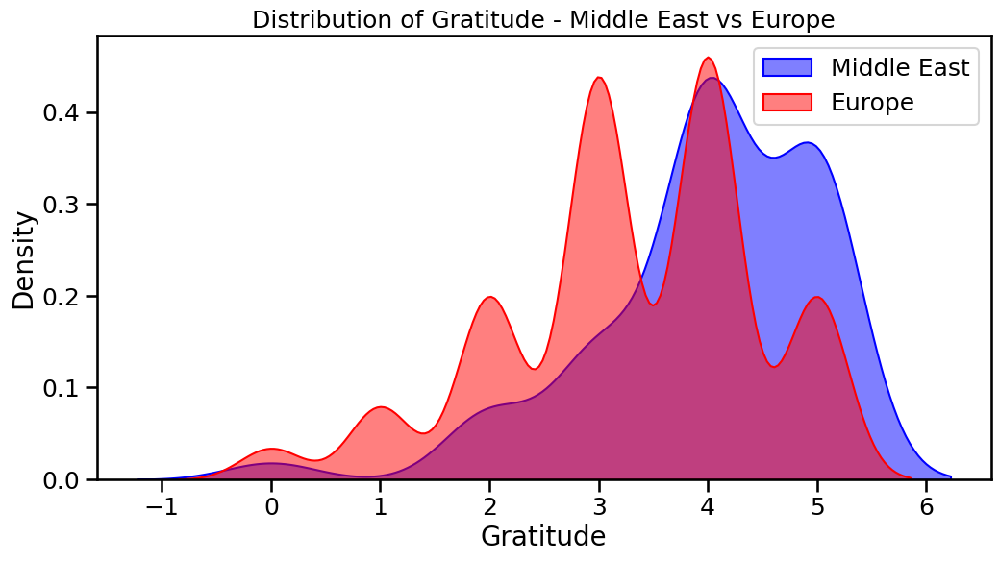

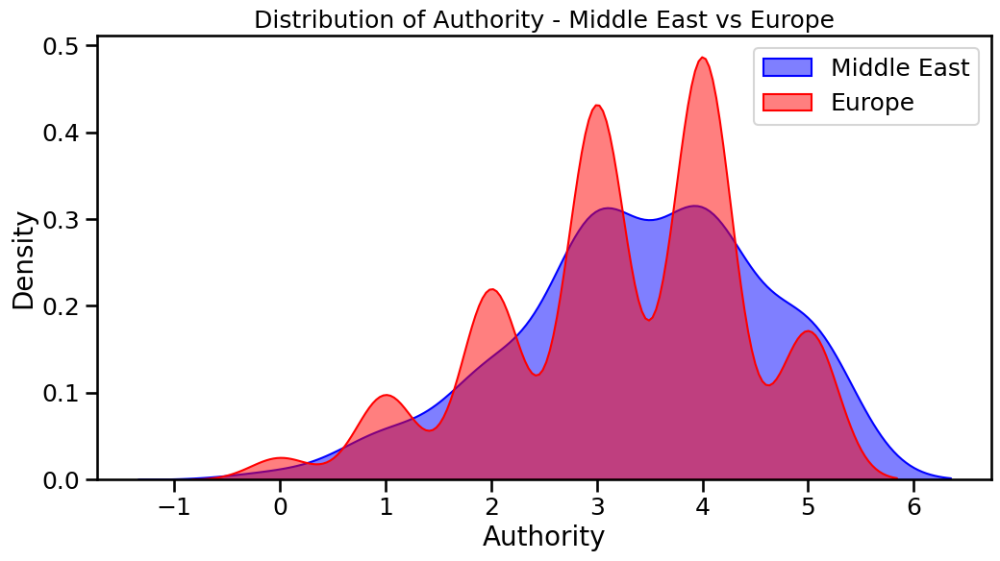

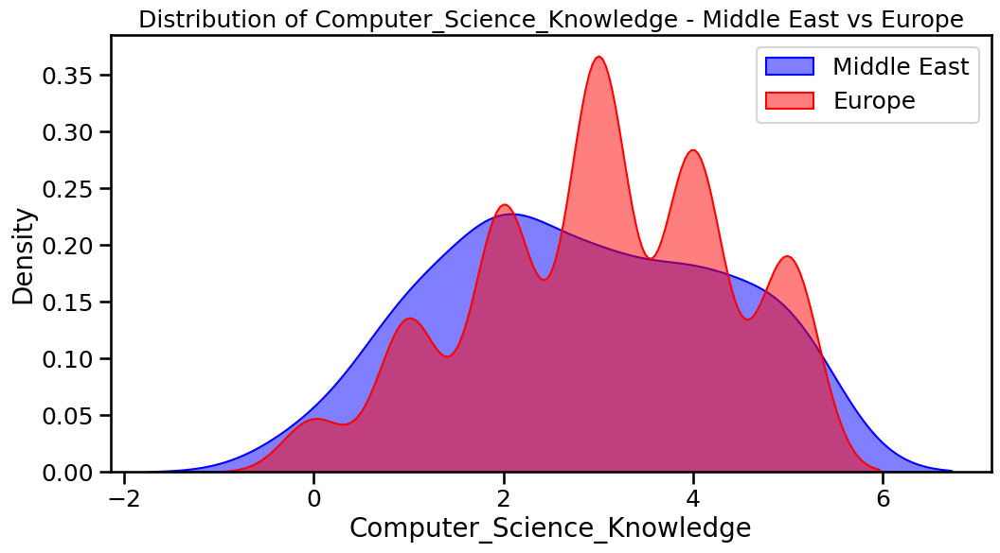

<ipython-input-6-cfc85968ed41>:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


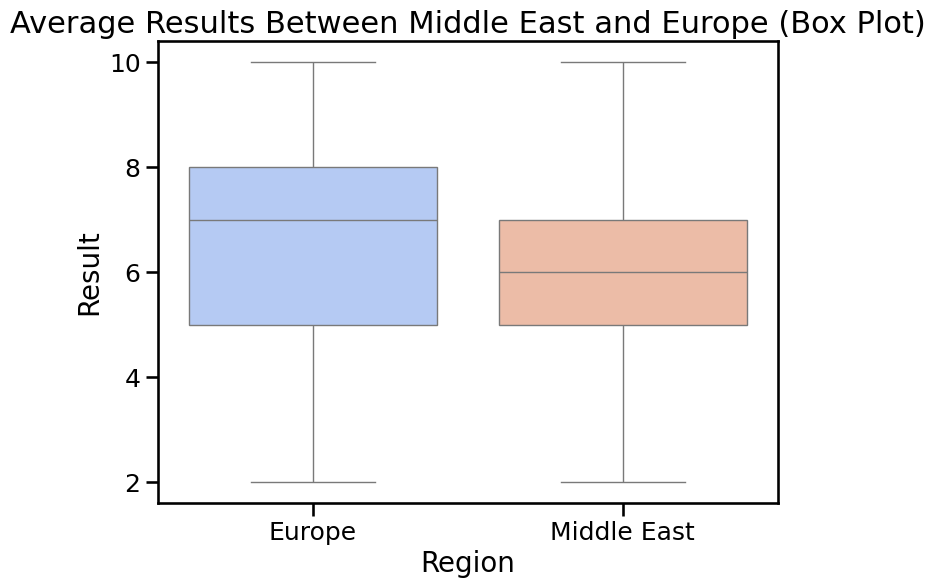

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


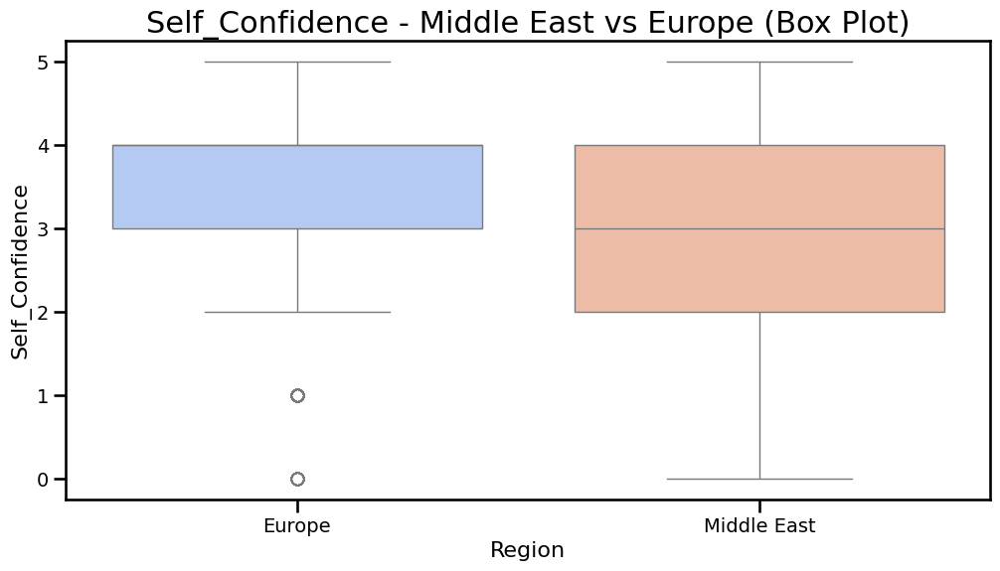

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


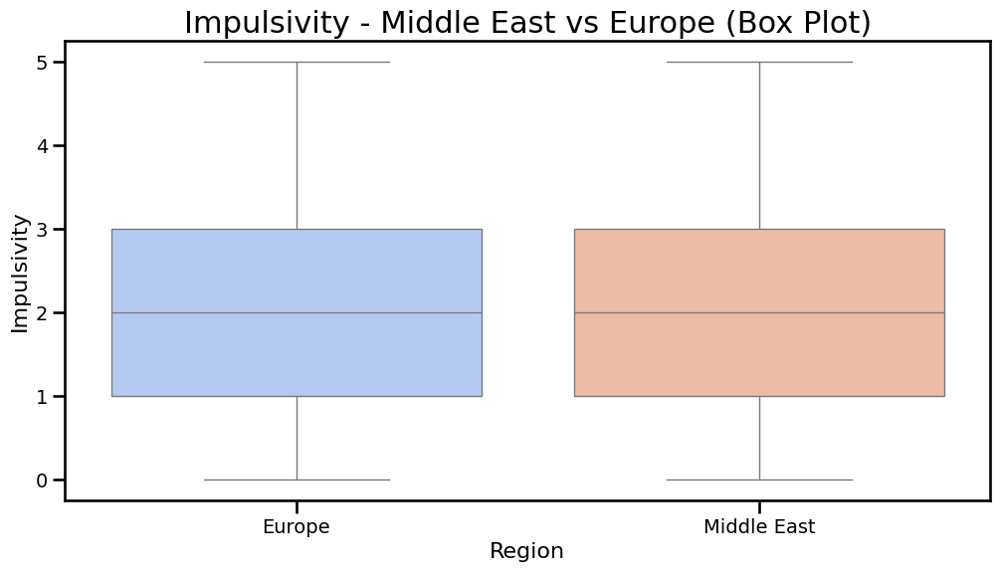

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


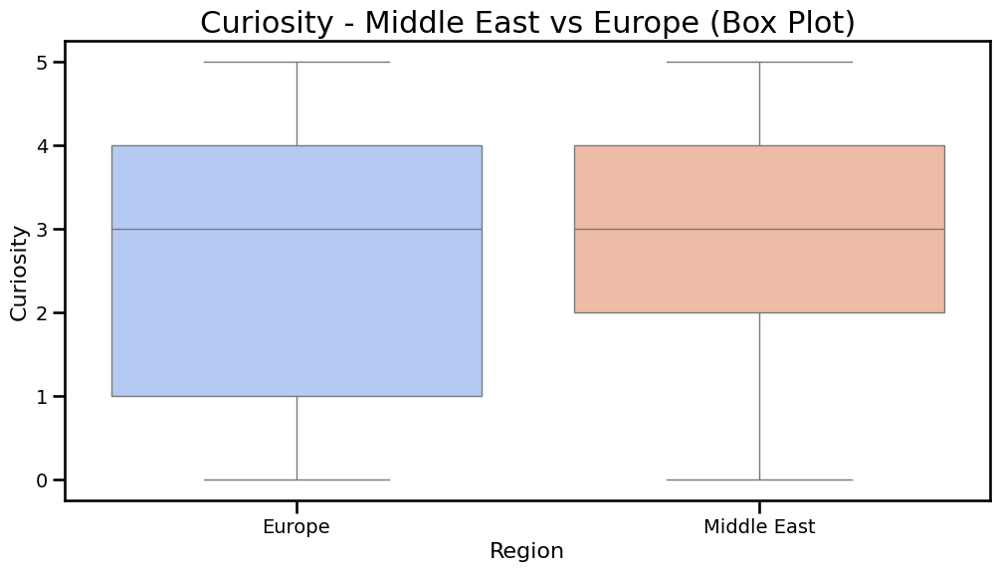

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


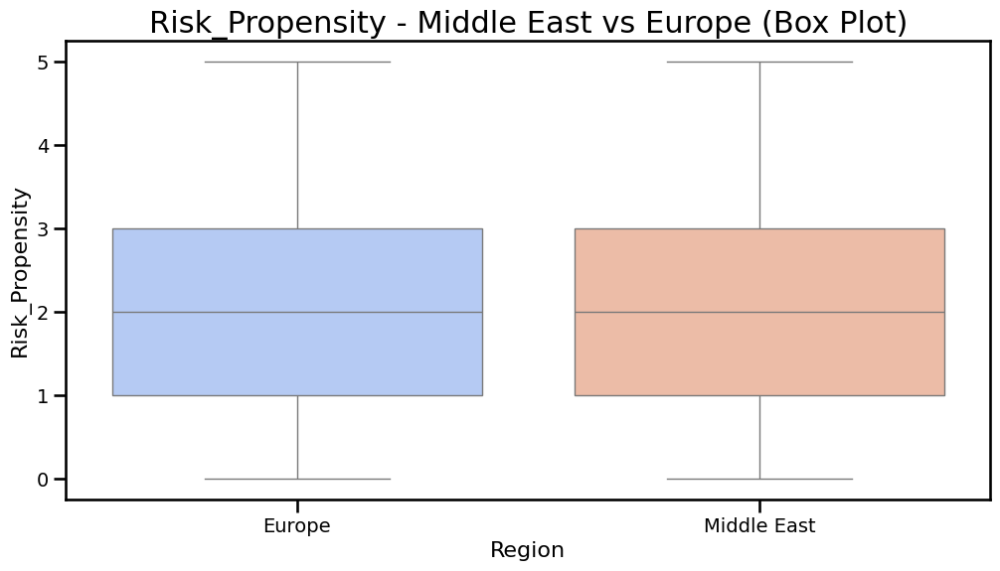

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


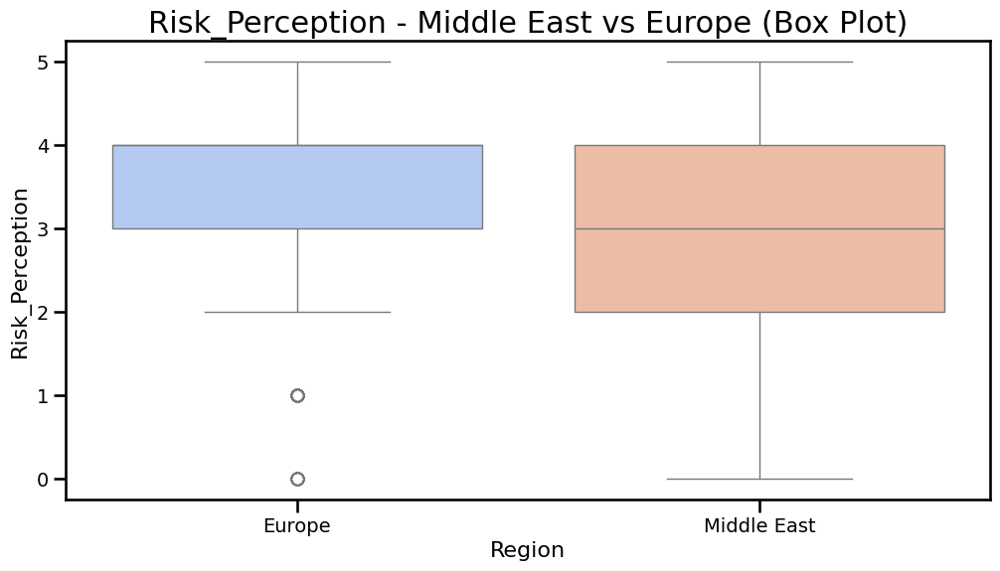

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


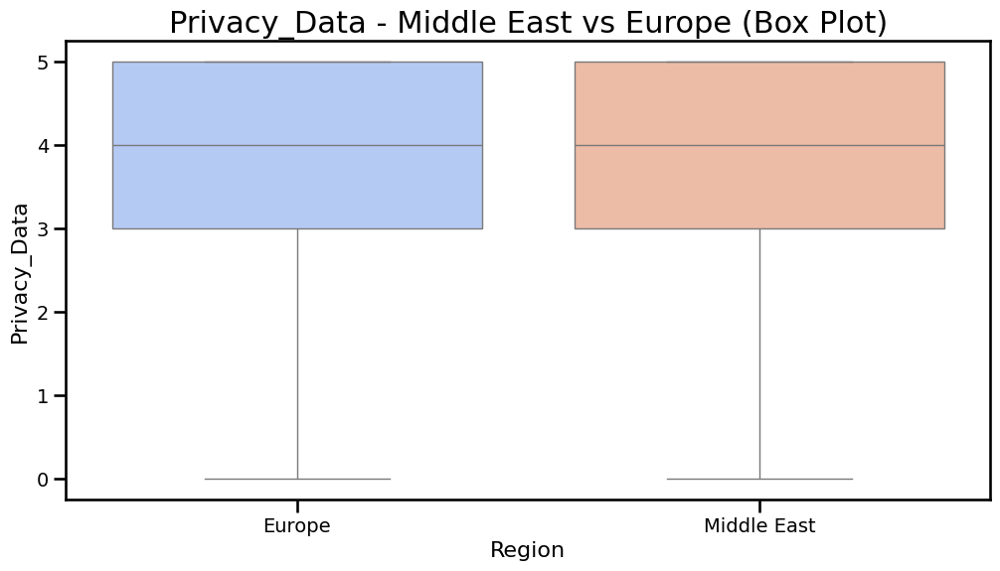

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


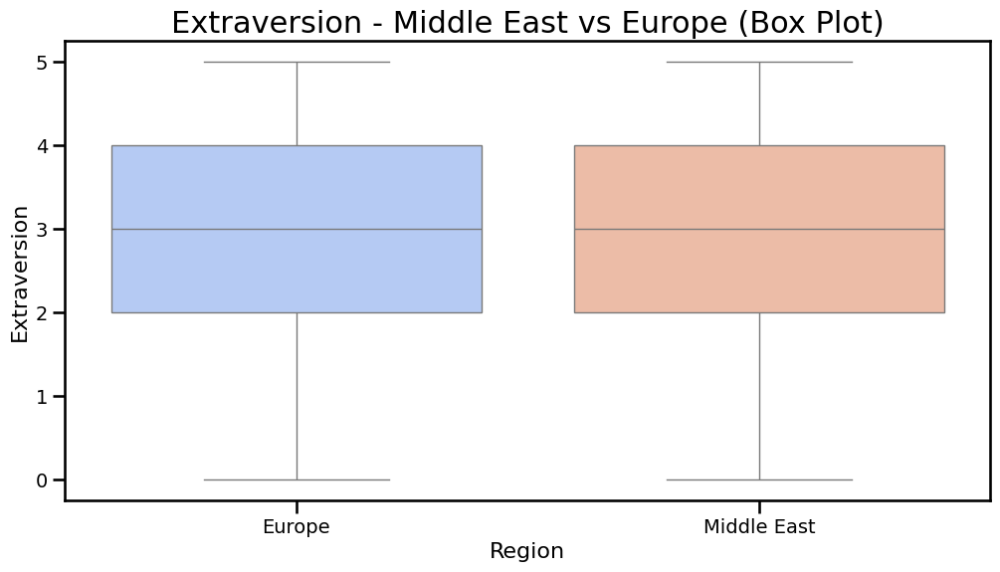

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


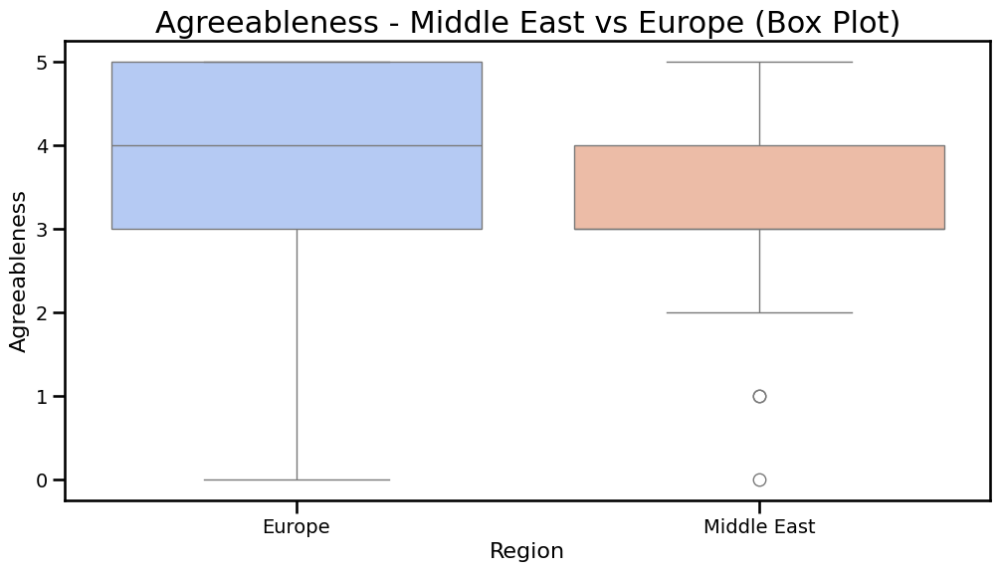

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


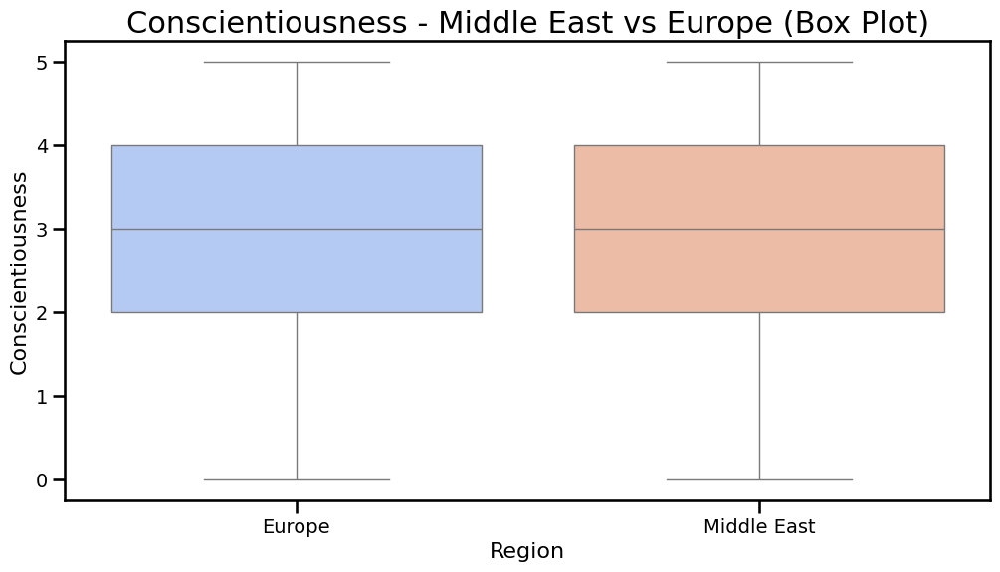

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


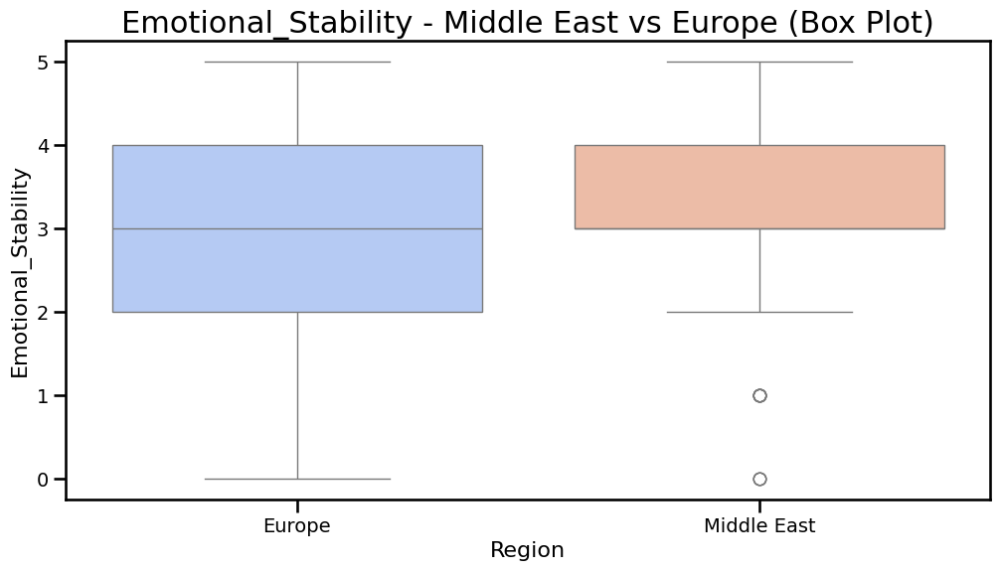

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


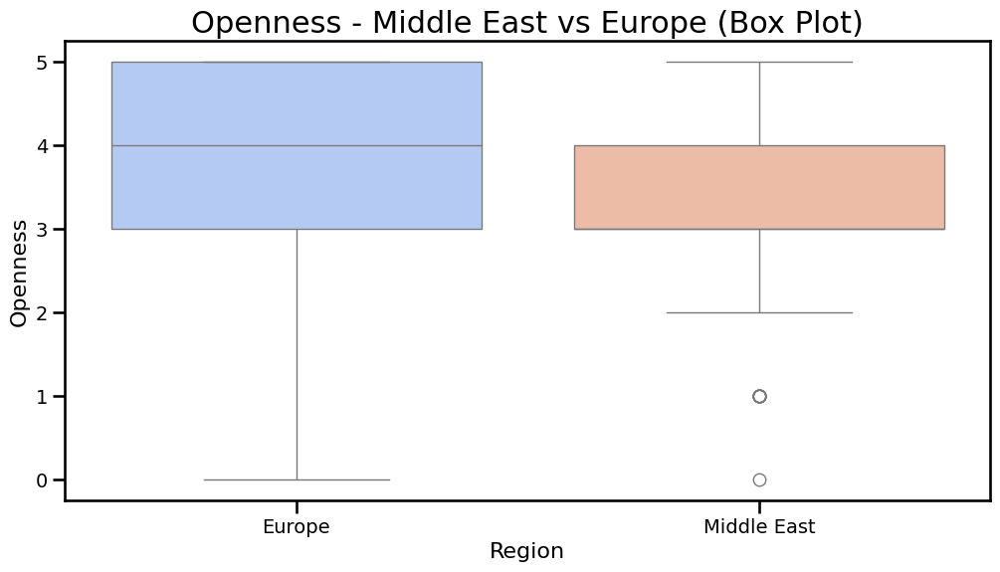

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


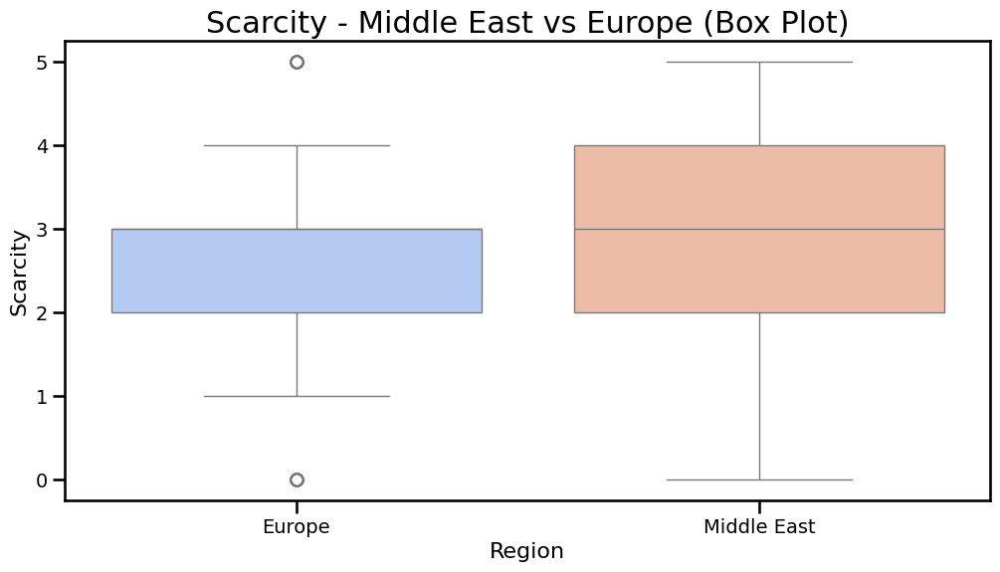

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


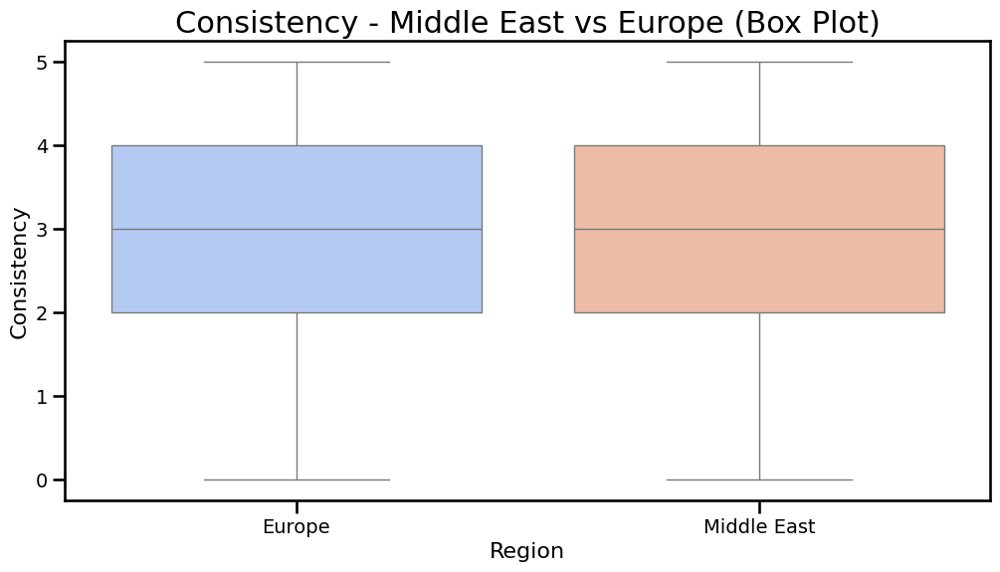

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


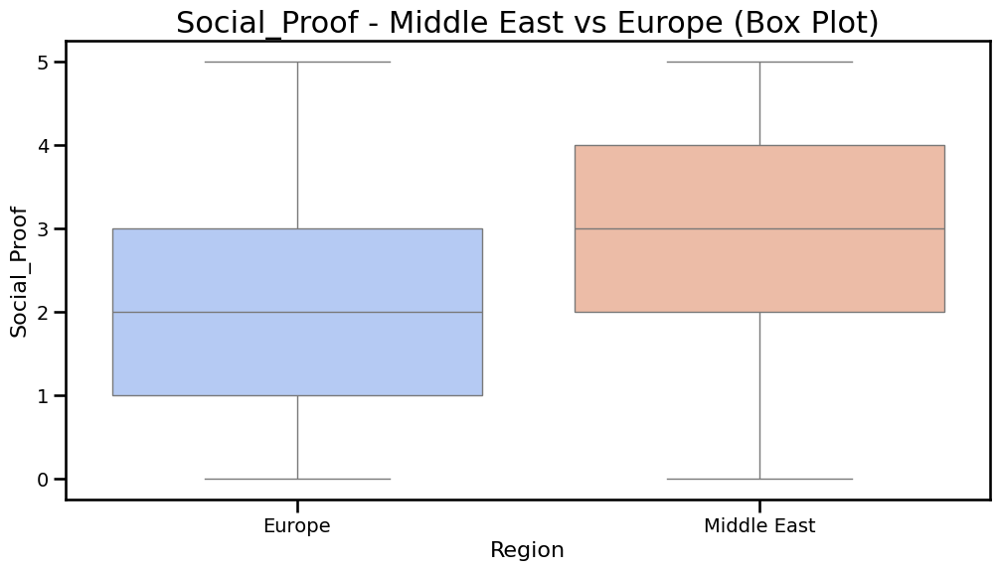

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


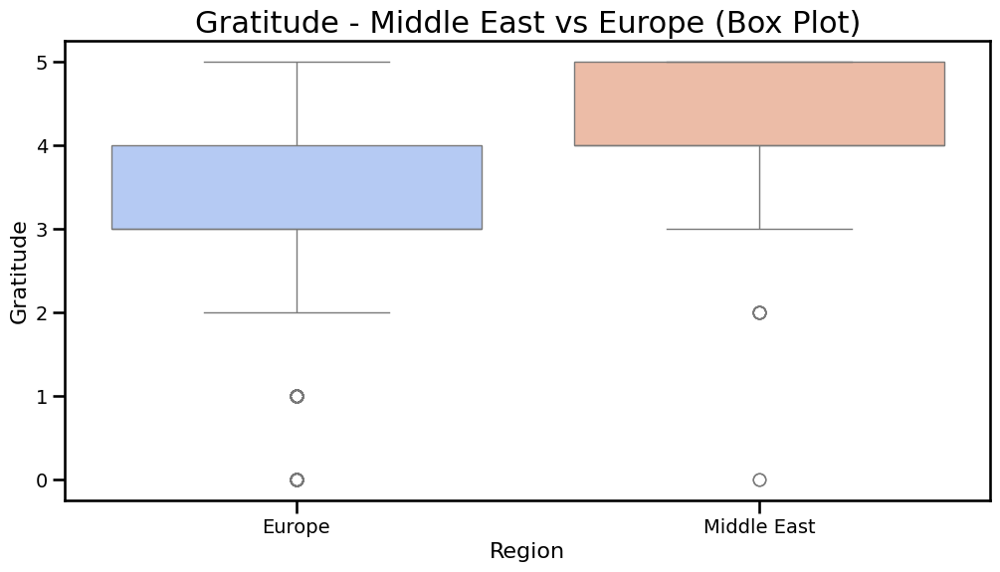

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


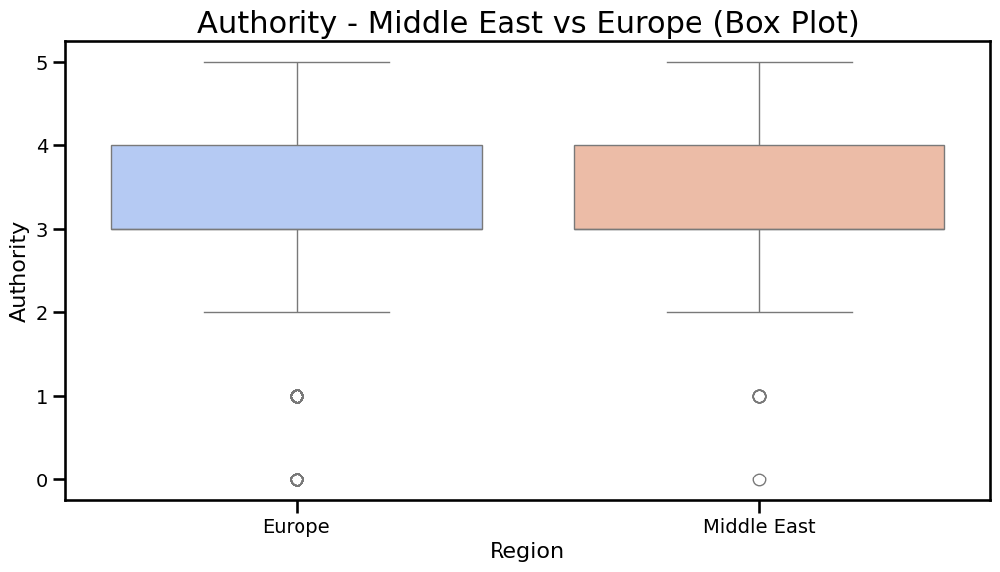

<ipython-input-6-cfc85968ed41>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


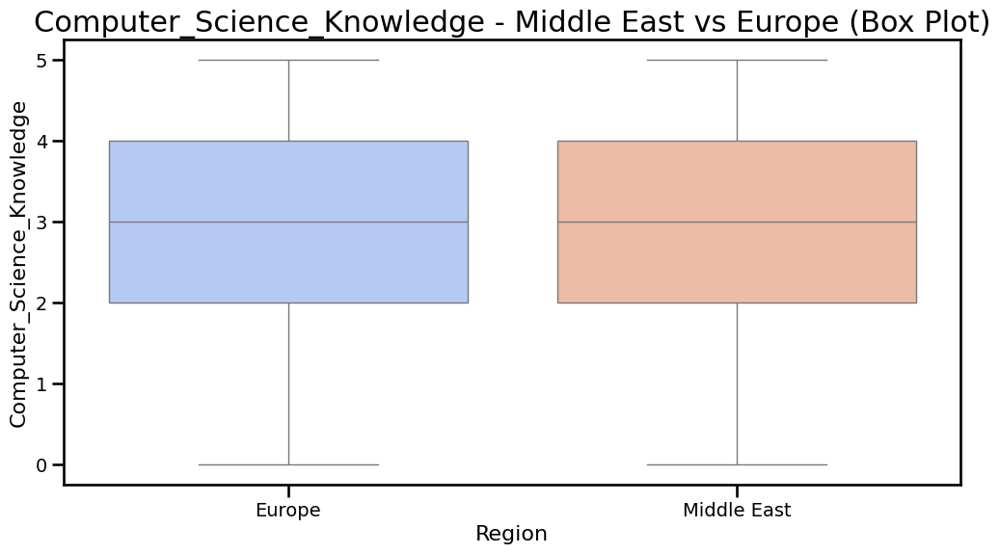

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a directory to save the visualizations
output_dir = "output_visualizations"
os.makedirs(output_dir, exist_ok=True)

# Set font sizes for the visualizations
sns.set_context("talk", font_scale=1.2)  # Adjust font scale as needed

# Filter records for "Middle East" and "Europe" from the 'region' column
middle_east_df = df[df['region'] == "Middle East"]
europe_df = df[df['region'] == "Europe"]

# Define the traits to visualize
traits = [
    'self_confidence', 'impulsivity', 'curiosity', 'risk_propensity', 'risk_perception',
    'privacy_data', 'extraversion', 'agreeableness', 'conscientiousness',
    'emotional_stability', 'openness', 'scarcity', 'consistency', 'social_proof',
    'gratitude', 'authority', 'computer_science_knowledge'
]

# Visualization: Average results between the two regions
plt.figure(figsize=(8, 5))
avg_results = pd.DataFrame({
    'Region': ['Middle East', 'Europe'],
    'Average Result': [middle_east_df['result'].mean(), europe_df['result'].mean()]
})
sns.barplot(data=avg_results, x='Region', y='Average Result', palette='coolwarm')
plt.title("Average Results Between Middle East and Europe", fontsize=22)
plt.ylabel("Average Result", fontsize=20)
plt.xlabel("Region", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.savefig(os.path.join(output_dir, "average_results_barplot.png"))
plt.show()

# Visualizations: Distribution of each trait for both regions
for trait in traits:
    plt.figure(figsize=(12, 6))
    sns.kdeplot(middle_east_df[trait], label='Middle East', fill=True, alpha=0.5, color='blue')
    sns.kdeplot(europe_df[trait], label='Europe', fill=True, alpha=0.5, color='red')
    plt.title(f"Distribution of {trait.title()} - Middle East vs Europe", fontsize=18)
    plt.xlabel(trait.title(), fontsize=20)
    plt.ylabel("Density", fontsize=20)
    plt.legend(fontsize=18)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.savefig(os.path.join(output_dir, f"distribution_{trait}.png"))
    plt.show()

# Visualization: Average results between the two regions using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(
    data=df[df['region'].isin(["Middle East", "Europe"])],
    x='region',
    y='result',
    palette='coolwarm'
)
plt.title("Average Results Between Middle East and Europe (Box Plot)", fontsize=22)
plt.ylabel("Result", fontsize=20)
plt.xlabel("Region", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.savefig(os.path.join(output_dir, "average_results_boxplot.png"))
plt.show()

# Visualizations: Box plots for each trait for both regions
for trait in traits:
    plt.figure(figsize=(12, 6))
    sns.boxplot(
        data=df[df['region'].isin(["Middle East", "Europe"])],
        x='region',
        y=trait,
        palette='coolwarm'
    )
    plt.title(f"{trait.title()} - Middle East vs Europe (Box Plot)", fontsize=22)
    plt.ylabel(trait.title(), fontsize=16)
    plt.xlabel("Region", fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.savefig(os.path.join(output_dir, f"boxplot_{trait}.png"))
    plt.show()


#**Data Preprocessing**

In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import StandardScaler, LabelEncoder, QuantileTransformer
# from sklearn.linear_model import LogisticRegression  # Import Logistic Regression
# from sklearn.neighbors import NearestNeighbors
# from scipy.stats import kendalltau
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Step 2: Separate Numerical and Categorical Columns
# numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
# categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# # Step 3: Detect Imbalanced Features and Apply Matching Quasi-Experiment
# imbalance_threshold = 0.6  # Define threshold for imbalance detection
# imbalanced_columns = []

# for column in categorical_columns:
#     # Check if the column has an imbalance
#     category_counts = df[column].value_counts(normalize=True)
#     if category_counts.iloc[0] >= imbalance_threshold:
#         imbalanced_columns.append(column)

# print("Imbalanced columns detected for matching:")
# print(imbalanced_columns)

# # Apply Propensity Score Matching (PSM) to balance data
# balanced_data = []

# for column in imbalanced_columns:
#     print(f"Balancing column using PSM: {column}")

#     # Encode the target column as binary
#     df['target_binary'] = (df[column] != df[column].value_counts().idxmax()).astype(int)

#     # Define features and target for logistic regression
#     features = [col for col in df.columns if col not in categorical_columns + ['target_binary']]
#     X = df[features].copy()
#     y = df['target_binary']

#     # Scale numerical features
#     scaler = StandardScaler()
#     X_scaled = scaler.fit_transform(X)

#     # Fit logistic regression for propensity score calculation
#     model = LogisticRegression(max_iter=500)
#     model.fit(X_scaled, y)
#     df['propensity_score'] = model.predict_proba(X_scaled)[:, 1]

#     # Separate majority and minority groups
#     majority_group = df[df['target_binary'] == 0]
#     minority_group = df[df['target_binary'] == 1]

#     # Use Nearest Neighbors for matching
#     nn = NearestNeighbors(n_neighbors=1)
#     nn.fit(majority_group[['propensity_score']])
#     _, indices = nn.kneighbors(minority_group[['propensity_score']])

#     # Select matched majority samples
#     matched_majority = majority_group.iloc[indices.flatten()]
#     balanced_group = pd.concat([minority_group, matched_majority])

#     # Append balanced data for this column
#     balanced_data.append(balanced_group.drop(columns=['target_binary', 'propensity_score']))

# # Combine all balanced datasets
# if not balanced_data:
#     raise ValueError("No imbalanced data found to balance. Check your imbalance threshold or dataset.")
# df_balanced = pd.concat(balanced_data).reset_index(drop=True)

# # Step 4: Determine Encoding Using Kendall Tau
# def determine_encoding(data, categorical_columns, numerical_columns):
#     """
#     Determines whether a categorical column should use one-hot encoding or label encoding
#     based on Kendall Tau correlation with numerical columns.
#     """
#     encoding_decisions = {}

#     for cat_col in categorical_columns:
#         high_correlation = False
#         for num_col in numerical_columns:
#             tau, p_value = kendalltau(data[cat_col].astype(str), data[num_col])
#             if abs(tau) > 0.3 and p_value < 0.05:
#                 high_correlation = True
#                 break

#         encoding_decisions[cat_col] = 'Label Encoding' if high_correlation else 'One-Hot Encoding'

#     return encoding_decisions

# encoding_decisions = determine_encoding(df_balanced, categorical_columns, numerical_columns)
# print("Encoding decisions for categorical columns:")
# print(encoding_decisions)

# # Step 5: Apply Encoding Automatically
# label_encoders = {}
# for col, encoding_type in encoding_decisions.items():
#     if encoding_type == 'Label Encoding':
#         le = LabelEncoder()
#         df_balanced[col] = le.fit_transform(df_balanced[col].astype(str))
#         label_encoders[col] = le
#     elif encoding_type == 'One-Hot Encoding':
#         # Handle one-hot encoding with reindexing to ensure all categories are present
#         one_hot = pd.get_dummies(df_balanced[col], prefix=col)

#         # Add missing categories if needed
#         all_categories = [f"{col}_{category}" for category in df[col].unique()]
#         one_hot = one_hot.reindex(columns=all_categories, fill_value=0)

#         df_balanced = pd.concat([df_balanced, one_hot], axis=1)
#         df_balanced.drop(columns=[col], inplace=True)

# # Step 5.1: Check for correlation
# correlation_matrix = df_balanced.corr()
# sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
# plt.title("Correlation Matrix")
# plt.show()

# # Step 5.2: Drop highly correlated features
# threshold = 0.9
# high_corr_features = set()

# for i in range(len(correlation_matrix.columns)):
#     for j in range(i):
#         if abs(correlation_matrix.iloc[i, j]) > threshold:
#             colname = correlation_matrix.columns[i]
#             high_corr_features.add(colname)

# print("Highly correlated features to drop:", high_corr_features)
# #df_balanced.drop(columns=high_corr_features, inplace=True)

# # Step 6: Scaling and Transformation
# quantile_transformer = QuantileTransformer(output_distribution='normal')
# df_balanced[numerical_columns] = quantile_transformer.fit_transform(df_balanced[numerical_columns])

# scaler = StandardScaler()
# df_balanced[numerical_columns] = scaler.fit_transform(df_balanced[numerical_columns])

# # Step 7: Handle Outliers by Clipping
# outlier_columns = ['self_confidence', 'risk_propensity', 'work_hours_prior_test']
# for col in outlier_columns:
#     q_low = df_balanced[col].quantile(0.01)
#     q_high = df_balanced[col].quantile(0.99)
#     df_balanced[col] = df_balanced[col].clip(lower=q_low, upper=q_high)

# # Step 8: Convert Columns to Float for Consistency
# def convert_columns_to_float(df):
#     for column in df.columns:
#         try:
#             df[column] = df[column].astype(float)
#         except ValueError:
#             print(f"Column '{column}' could not be converted to float and was skipped.")
#     return df

# df_balanced = convert_columns_to_float(df_balanced)
# df_balanced = df_balanced.fillna(0)

# # Step 9: Drop Irrelevant Columns
# columns_to_drop = [
#     "id_1", "id_2", "id_3", "id_4", "id_5", "id_6", "id_7", "id_8", "id_9", "id_10",
#     "time_taken_to_answer_1", "time_taken_to_answer_2", "time_taken_to_answer_3",
#     "time_taken_to_answer_4", "time_taken_to_answer_5", "time_taken_to_answer_6",
#     "time_taken_to_answer_7", "time_taken_to_answer_8", "time_taken_to_answer_9",
#     "time_taken_to_answer_10", "test_answer_1", "test_answer_2", "test_answer_3",
#     "test_answer_4", "test_answer_5", "test_answer_6", "test_answer_7", "test_answer_8",
#     "test_answer_9", "test_answer_10", "email_id_1", "email_id_2", "email_id_3", "email_id_4", "email_id_5", "email_id_6",
#     "email_id_7", "email_id_8", "email_id_9", "email_id_10", "reported_as_spam_1",
#     "reported_as_spam_2", "reported_as_spam_3", "reported_as_spam_4", "reported_as_spam_5",
#     "reported_as_spam_6", "reported_as_spam_7", "reported_as_spam_8", "reported_as_spam_9",
#     "reported_as_spam_10", "antiPhishing_course"
# ]

# df = df_balanced.drop(columns=columns_to_drop, errors='ignore')
# df_copy = df.copy(deep=True)

# # Step 10: Final Dataframe Check
# print("Preprocessing complete. Data is ready for further analysis or modeling:")
# print(df_copy.info())
# print(df_copy.isna().sum())


Encoding decisions for categorical columns:
{'gender': 'One-Hot Encoding', 'test_location': 'One-Hot Encoding'}


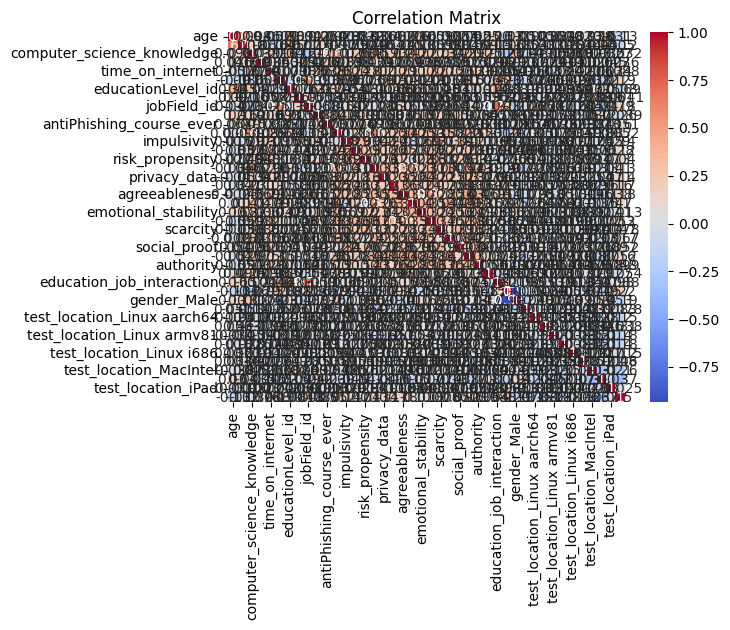

Highly correlated features to drop: {'gender_Male'}
Preprocessing complete. Data is ready for further analysis or modeling:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1496 entries, 0 to 1495
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   age                          1496 non-null   float64
 1   years_job_experience         1496 non-null   float64
 2   computer_science_knowledge   1496 non-null   float64
 3   phishing_attack              1496 non-null   float64
 4   time_on_internet             1496 non-null   float64
 5   educationField_id            1496 non-null   float64
 6   educationLevel_id            1496 non-null   float64
 7   employmentType_id            1496 non-null   float64
 8   jobField_id                  1496 non-null   float64
 9   work_hours_prior_test        1496 non-null   float64
 10  antiPhishing_course_ever     1496 non-null   float64
 11  self_confi

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder, QuantileTransformer
from scipy.stats import kendalltau
import matplotlib.pyplot as plt
import seaborn as sns

# Step 2: Separate Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Step 3: Detect and Handle Imbalance by Assigning Sample Weights

# Initialize a dictionary to store weights for each instance
sample_weights = pd.Series([1.0] * len(df), index=df.index)

# Calculate sample weights for imbalanced categorical columns
imbalance_threshold = 0.8  # Define threshold for imbalance detection (e.g., 80% or more of instances in one class)

for column in categorical_columns:
    # Check if the column has an imbalance
    category_counts = df[column].value_counts(normalize=True)
    if category_counts.iloc[0] >= imbalance_threshold:  # Check if the largest class exceeds the threshold
        # Assign higher weights to minority classes
        for category, proportion in category_counts.items():  # Changed iteritems() to items()
            if proportion < imbalance_threshold:  # Only increase weight for minority classes
                # Calculate inverse proportional weight
                weight = 1 / proportion
                sample_weights[df[column] == category] *= weight


# Step 4: Determine Encoding Using Kendall Tau

def determine_encoding(data, categorical_columns, numerical_columns):
    """
    Determines whether a categorical column should use one-hot encoding or label encoding
    based on Kendall Tau correlation with numerical columns.

    Parameters:
    data (pd.DataFrame): The dataset.
    categorical_columns (list): List of categorical column names.
    numerical_columns (list): List of numerical column names.

    Returns:
    dict: Dictionary with columns and their recommended encoding method.
    """
    encoding_decisions = {}

    for cat_col in categorical_columns:
        high_correlation = False

        for num_col in numerical_columns:
            # Calculate Kendall Tau correlation
            tau, p_value = kendalltau(data[cat_col].astype(str), data[num_col])

            # Check if correlation is significant
            if abs(tau) > 0.3 and p_value < 0.05:  # Adjust threshold as needed
                high_correlation = True
                break

        # Decide encoding type based on correlation
        if high_correlation:
            encoding_decisions[cat_col] = 'Label Encoding'
        else:
            encoding_decisions[cat_col] = 'One-Hot Encoding'

    return encoding_decisions

# Example usage
encoding_decisions = determine_encoding(df, categorical_columns, numerical_columns)
print("Encoding decisions for categorical columns:")
print(encoding_decisions)

# Step 5: Apply Encoding Automatically
label_encoders = {}
for col, encoding_type in encoding_decisions.items():
    if encoding_type == 'Label Encoding':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le  # Save the label encoder for potential inverse transformation
    elif encoding_type == 'One-Hot Encoding':
        one_hot = pd.get_dummies(df[col], prefix=col)
        df = pd.concat([df, one_hot], axis=1)
        df.drop(columns=[col], inplace=True)

# Step 5.1: Check for correlation
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

# Step 5.2: Drop highly correlated features
threshold = 0.9  # Correlation threshold
high_corr_features = set()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            high_corr_features.add(colname)

print("Highly correlated features to drop:", high_corr_features)

# Step 6: Scaling and Transformation

# Log-transform skewed numerical columns to reduce outliers' impact
# skewed_columns = ['time_on_internet']  # Add any other skewed columns
# df[skewed_columns] = df[skewed_columns].apply(lambda x: np.log1p(x))

# Apply QuantileTransformer to normalize and reduce skewness effectively
quantile_transformer = QuantileTransformer(output_distribution='normal')
df[numerical_columns] = quantile_transformer.fit_transform(df[numerical_columns])

# Standardize numerical features
scaler = StandardScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

# Step 7: Handle Outliers by Clipping
outlier_columns = ['self_confidence', 'risk_propensity', 'work_hours_prior_test']
for col in outlier_columns:
    q_low = df[col].quantile(0.01)
    q_high = df[col].quantile(0.99)
    df[col] = df[col].clip(lower=q_low, upper=q_high)

# Step 8: Convert Columns to Float for Consistency
def convert_columns_to_float(df):
    for column in df.columns:
        try:
            df[column] = df[column].astype(float)
        except ValueError:
            print(f"Column '{column}' could not be converted to float and was skipped.")
    return df

df = convert_columns_to_float(df)
df_copy = df.copy(deep=True)

# Step 9: Drop Irrelevant Columns
columns_to_drop = [
    "id_1", "id_2", "id_3", "id_4", "id_5", "id_6", "id_7", "id_8", "id_9", "id_10",
    "time_taken_to_answer_1", "time_taken_to_answer_2", "time_taken_to_answer_3",
    "time_taken_to_answer_4", "time_taken_to_answer_5", "time_taken_to_answer_6",
    "time_taken_to_answer_7", "time_taken_to_answer_8", "time_taken_to_answer_9",
    "time_taken_to_answer_10", "test_answer_1", "test_answer_2", "test_answer_3",
    "test_answer_4", "test_answer_5", "test_answer_6", "test_answer_7", "test_answer_8",
    "test_answer_9", "test_answer_10", "email_id_1", "email_id_2", "email_id_3", "email_id_4", "email_id_5", "email_id_6",
    "email_id_7", "email_id_8", "email_id_9", "email_id_10", "reported_as_spam_1",
    "reported_as_spam_2", "reported_as_spam_3", "reported_as_spam_4", "reported_as_spam_5",
    "reported_as_spam_6", "reported_as_spam_7", "reported_as_spam_8", "reported_as_spam_9",
    "reported_as_spam_10", "antiPhishing_course"
]

#df_copy = df.drop(columns=columns_to_drop)

# Step 10: Final Dataframe Check
print("Preprocessing complete. Data is ready for further analysis or modeling:")
print(df_copy.info())
print(df_copy.isna().sum())

# Optional: Save sample weights for clustering if needed in further analysis
print("Sample weights calculated for handling imbalance:\n", sample_weights)


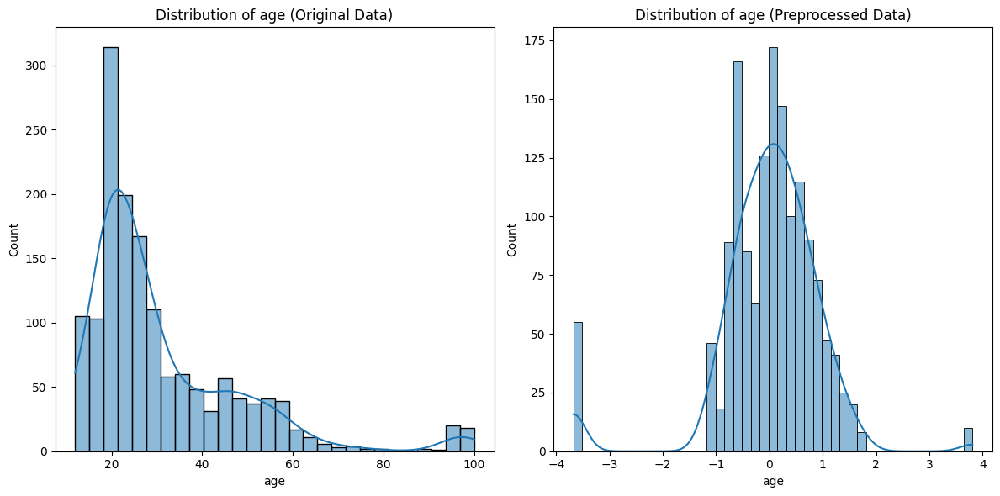

Column 'gender' not found in both dataframes.


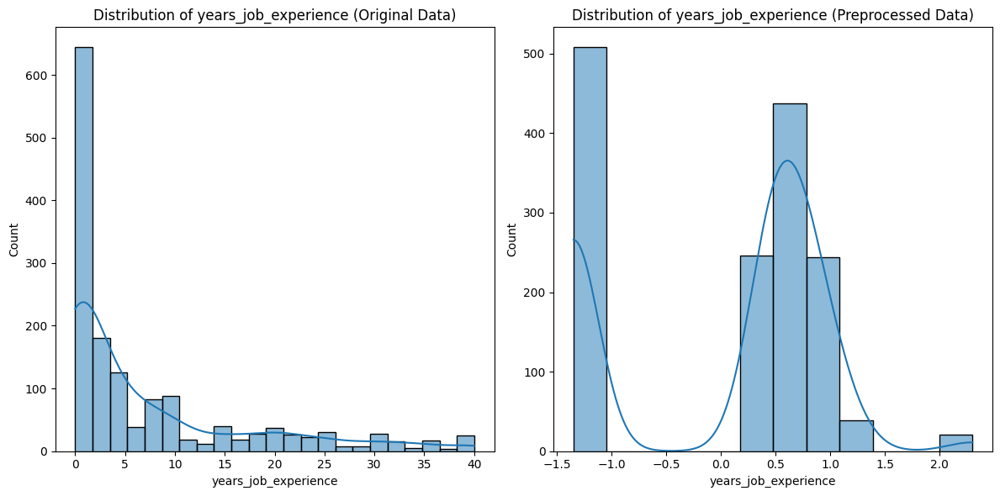

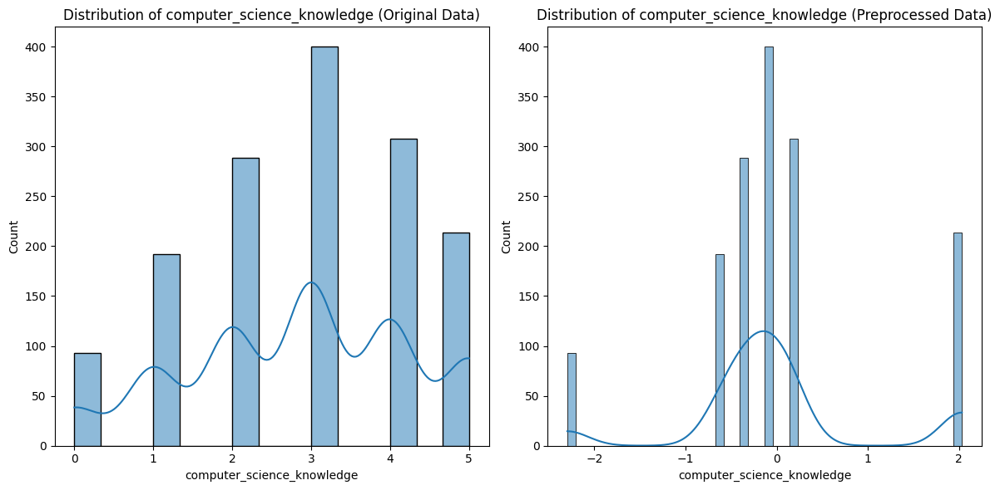

Column 'antiPhishing_course' not found in both dataframes.


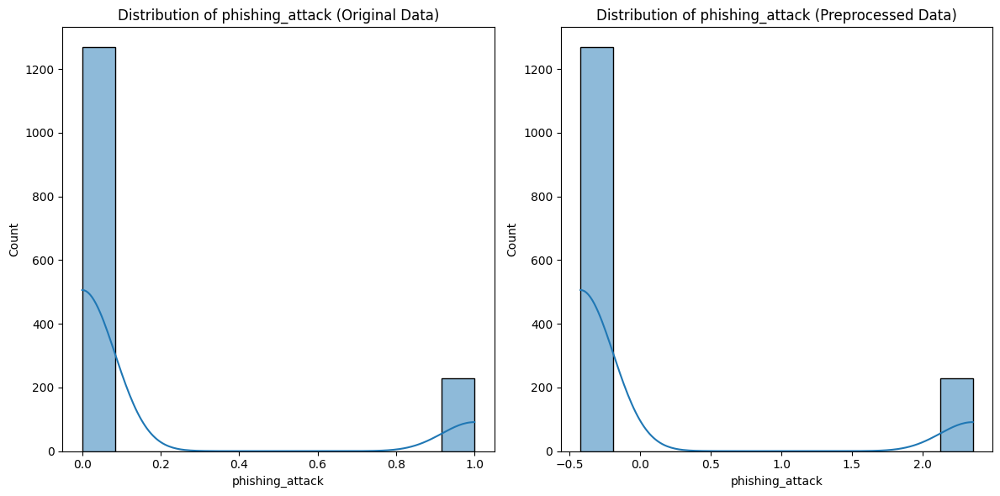

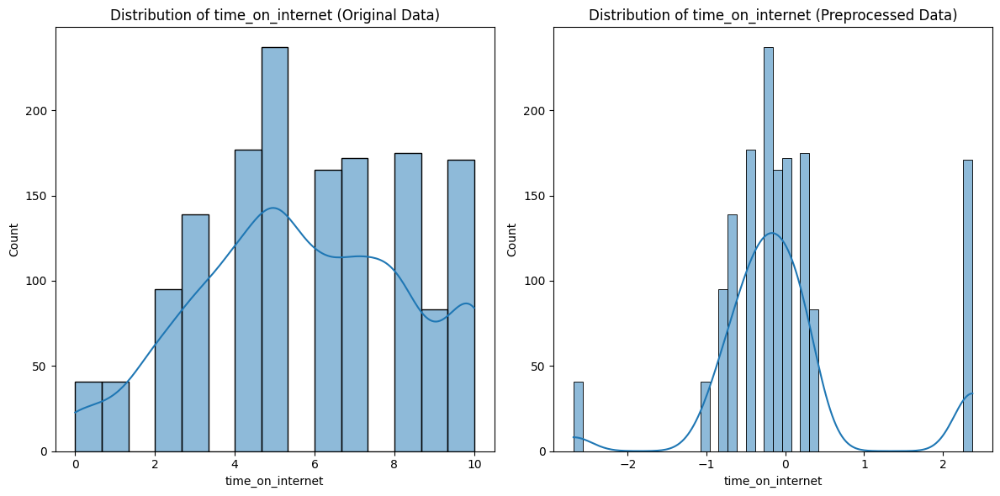

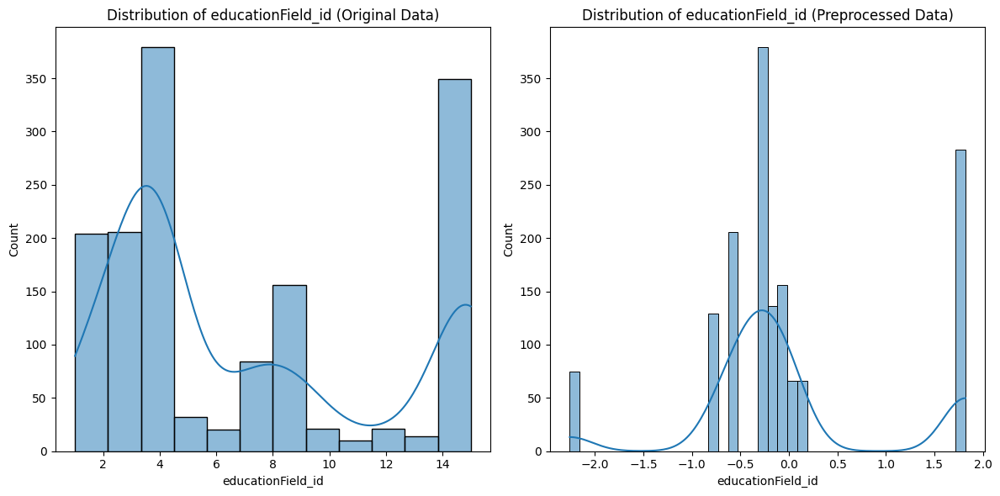

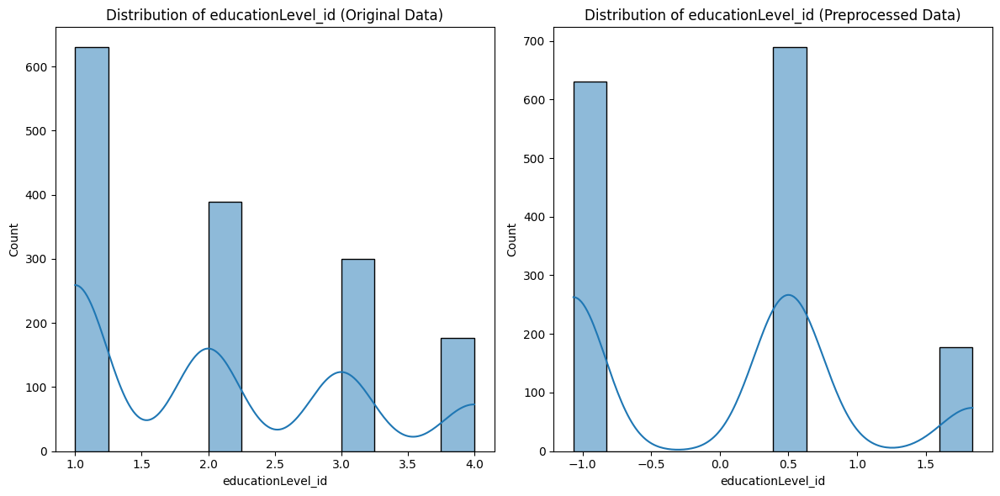

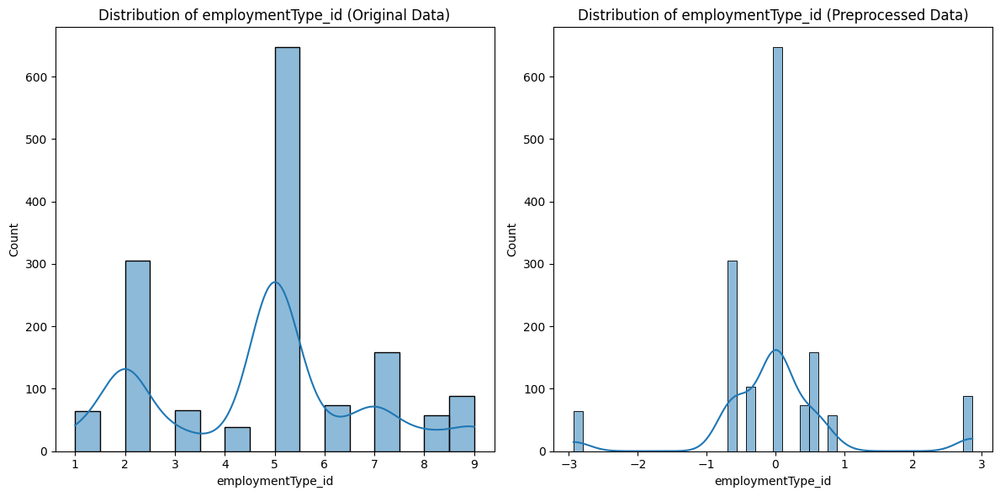

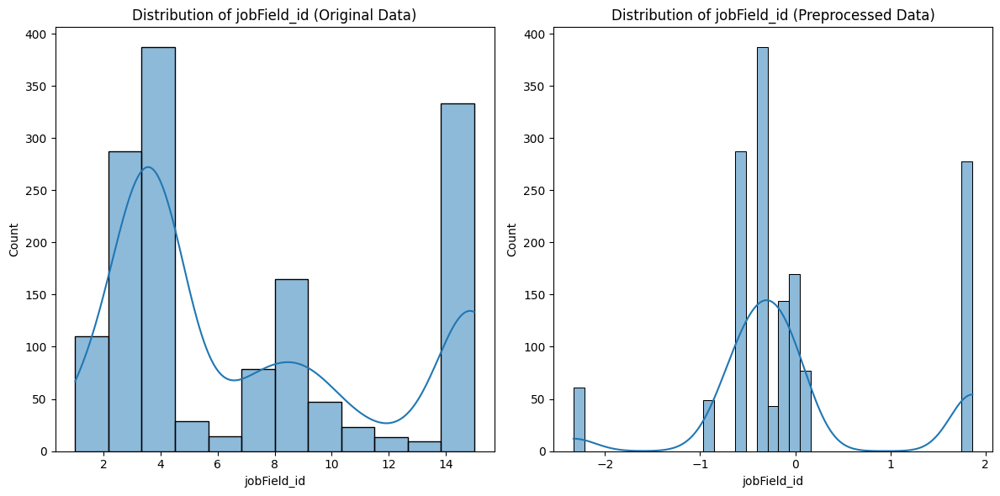

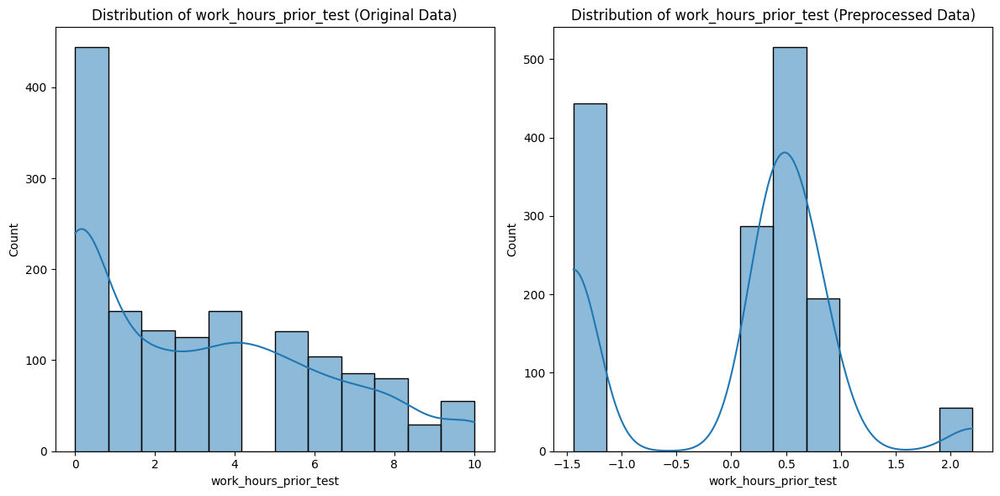

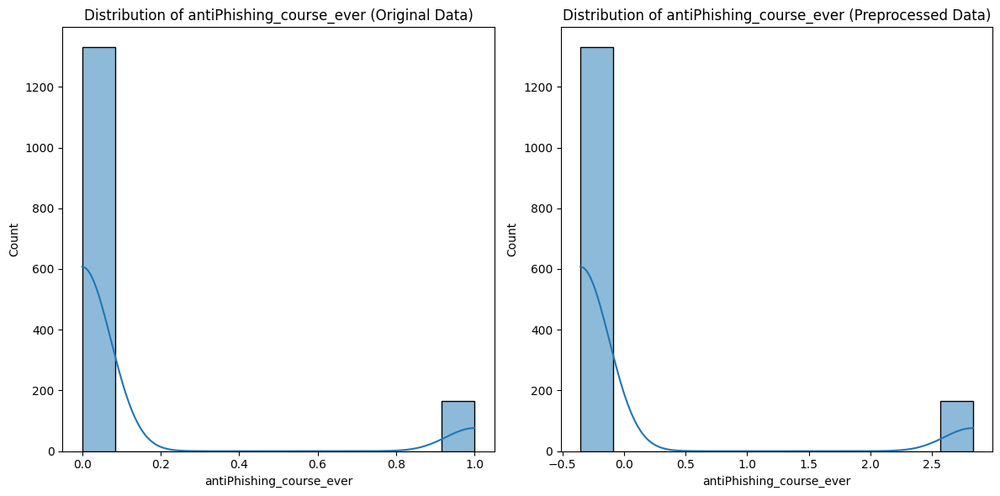

Column 'id_1' not found in both dataframes.
Column 'id_2' not found in both dataframes.
Column 'id_3' not found in both dataframes.
Column 'id_4' not found in both dataframes.
Column 'id_5' not found in both dataframes.
Column 'id_6' not found in both dataframes.
Column 'id_7' not found in both dataframes.
Column 'id_8' not found in both dataframes.
Column 'id_9' not found in both dataframes.
Column 'id_10' not found in both dataframes.
Column 'time_taken_to_answer_1' not found in both dataframes.
Column 'time_taken_to_answer_2' not found in both dataframes.
Column 'time_taken_to_answer_3' not found in both dataframes.
Column 'time_taken_to_answer_4' not found in both dataframes.
Column 'time_taken_to_answer_5' not found in both dataframes.
Column 'time_taken_to_answer_6' not found in both dataframes.
Column 'time_taken_to_answer_7' not found in both dataframes.
Column 'time_taken_to_answer_8' not found in both dataframes.
Column 'time_taken_to_answer_9' not found in both dataframes.
C

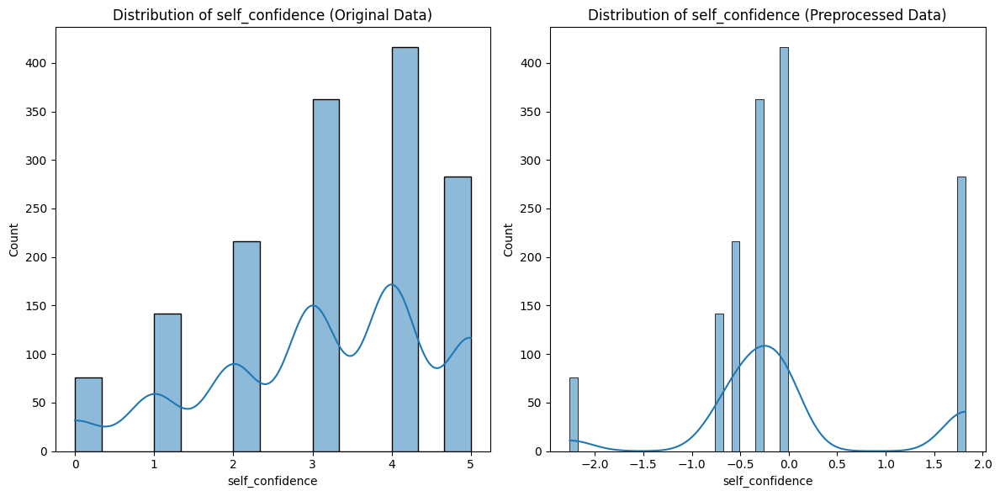

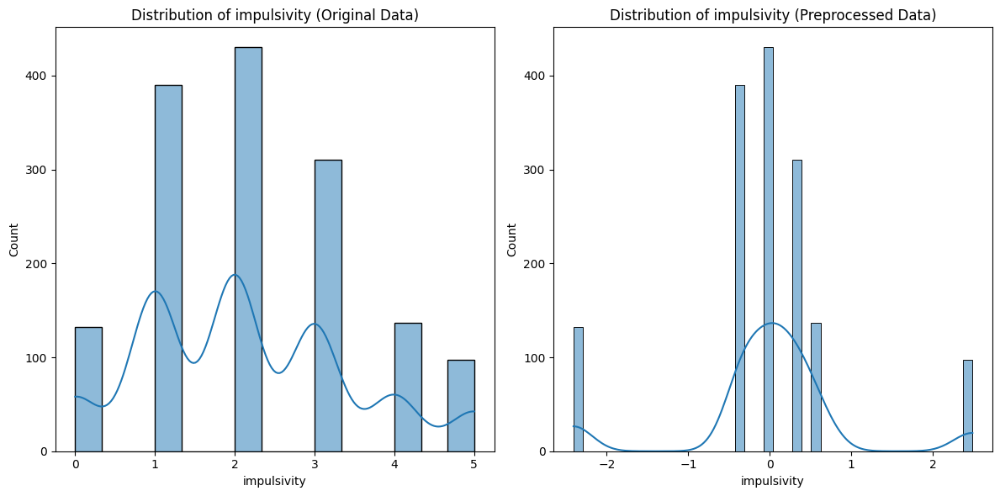

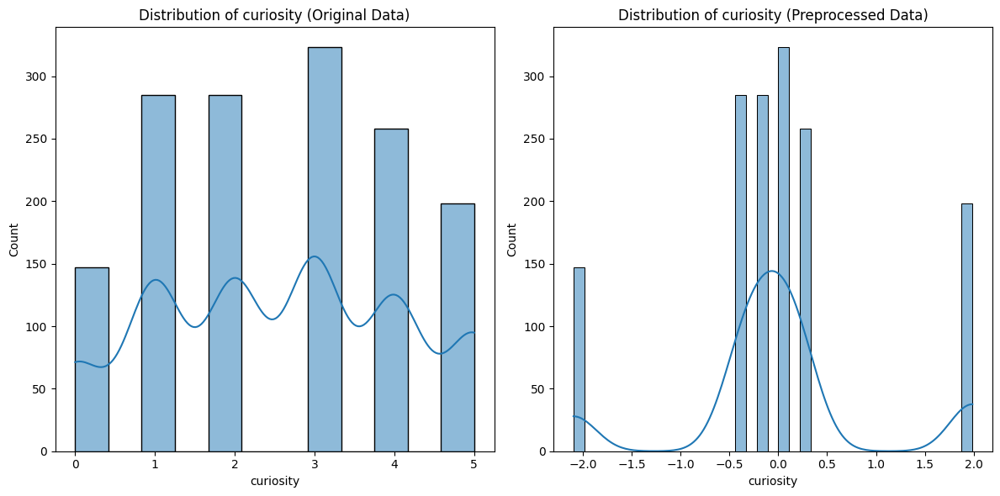

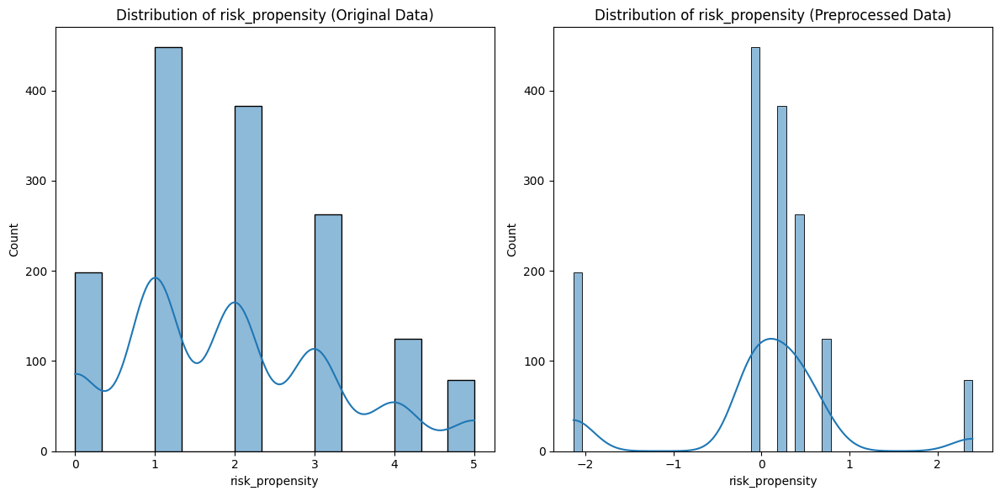

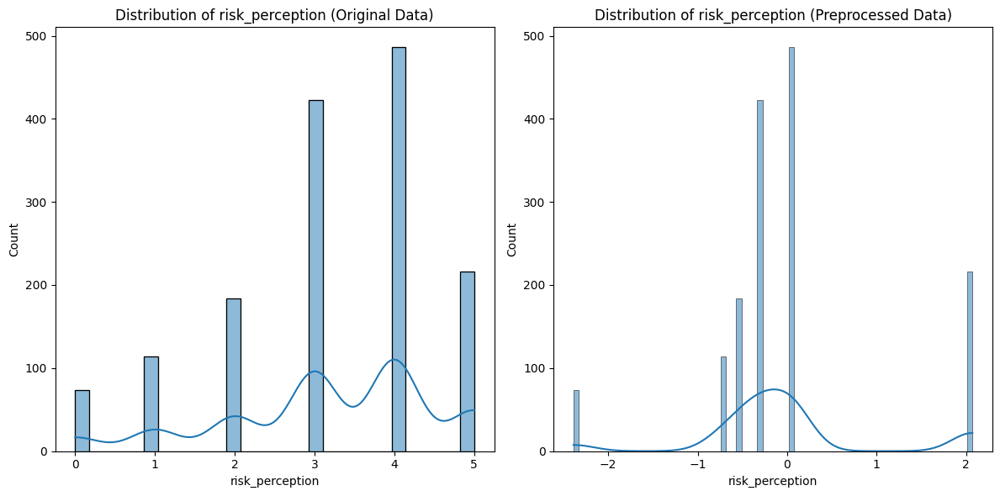

...

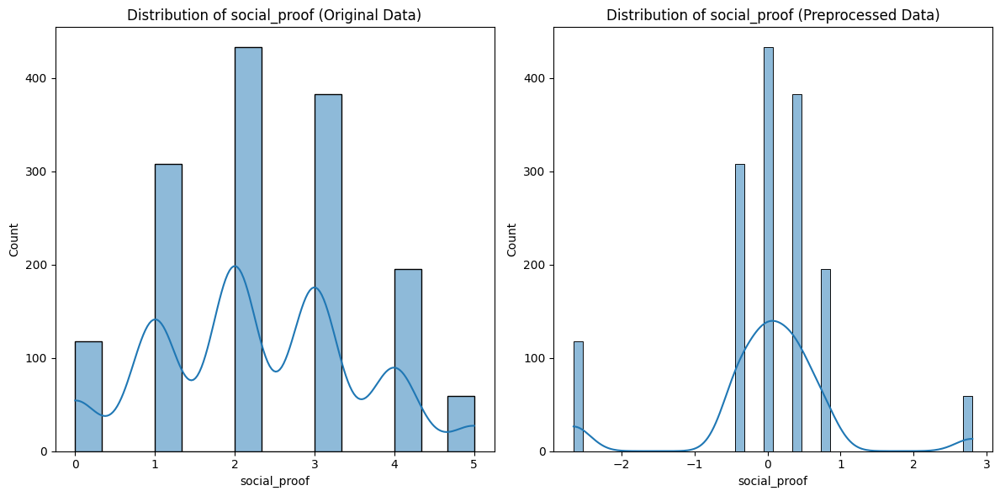

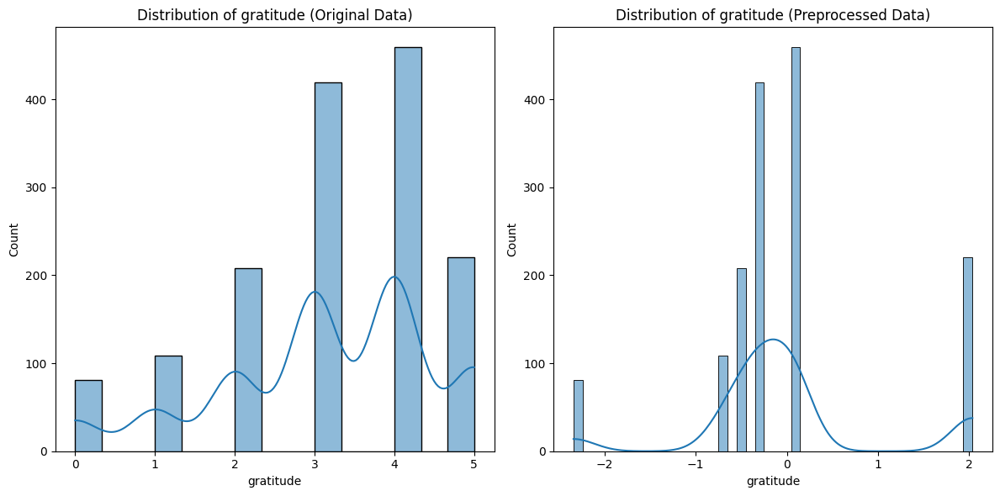

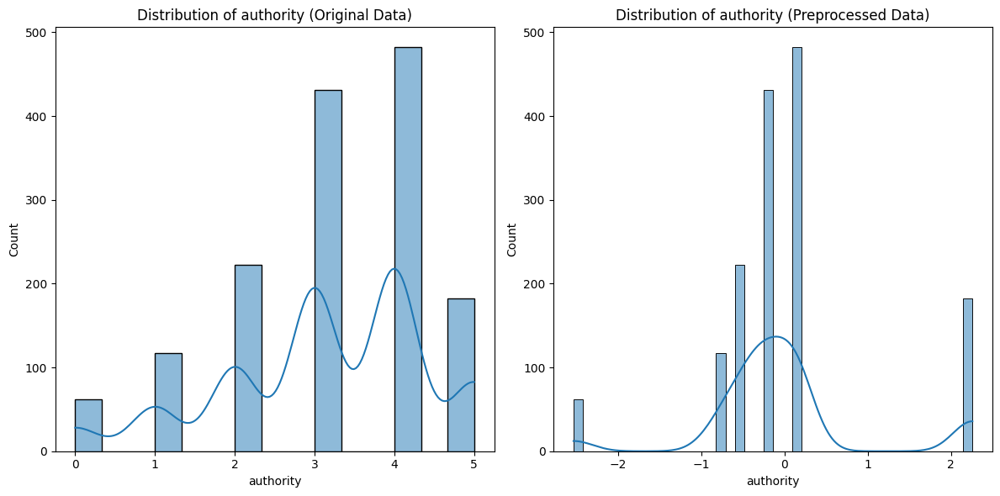

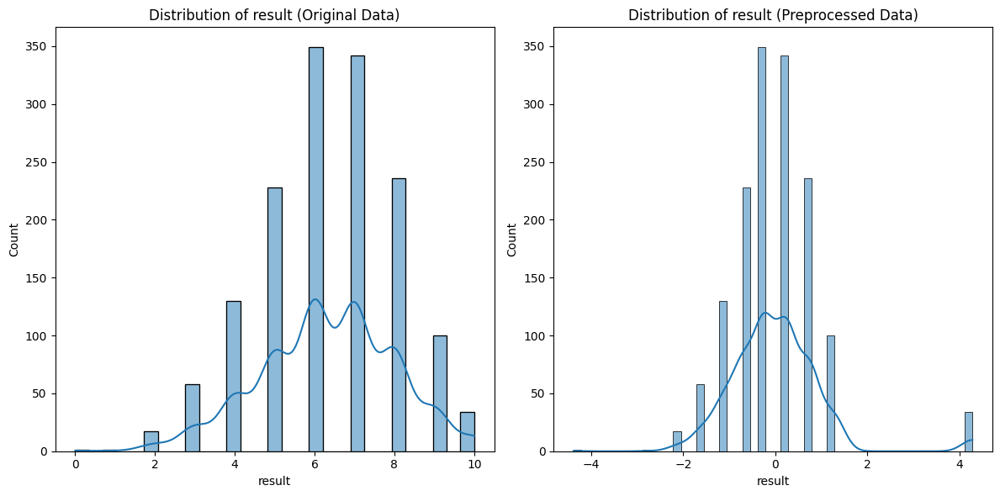

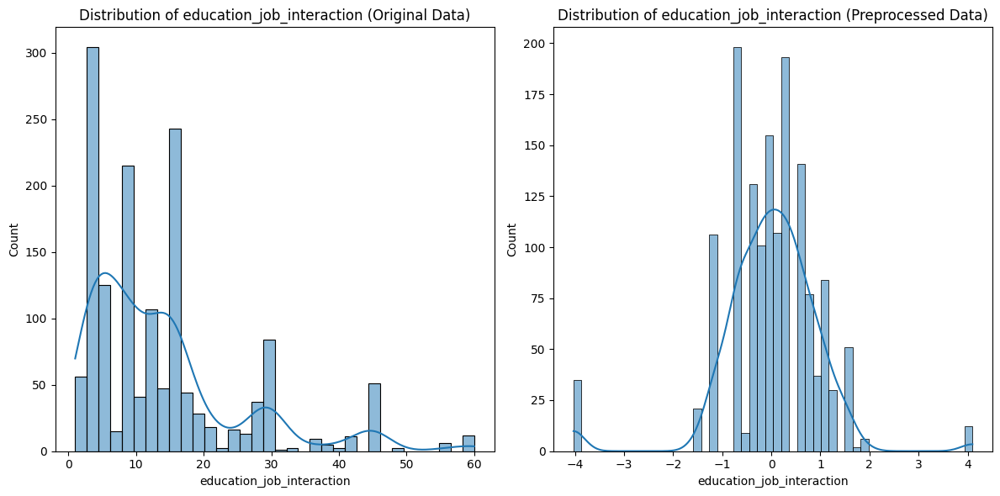

Column 'region' not found in both dataframes.


In [ ]:
# prompt: write a code to compare the distribution of each column in both df_actual (dataset before preprocessing) and df_copy (dataset after preprocessing) using informative visualizations

import matplotlib.pyplot as plt
import seaborn as sns

def compare_distributions(df_actual, df_copy):
  """
  Compares the distribution of each column in two dataframes using histograms.

  Args:
    df_original: The original dataframe.
    df_copy: The preprocessed dataframe.
  """
  for col in df_actual.columns:
    if col in df_copy.columns:  # Check if the column exists in both dataframes
      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      sns.histplot(df_actual[col], kde=True)
      plt.title(f'Distribution of {col} (Original Data)')

      plt.subplot(1, 2, 2)
      sns.histplot(df_copy[col], kde=True)
      plt.title(f'Distribution of {col} (Preprocessed Data)')

      plt.tight_layout()
      plt.show()
    else:
      print(f"Column '{col}' not found in both dataframes.")


# Assuming df_actual and df_copy are already defined from your previous code
compare_distributions(df_original, df_copy)

In [ ]:
df_copy = df_copy.drop(columns=['result'])
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1496 entries, 0 to 1495
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   age                          1496 non-null   float64
 1   years_job_experience         1496 non-null   float64
 2   computer_science_knowledge   1496 non-null   float64
 3   phishing_attack              1496 non-null   float64
 4   time_on_internet             1496 non-null   float64
 5   educationField_id            1496 non-null   float64
 6   educationLevel_id            1496 non-null   float64
 7   employmentType_id            1496 non-null   float64
 8   jobField_id                  1496 non-null   float64
 9   work_hours_prior_test        1496 non-null   float64
 10  antiPhishing_course_ever     1496 non-null   float64
 11  self_confidence              1496 non-null   float64
 12  impulsivity                  1496 non-null   float64
 13  curiosity         

# **Data Analysis**

# **Clustering**

## Dimensionality Reduction (PCA)

In [ ]:
columns_with_nans = df_copy.columns[df_copy.isna().any()].tolist()
print("Columns with NaN values:", columns_with_nans)

Columns with NaN values: []


Number of components to explain 90% of the variance: 24


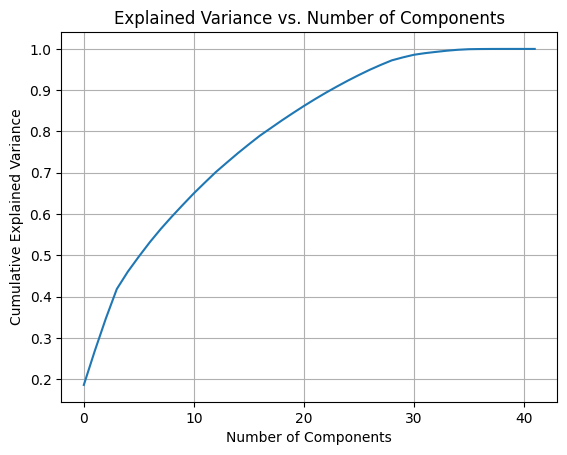

[[ 0.62463242  0.54358205 -1.57767257 ...  0.1411943   1.24438439
   0.18044359]
 [ 1.16158362 -2.16835867  2.99646309 ... -0.92698968  0.55477641
   0.86280624]
 [ 2.81310831 -1.10615933 -1.32366076 ...  0.40406284 -1.7432477
  -1.50630791]
 ...
 [-1.6350015   0.71165995  0.63621529 ... -0.09635069  0.30817359
   0.02522498]
 [ 4.71128706  4.02941176 -0.57970207 ...  0.05281053 -2.27845532
   2.04906032]
 [-1.92121527  0.31211135 -0.2815946  ...  0.27735582 -0.15543026
   0.34613055]]


In [ ]:
# Apply PCA without specifying n_components to analyze all components
pca = PCA()
pca.fit(df_copy)  # Replace df with your standardized dataset

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components that explain at least 90-95% of the variance
n_components = np.argmax(cumulative_variance >= 0.90) + 1  # Adjust the threshold as needed
print(f"Number of components to explain 90% of the variance: {n_components}")

# Plot cumulative explained variance to visualize component selection
import matplotlib.pyplot as plt
plt.plot(cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

pca = PCA(n_components=20)  # Choose based on explained variance
pca_features = pca.fit_transform(df_copy)
print(pca_features)


## Traditional Clustering with PCA

### Kmeans


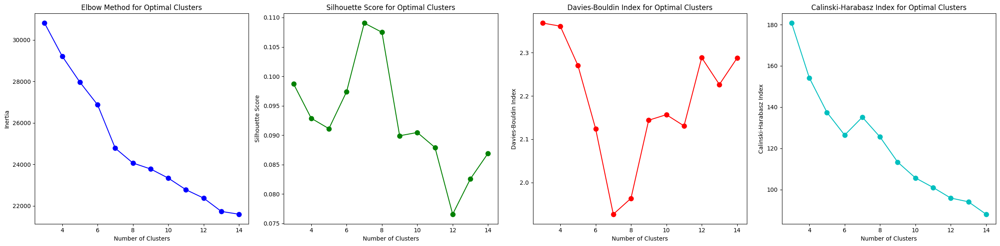

Optimal number of clusters based on silhouette score: 7
Silhouette Score for optimal clustering: 0.07990146056698612
Calinski-Harabasz Index for optimal clustering: 108.97956928906397


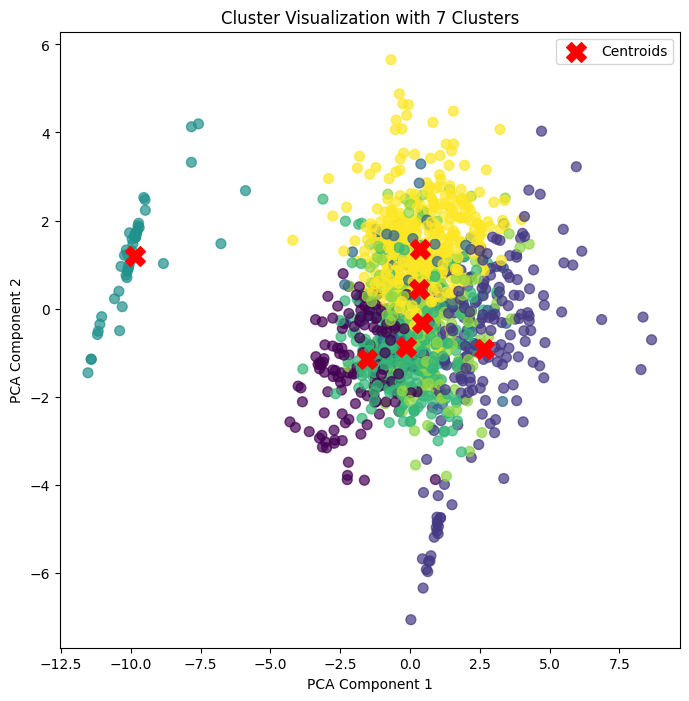

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np

# Define range for the number of clusters
cluster_range = range(3, 15)
inertia_values = []
silhouette_scores = []
db_scores = []
calinski_scores = []

# Loop over the range to calculate metrics for each number of clusters
for n_clusters in cluster_range:
    # Create KMeans without a fixed random state for freely changing centroids
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans_labels = kmeans.fit_predict(pca_features)

    # Calculate inertia (for Elbow Method)
    inertia_values.append(kmeans.inertia_)

    # Calculate silhouette score
    silhouette_avg = silhouette_score(pca_features, kmeans_labels)
    silhouette_scores.append(silhouette_avg)

    # Calculate Davies-Bouldin score
    db_index = davies_bouldin_score(pca_features, kmeans_labels)
    db_scores.append(db_index)

    # Calculate Calinski-Harabasz Index
    calinski_harabasz = calinski_harabasz_score(pca_features, kmeans_labels)
    calinski_scores.append(calinski_harabasz)

# Plot the Elbow Method, Silhouette Scores, Davies-Bouldin Index, and Calinski-Harabasz Index
plt.figure(figsize=(24, 6))

# Plot for the Elbow Method
plt.subplot(1, 4, 1)
plt.plot(cluster_range, inertia_values, 'bo-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Clusters')

# Plot for Silhouette Scores
plt.subplot(1, 4, 2)
plt.plot(cluster_range, silhouette_scores, 'go-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal Clusters')

# Plot for Davies-Bouldin Index
plt.subplot(1, 4, 3)
plt.plot(cluster_range, db_scores, 'ro-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index for Optimal Clusters')

# Plot for Calinski-Harabasz Index
plt.subplot(1, 4, 4)
plt.plot(cluster_range, calinski_scores, 'co-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Calinski-Harabasz Index')
plt.title('Calinski-Harabasz Index for Optimal Clusters')

plt.tight_layout()
plt.show()

# Choose the optimal number of clusters based on the highest silhouette score
optimal_clusters = cluster_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal number of clusters based on silhouette score: {optimal_clusters}")

# Final clustering with the optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_clusters)
kmeans_labels_optimal = kmeans_optimal.fit_predict(pca_features)
silhouette_kmeans_optimal = silhouette_score(pca_features, kmeans_labels_optimal)
calinski_kmeans_optimal = calinski_harabasz_score(pca_features, kmeans_labels_optimal)
print(f"Silhouette Score for optimal clustering: {silhouette_kmeans_optimal}")
print(f"Calinski-Harabasz Index for optimal clustering: {calinski_kmeans_optimal}")

# Plotting the final clusters
plt.figure(figsize=(8, 8))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=kmeans_labels_optimal, cmap='viridis', s=50, alpha=0.7)
centers = kmeans_optimal.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, marker='X', label='Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'Cluster Visualization with {optimal_clusters} Clusters')
plt.legend()
plt.show()


In [ ]:
# # Clustering using KMeans
# kmeans = KMeans(n_clusters=3, random_state=42)
# kmeans_labels = kmeans.fit_predict(pca_features)
# silhouette_kmeans = silhouette_score(pca_features, kmeans_labels)
# print()
# print(f"Silhouette Score for KMeans clustering: {silhouette_kmeans}")
# kmeans_score=silhouette_kmeans
# df_copy.shape

### Aggoloromative

In [ ]:
# Clustering using Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
agg_labels = agg_clustering.fit_predict(pca_features)
silhouette_agg = silhouette_score(pca_features, agg_labels)

### DBScan

In [ ]:
# Standardize the data
scaled_features = StandardScaler().fit_transform(pca_features)

# Clustering using DBSCAN
dbscan = DBSCAN(eps=0.1, min_samples=2)
dbscan_labels = dbscan.fit_predict(scaled_features)

# Check for valid clusters and compute silhouette score
if len(set(dbscan_labels)) > 1 and -1 not in set(dbscan_labels):
    silhouette_dbscan = silhouette_score(scaled_features, dbscan_labels)
else:
    silhouette_dbscan = -1

print(f"Silhouette Score: {silhouette_dbscan}")



Silhouette Score: -1


### Comparison Between Traditional Clustering Approaches

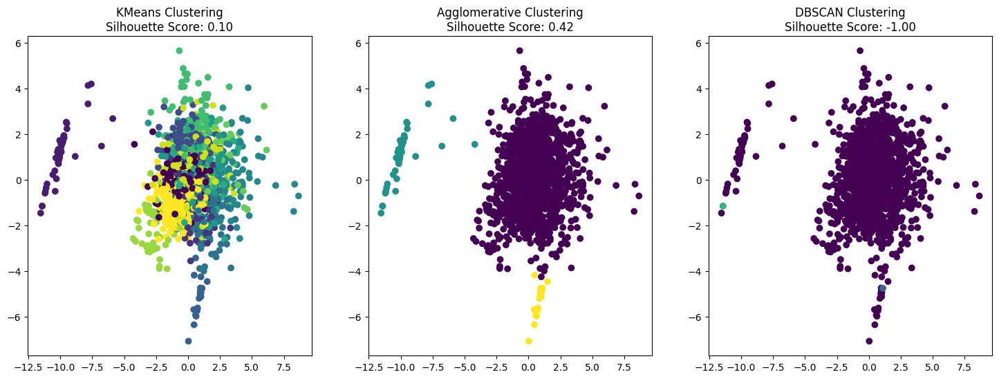

In [ ]:
# Plot clustering results
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].scatter(pca_features[:, 0], pca_features[:, 1], c=kmeans_labels)
axs[0].set_title(f'KMeans Clustering\nSilhouette Score: {silhouette_kmeans_optimal:.2f}')

axs[1].scatter(pca_features[:, 0], pca_features[:, 1], c=agg_labels)
axs[1].set_title(f'Agglomerative Clustering\nSilhouette Score: {silhouette_agg:.2f}')

axs[2].scatter(pca_features[:, 0], pca_features[:, 1], c=dbscan_labels)
axs[2].set_title(f'DBSCAN Clustering\nSilhouette Score: {silhouette_dbscan:.2f}')

plt.show()

# **Deep Clustering**

## Self-Organizing Maps (SOMs)

**Why This Method is Reliable**

*   Normalization:

Ensures metrics are on a comparable scale, preventing dominance by one metric due to its magnitude.

*   Inverse for Davies-Bouldin:

Since lower Davies-Bouldin is better, the inverse normalization ensures consistency.



*   Weighted Aggregation:

Equal weights are a starting point. Adjustments can be made based on domain knowledge.


**References:**

Jain, A. K., Murty, M. N., & Flynn, P. J. (1999). Data clustering: A review. ACM Computing Surveys, 31(3), 264-323.


Halkidi, M., Batistakis, Y., & Vazirgiannis, M. (2001). On clustering validation techniques. Journal of Intelligent Information Systems, 17(2-3), 107-145.


Milligan, G. W., & Cooper, M. C. (1985). An examination of procedures for determining the number of clusters in a data set. Psychometrika, 50(2), 159-179.


Deb, K., Pratap, A., Agarwal, S., & Meyarivan, T. (2002). A fast and elitist multi-objective genetic algorithm: NSGA-II. IEEE Transactions on Evolutionary Computation, 6(2), 182-197.

In [ ]:
!pip install minisom
# !pip install umap-learn


  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.3-py3-none-any.whl size=11706 sha256=e95bb0983962d70867a7eefa2b12d9e70ff67171b78816d30193f429358e717e
  Stored in directory: /root/.cache/pip/wheels/c8/29/ba/ee521d9a6af783a1e1efb1831fe4afdf526613849b3f58175b
Successfully built minisom


Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


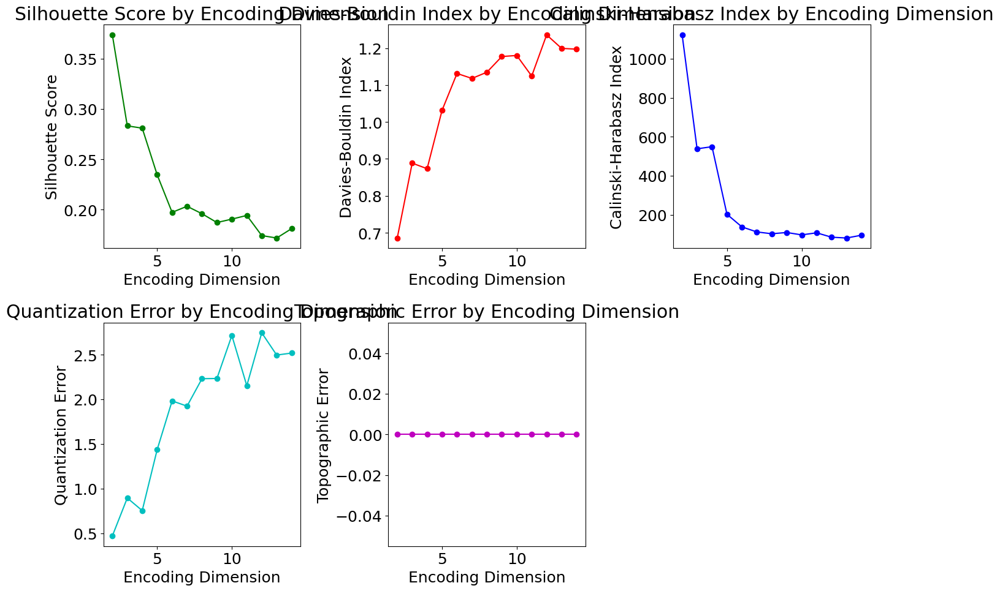

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3737
  Davies-Bouldin Index: 0.6858
  Calinski-Harabasz Index: 1122.1163
  Quantization Error: 0.4690
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4974
  - Davies-Bouldin Score: 0.6014
  - Calinski-Harabasz Index: 3128.0029


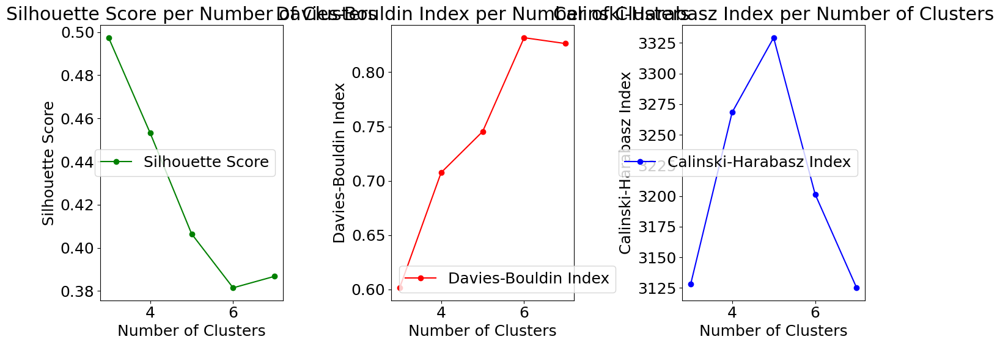

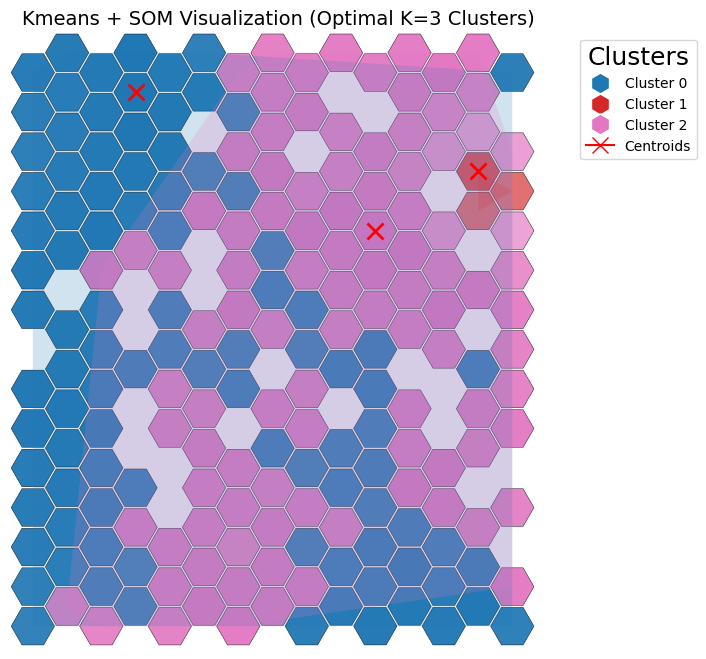

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 8.731605   7.7119055]
 [87.22343   78.87498  ]
 [26.291729  18.657156 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47

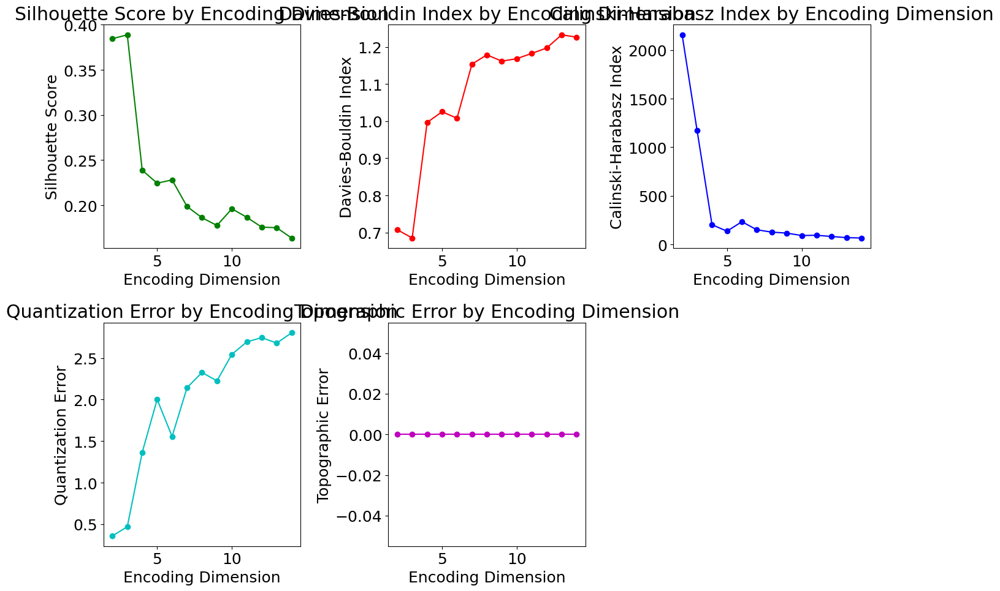

Best Encoding Dimension: 2
Best Combined Score: 0.9799
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3846
  Davies-Bouldin Index: 0.7075
  Calinski-Harabasz Index: 2157.3244
  Quantization Error: 0.3577
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.6334
  - Davies-Bouldin Score: 0.4794
  - Calinski-Harabasz Index: 4237.7226


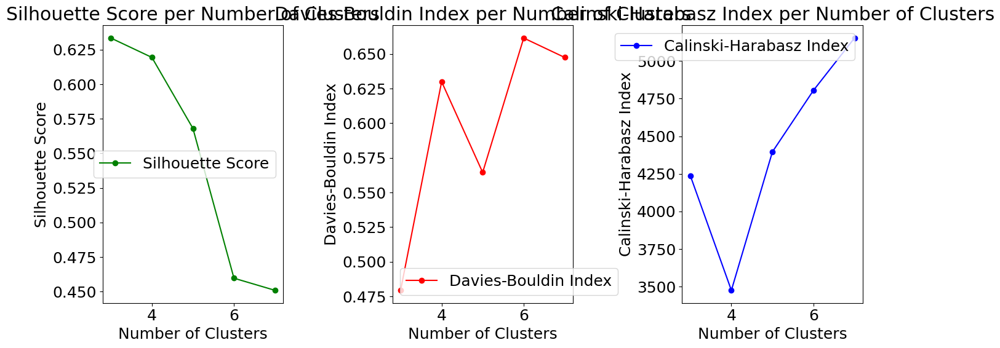

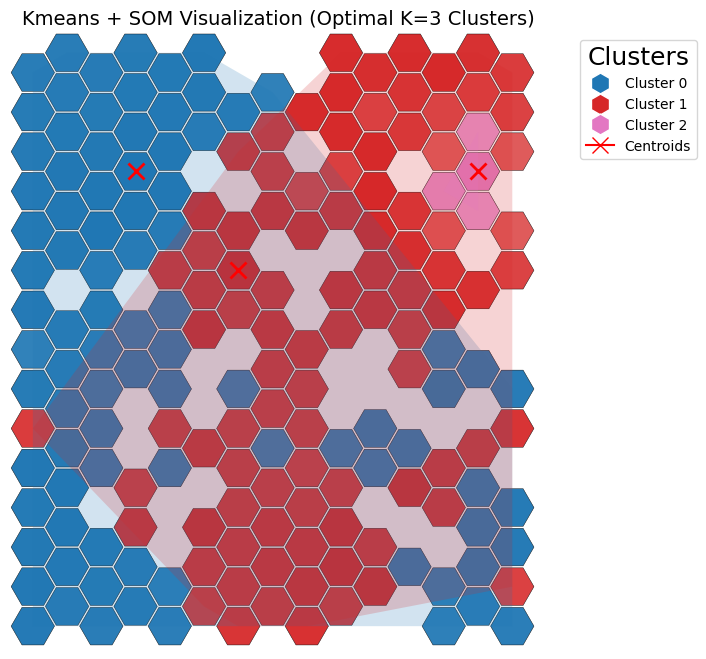

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[  7.8044605   4.780818 ]
 [ 35.70602     6.4822216]
 [110.415924   20.59557  ]]
Kmeans Labels: [0 0 0 ... 0 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

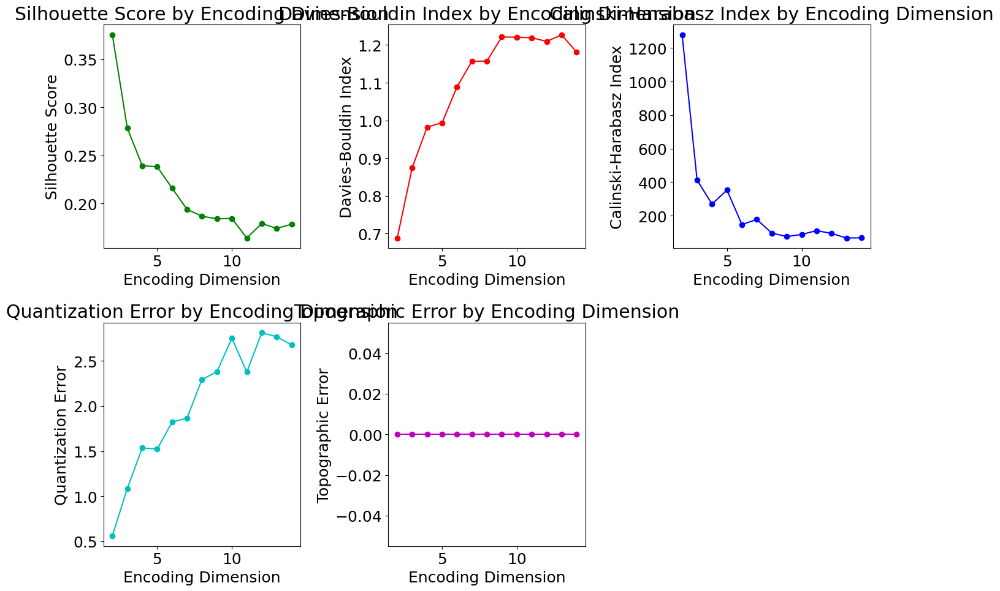

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3754
  Davies-Bouldin Index: 0.6880
  Calinski-Harabasz Index: 1278.1362
  Quantization Error: 0.5597
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.4353
  - Davies-Bouldin Score: 0.6639
  - Calinski-Harabasz Index: 4015.0520


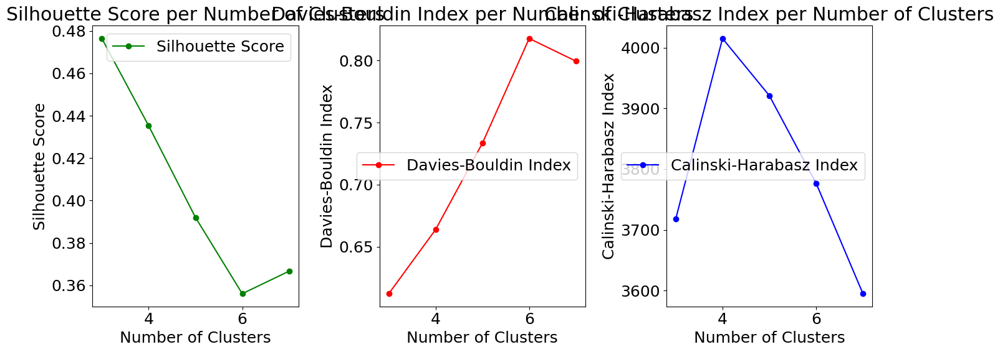

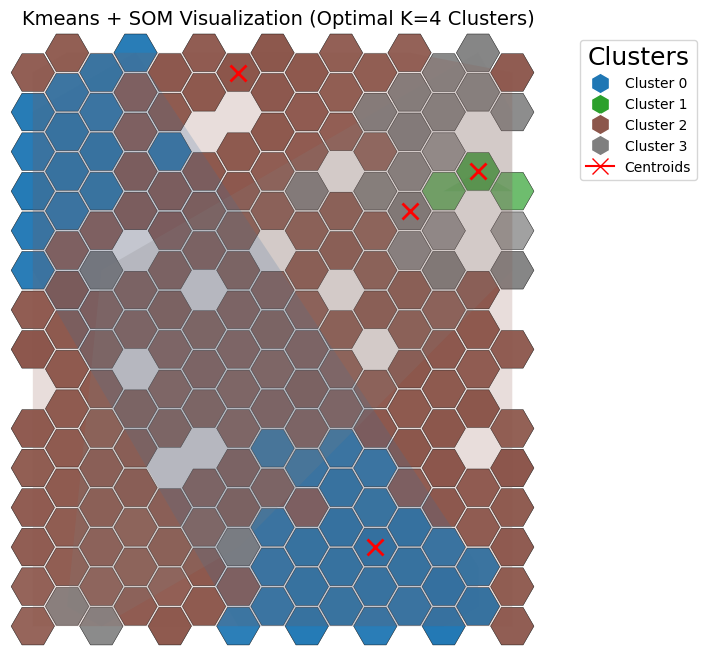

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 6.298746   7.9984226]
 [79.97746   91.263626 ]
 [15.390716  17.90034  ]
 [27.771416  32.075287 ]]
Kmeans Labels: [0 0 0 ... 3 0 3]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━

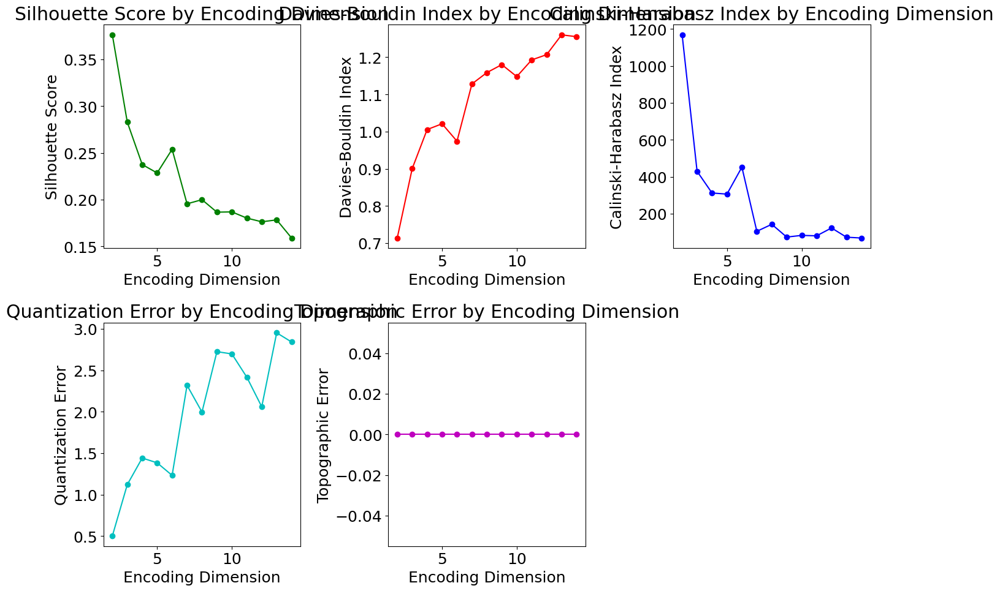

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3762
  Davies-Bouldin Index: 0.7136
  Calinski-Harabasz Index: 1168.1533
  Quantization Error: 0.5008
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4944
  - Davies-Bouldin Score: 0.6148
  - Calinski-Harabasz Index: 2997.8860


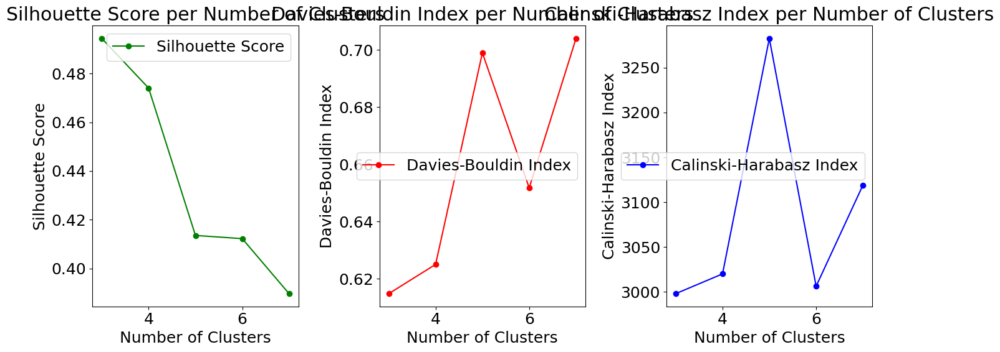

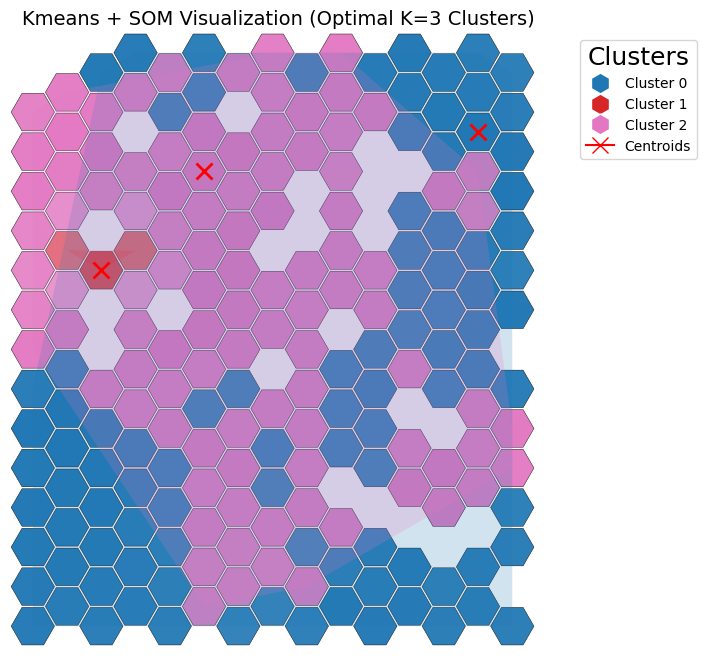

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 6.961326  8.265276]
 [56.270515 73.788284]
 [19.670708 19.56081 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
47/47 ━━━━━

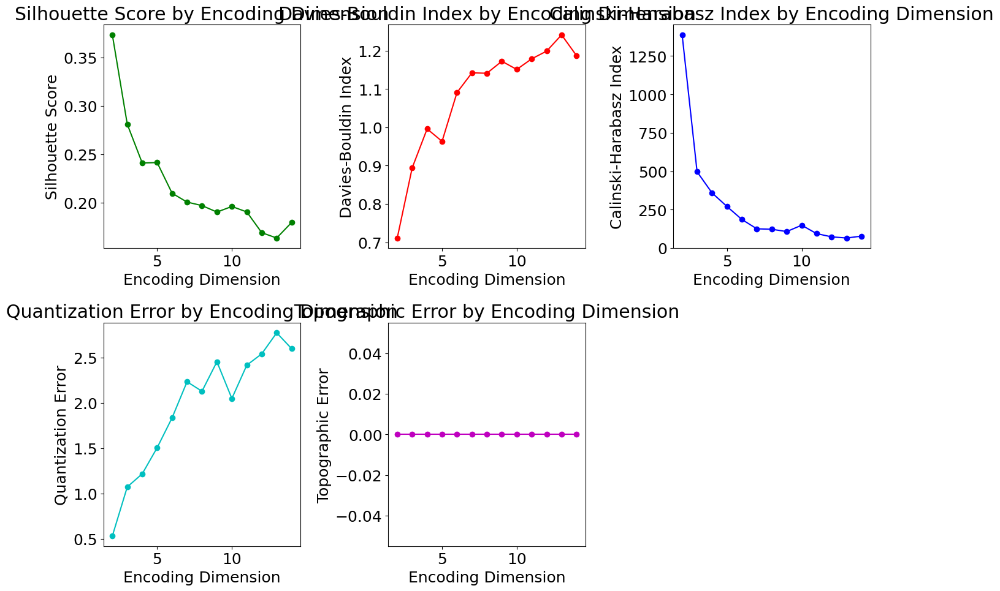

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3734
  Davies-Bouldin Index: 0.7110
  Calinski-Harabasz Index: 1387.8698
  Quantization Error: 0.5299
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4225
  - Davies-Bouldin Score: 0.7006
  - Calinski-Harabasz Index: 2612.3822


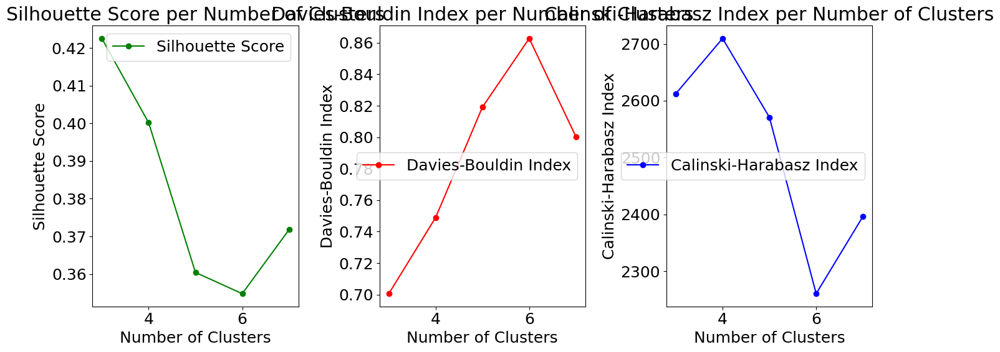

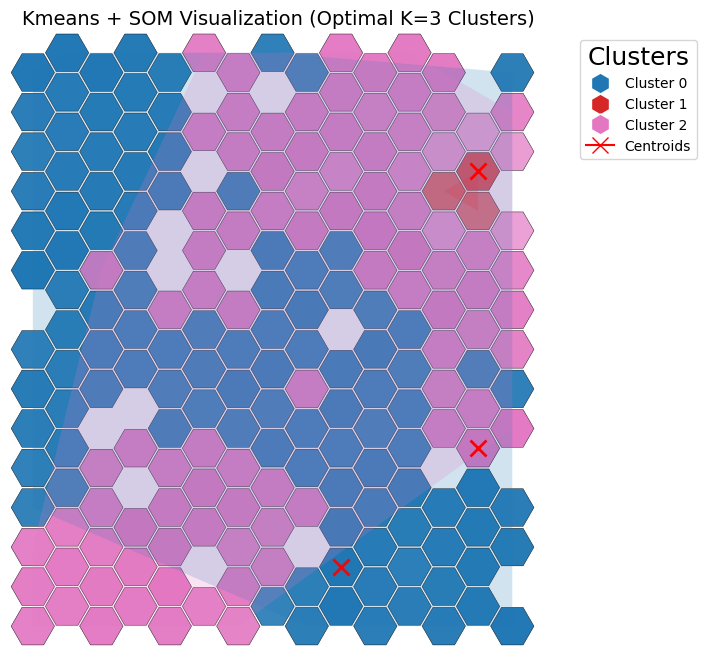

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 9.490522   6.1876364]
 [72.20903   52.155594 ]
 [20.58577   15.411652 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47

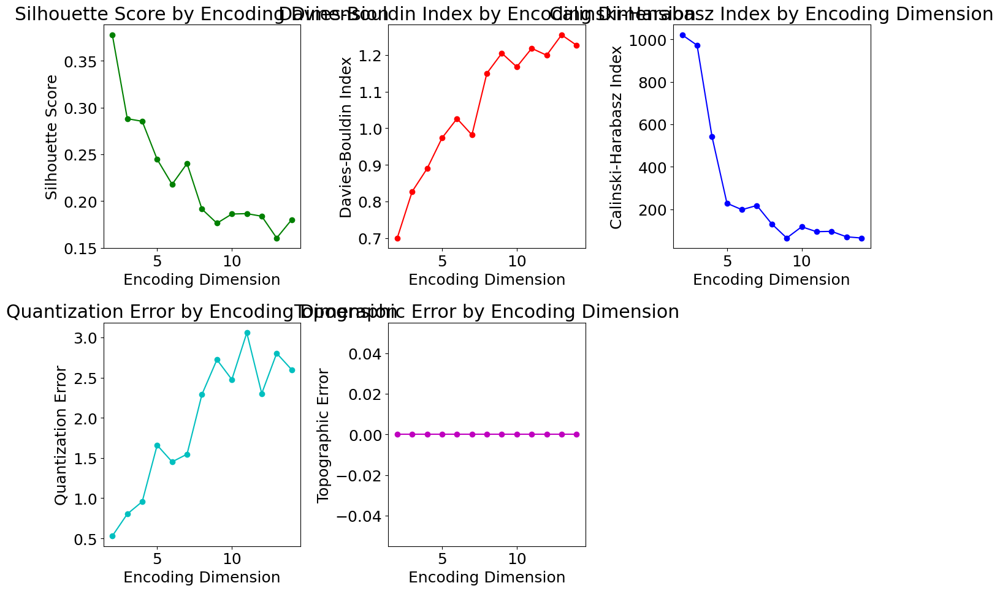

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3778
  Davies-Bouldin Index: 0.7002
  Calinski-Harabasz Index: 1020.9200
  Quantization Error: 0.5297
  Topographic Error: 0.0000
Best K: 6
Best Clustering Metrics for K=6:
  - Silhouette Score: 0.4519
  - Davies-Bouldin Score: 0.6623
  - Calinski-Harabasz Index: 2768.2945


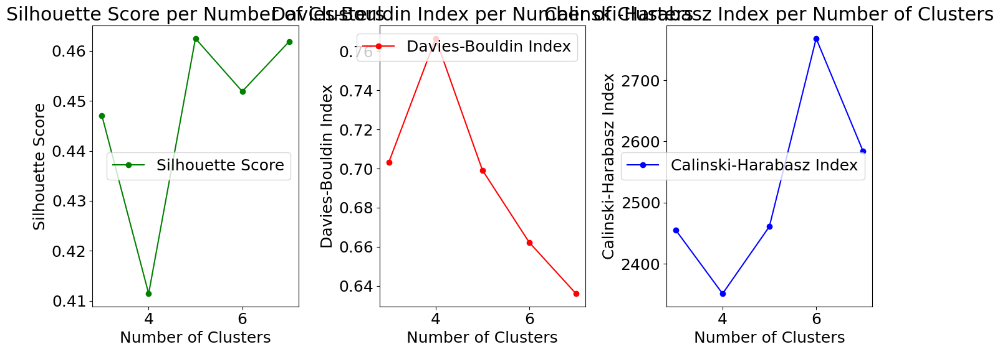

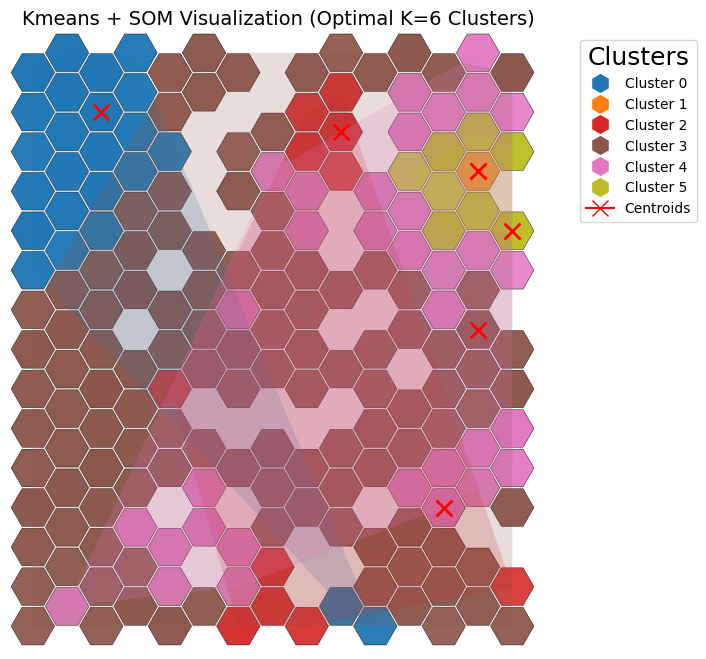

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 2.674048   4.047282 ]
 [39.922234  60.875607 ]
 [17.254284  10.440214 ]
 [ 5.8003097 11.853107 ]
 [10.37731   20.077232 ]
 [20.968643  37.242165 ]]
Kmeans Labels: [2 0 0 ... 4 0 4]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━

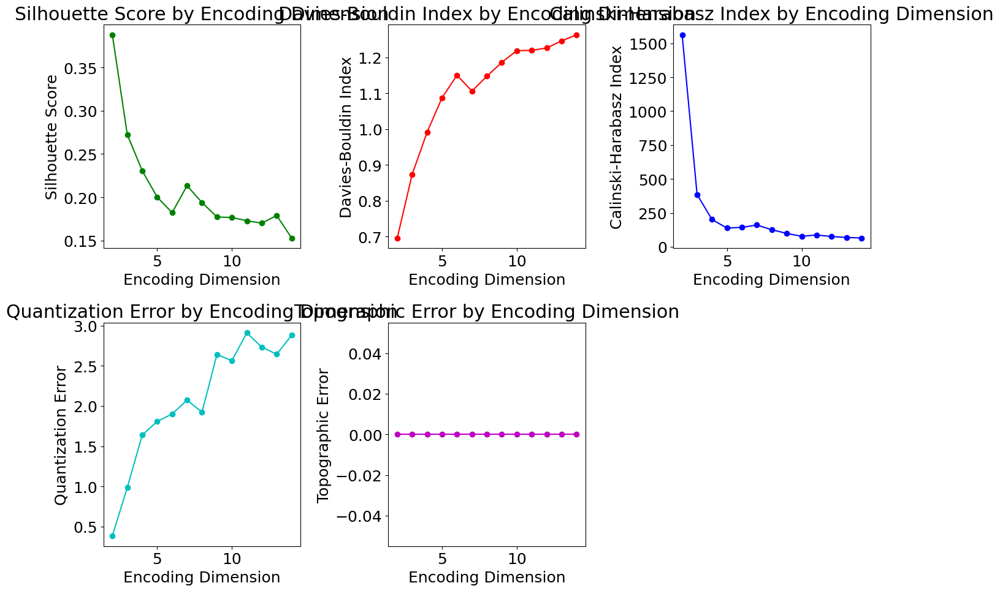

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3875
  Davies-Bouldin Index: 0.6960
  Calinski-Harabasz Index: 1562.6018
  Quantization Error: 0.3824
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.5036
  - Davies-Bouldin Score: 0.6078
  - Calinski-Harabasz Index: 3050.2413


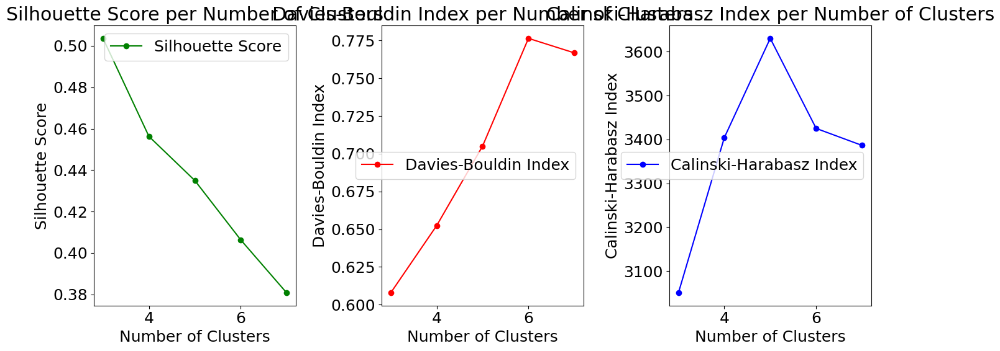

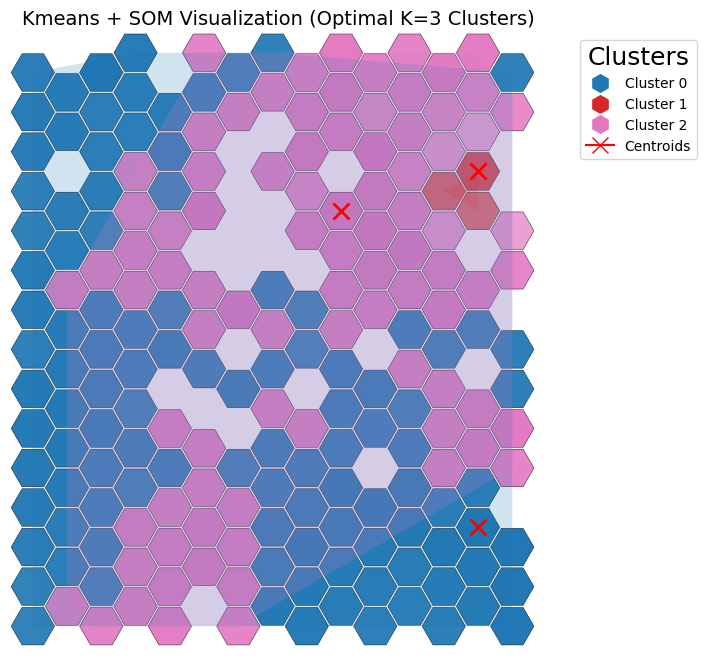

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[10.225178   7.5869427]
 [93.90941   65.46525  ]
 [28.98945   18.010143 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47

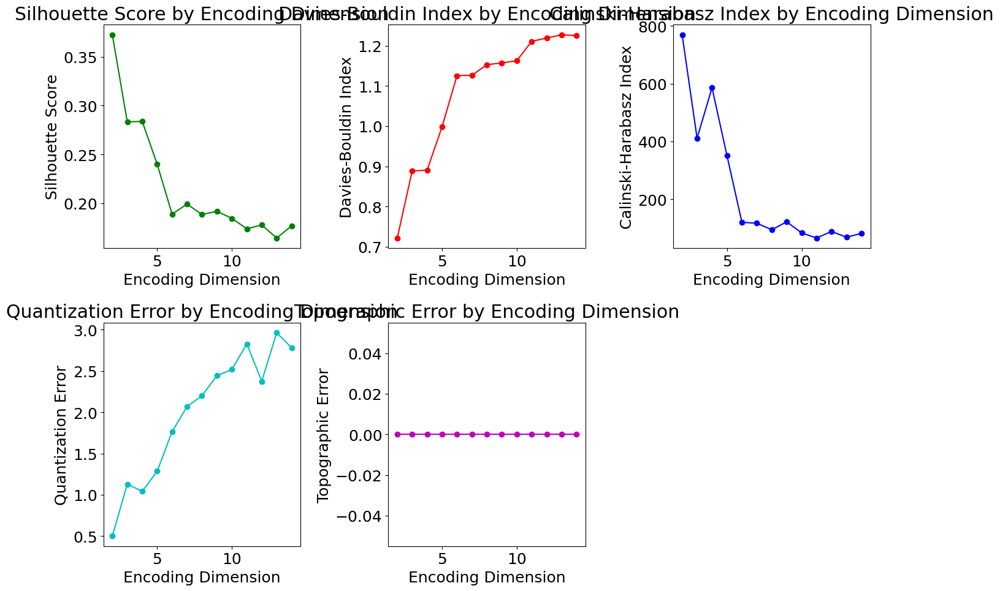

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3723
  Davies-Bouldin Index: 0.7217
  Calinski-Harabasz Index: 768.6744
  Quantization Error: 0.5011
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.4077
  - Davies-Bouldin Score: 0.7134
  - Calinski-Harabasz Index: 2145.8851


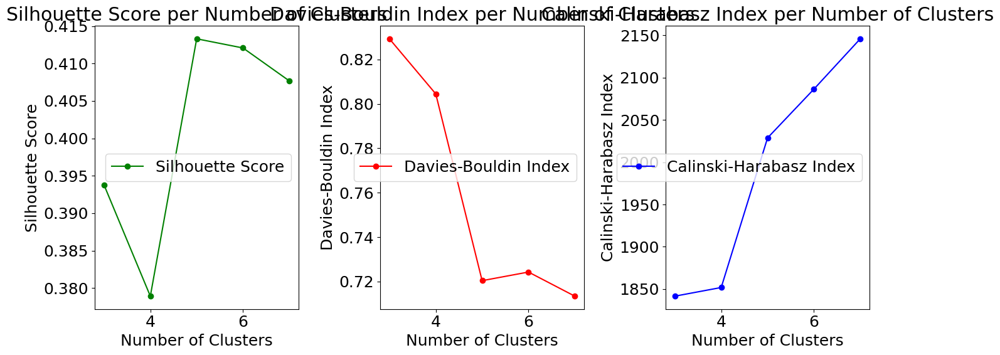

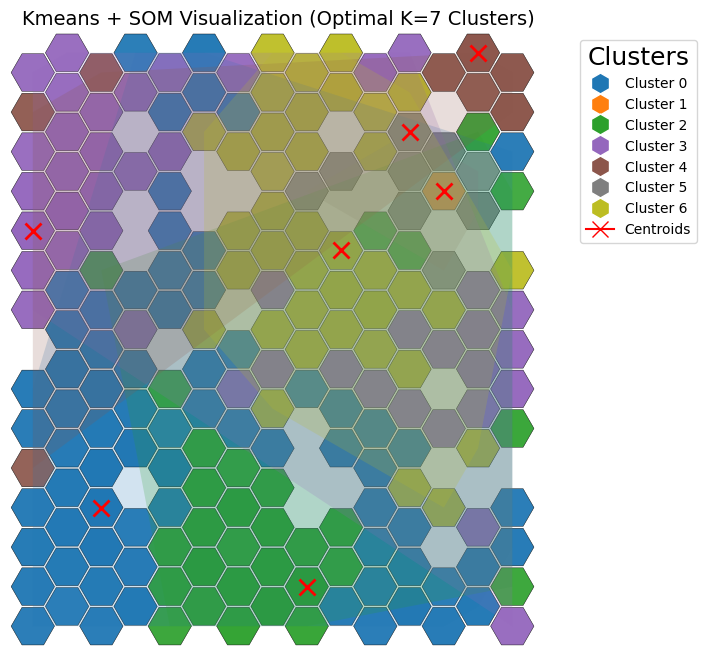

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[14.173733   6.4903736]
 [58.83417   53.41807  ]
 [21.586826  14.069651 ]
 [ 5.8345056 12.51056  ]
 [ 4.038887   3.2658014]
 [28.241209  32.845257 ]
 [12.0179405 20.28278  ]]
Kmeans Labels: [0 3 4 ... 2 4 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━

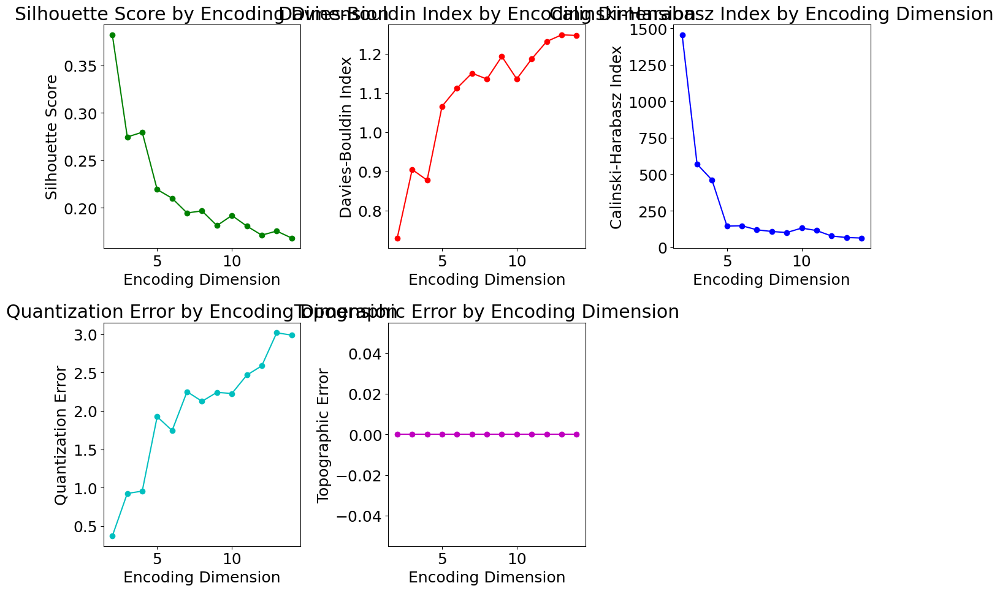

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3823
  Davies-Bouldin Index: 0.7298
  Calinski-Harabasz Index: 1454.7483
  Quantization Error: 0.3673
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.5421
  - Davies-Bouldin Score: 0.5919
  - Calinski-Harabasz Index: 3015.0897


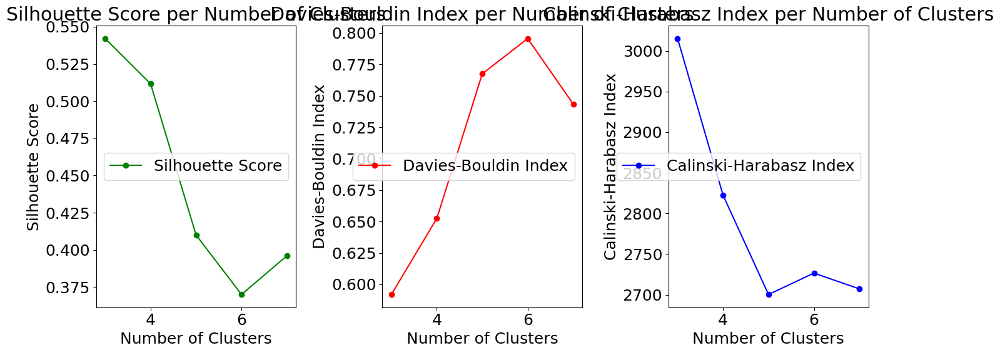

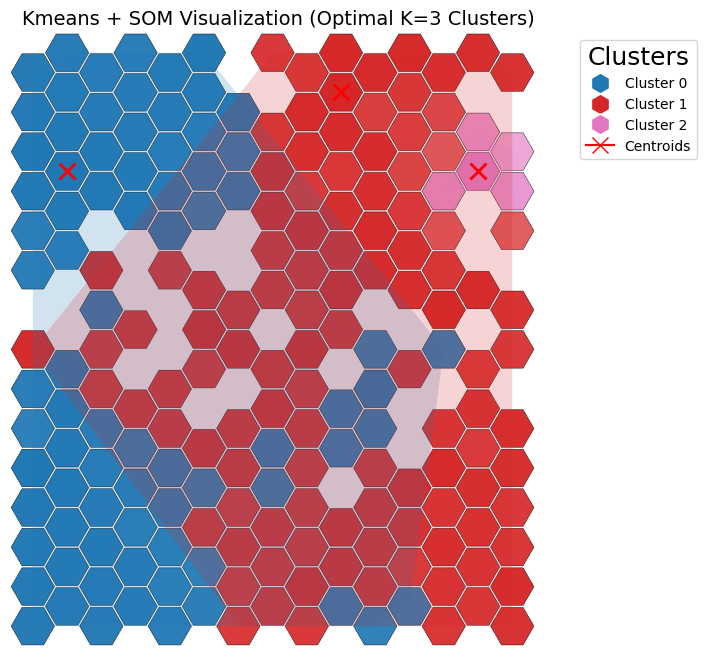

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 8.706456   4.6318173]
 [25.603973  14.794609 ]
 [81.6331    34.479008 ]]
Kmeans Labels: [0 0 0 ... 0 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47

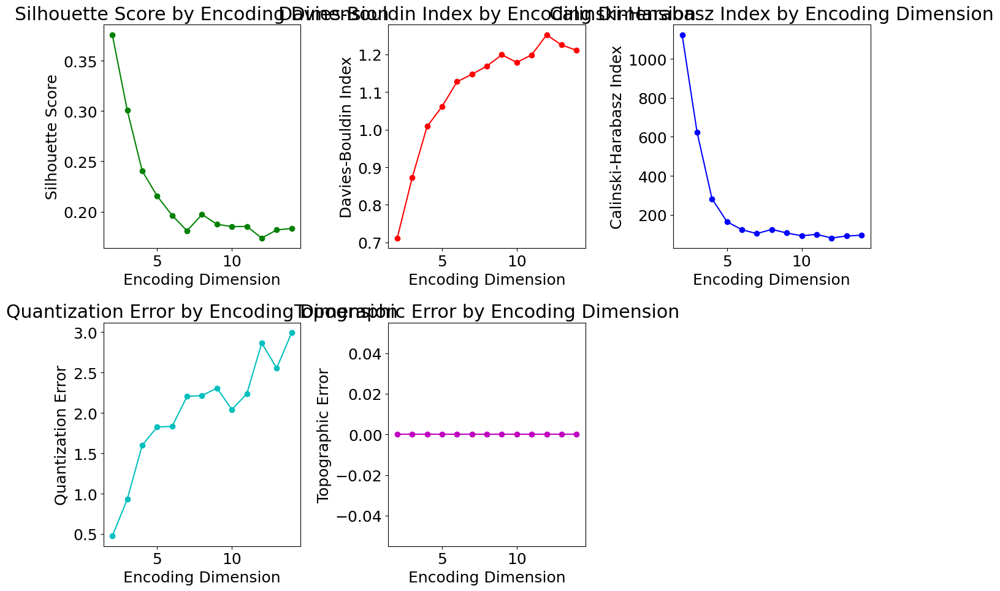

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3758
  Davies-Bouldin Index: 0.7116
  Calinski-Harabasz Index: 1123.5165
  Quantization Error: 0.4762
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.5422
  - Davies-Bouldin Score: 0.5712
  - Calinski-Harabasz Index: 3537.1229


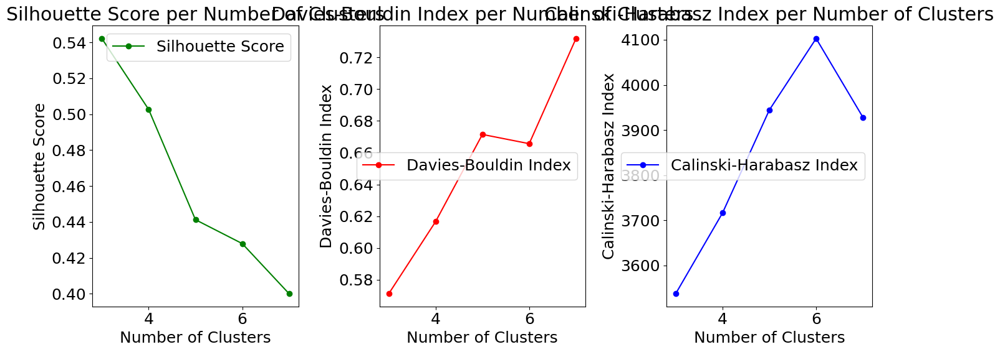

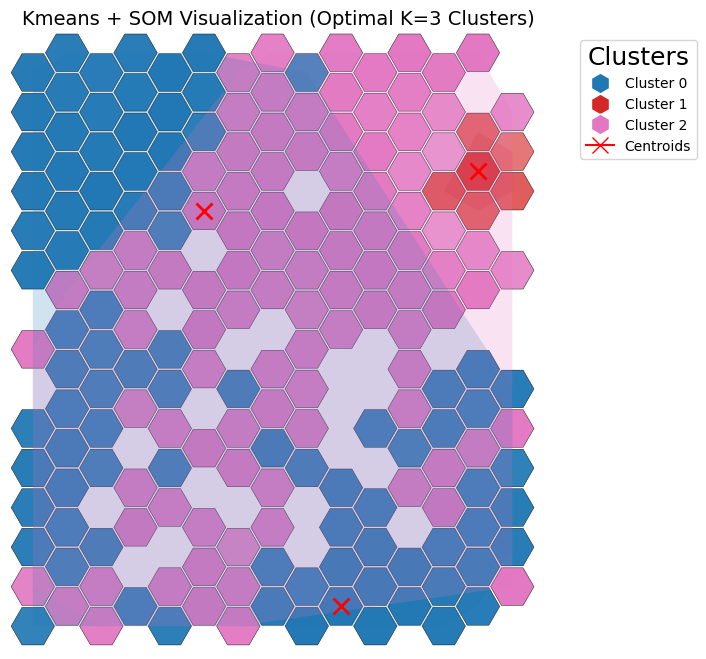

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 11.160702    7.0252914]
 [120.22939    48.484715 ]
 [ 35.991234   13.646129 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

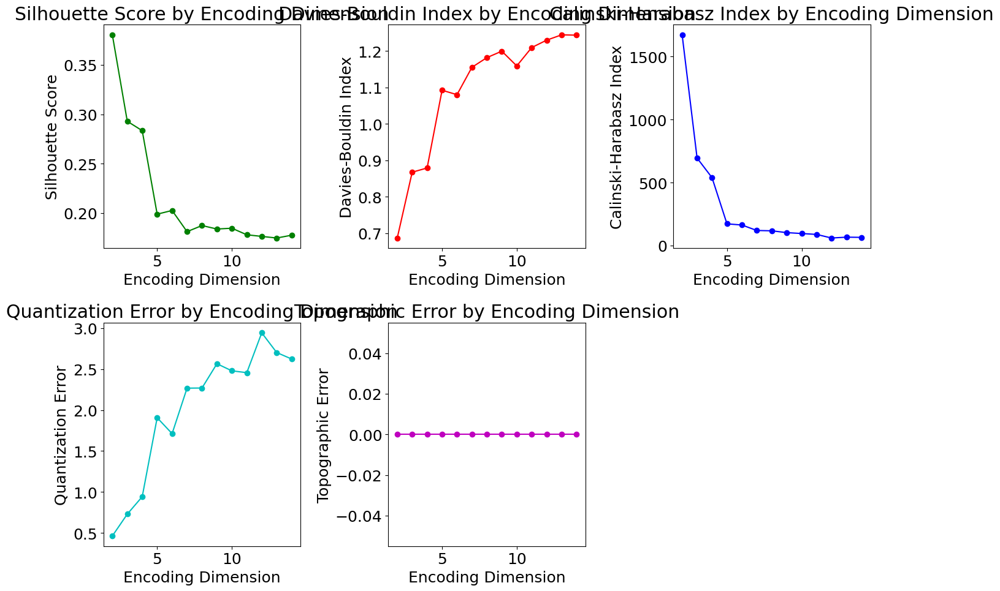

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3804
  Davies-Bouldin Index: 0.6868
  Calinski-Harabasz Index: 1672.4925
  Quantization Error: 0.4636
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4539
  - Davies-Bouldin Score: 0.6656
  - Calinski-Harabasz Index: 2784.9588


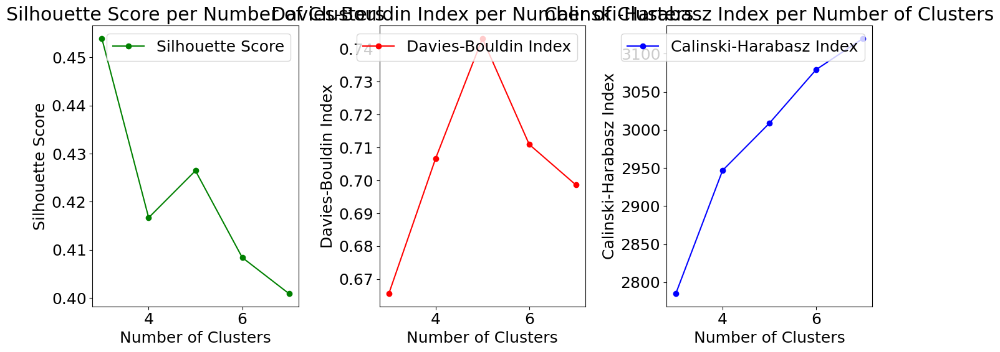

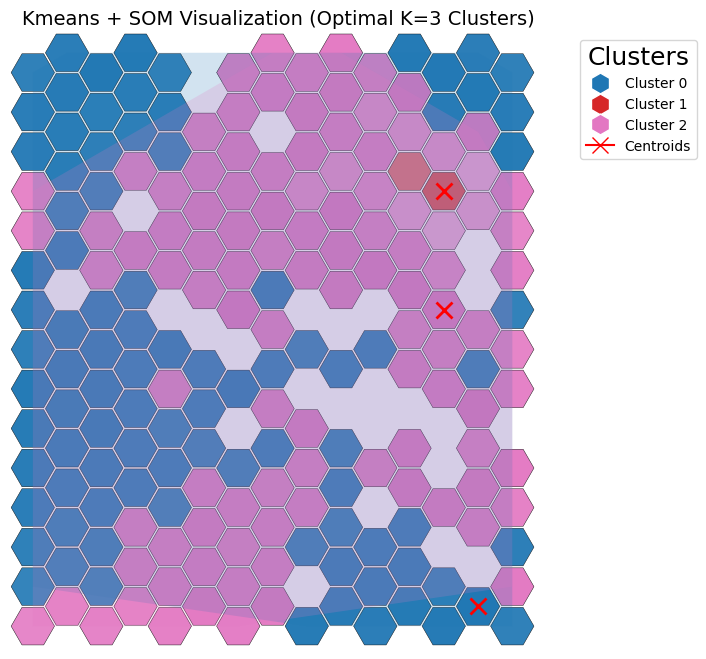

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[10.851981   5.9856997]
 [95.1257    46.551105 ]
 [26.033403  16.594904 ]]
Kmeans Labels: [0 2 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47

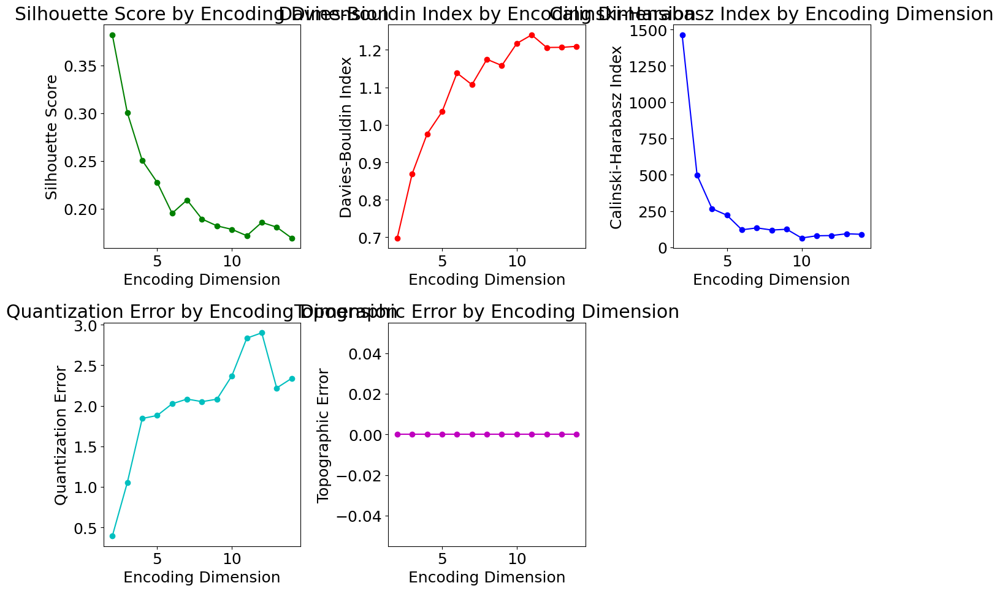

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3820
  Davies-Bouldin Index: 0.6981
  Calinski-Harabasz Index: 1462.5415
  Quantization Error: 0.3952
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.4942
  - Davies-Bouldin Score: 0.6267
  - Calinski-Harabasz Index: 3659.0327


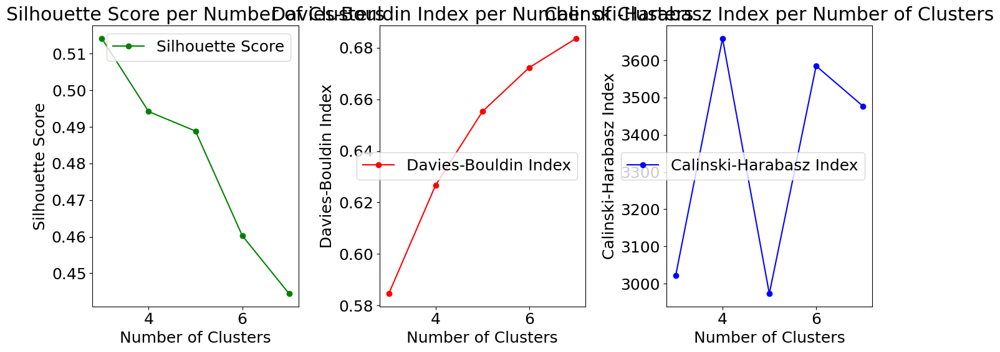

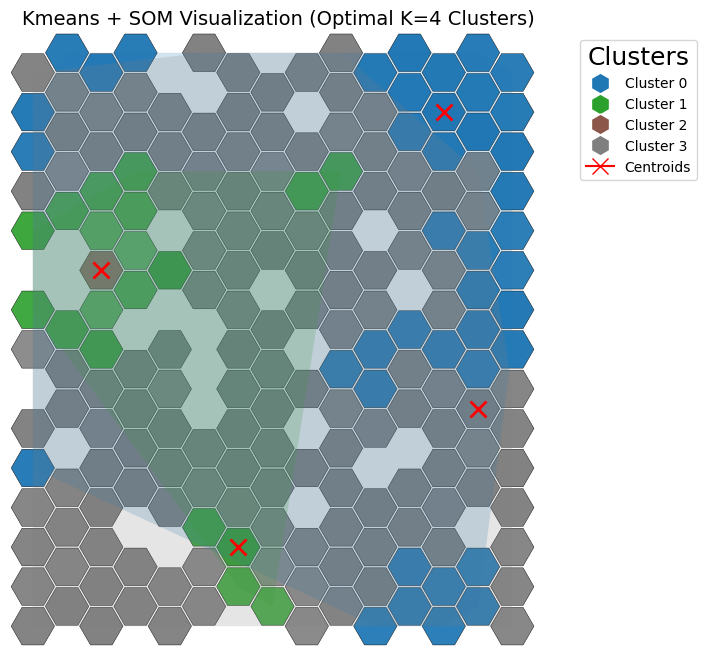

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 7.4776297  3.2817569]
 [40.213364  19.150227 ]
 [93.472084  39.623764 ]
 [20.649513   8.117535 ]]
Kmeans Labels: [0 3 0 ... 3 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━

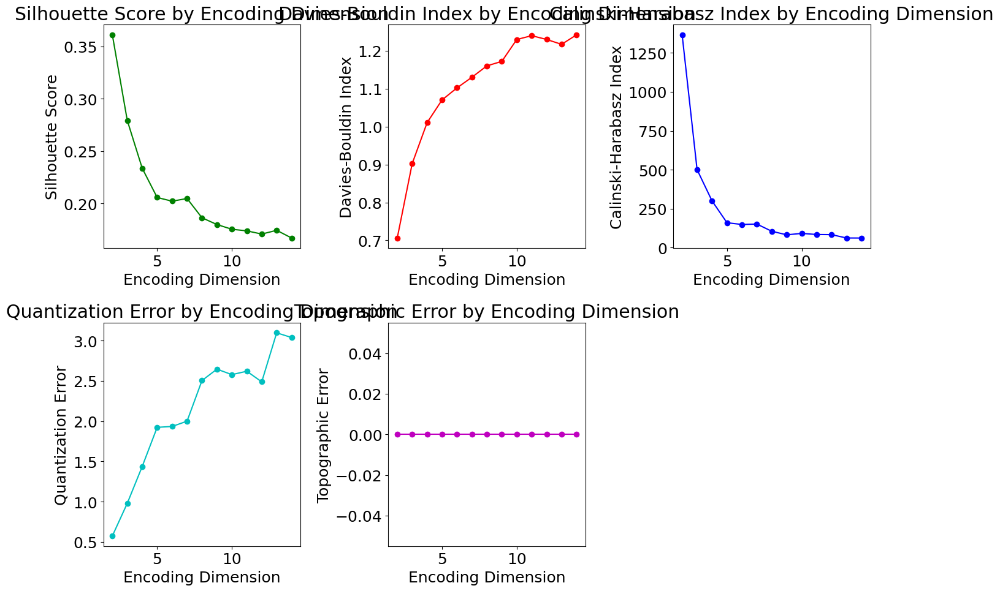

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3610
  Davies-Bouldin Index: 0.7061
  Calinski-Harabasz Index: 1366.1604
  Quantization Error: 0.5750
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4508
  - Davies-Bouldin Score: 0.6813
  - Calinski-Harabasz Index: 2545.9906


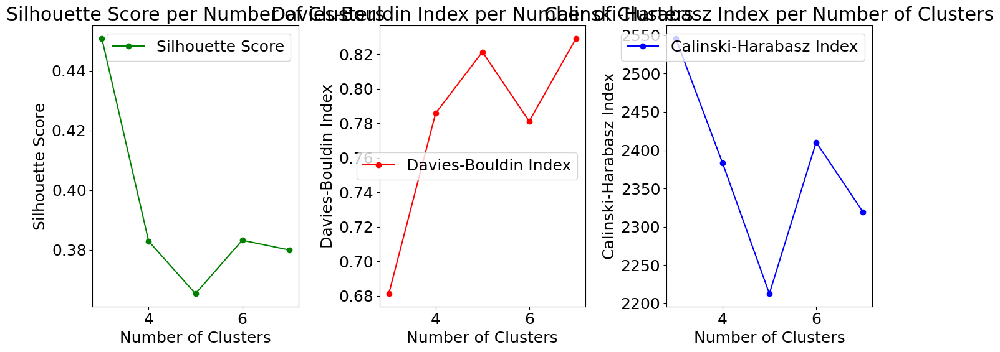

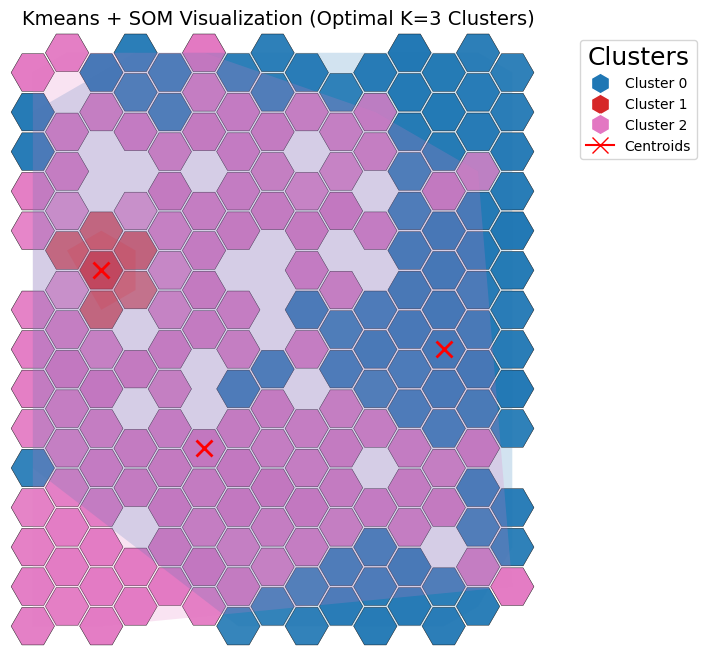

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 8.366192  8.056645]
 [50.82589  65.12787 ]
 [15.358757 22.37225 ]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━

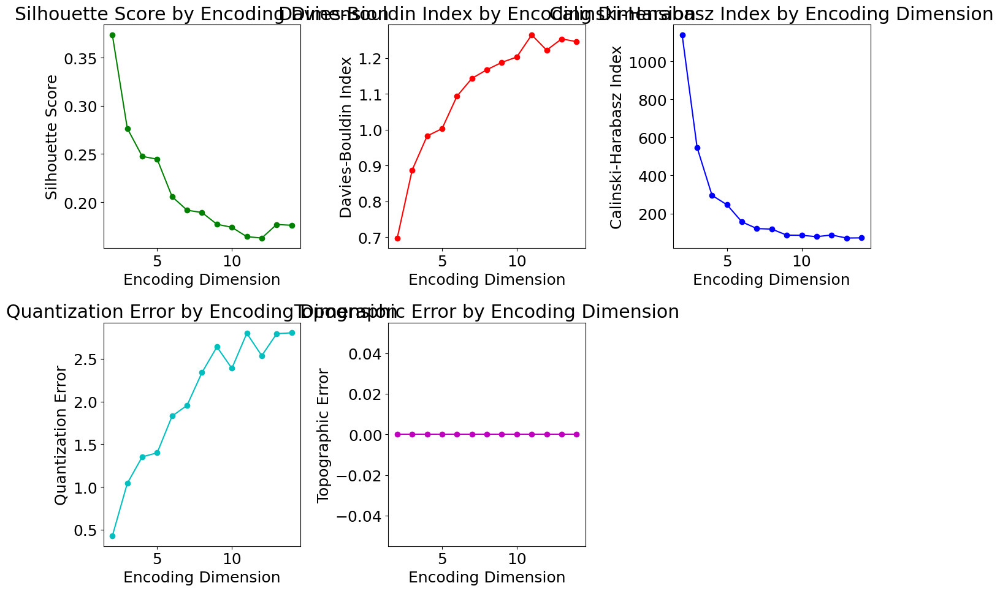

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.3736
  Davies-Bouldin Index: 0.6979
  Calinski-Harabasz Index: 1138.6584
  Quantization Error: 0.4256
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.4563
  - Davies-Bouldin Score: 0.6258
  - Calinski-Harabasz Index: 3930.5562


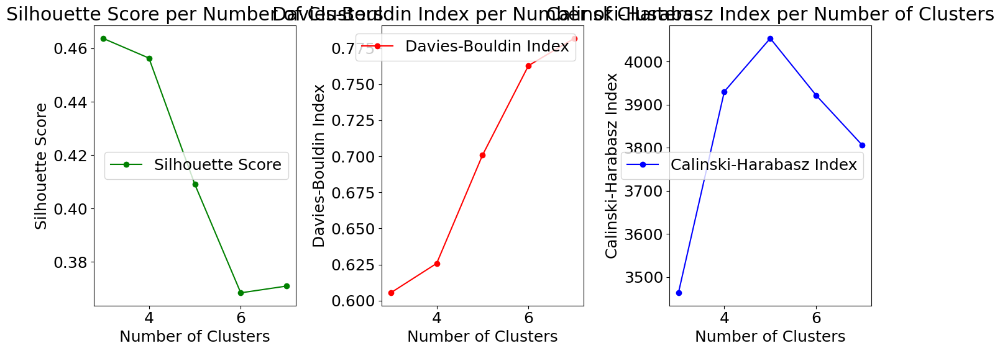

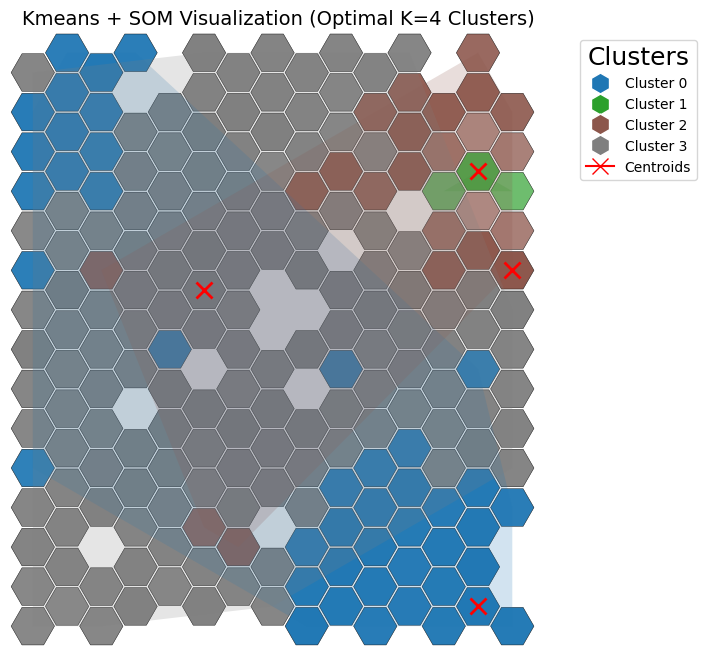

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 6.605074   3.6840148]
 [75.34427   44.05413  ]
 [29.496597  16.10092  ]
 [15.989333   9.124827 ]]
Kmeans Labels: [0 3 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
47/47 ━━━━━━━━━━━━━

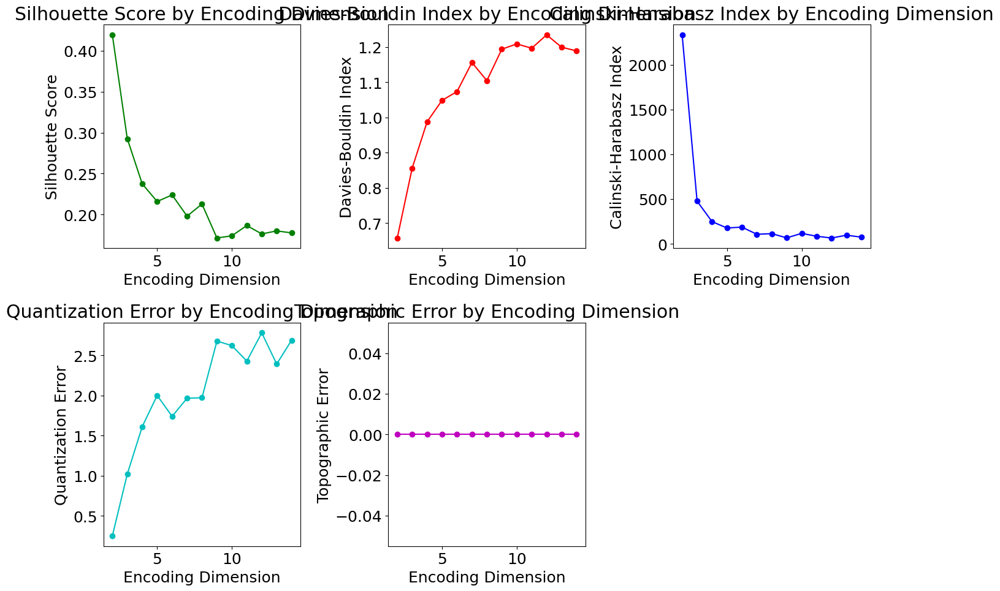

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.4194
  Davies-Bouldin Index: 0.6574
  Calinski-Harabasz Index: 2333.0990
  Quantization Error: 0.2507
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.5186
  - Davies-Bouldin Score: 0.5785
  - Calinski-Harabasz Index: 3633.0746


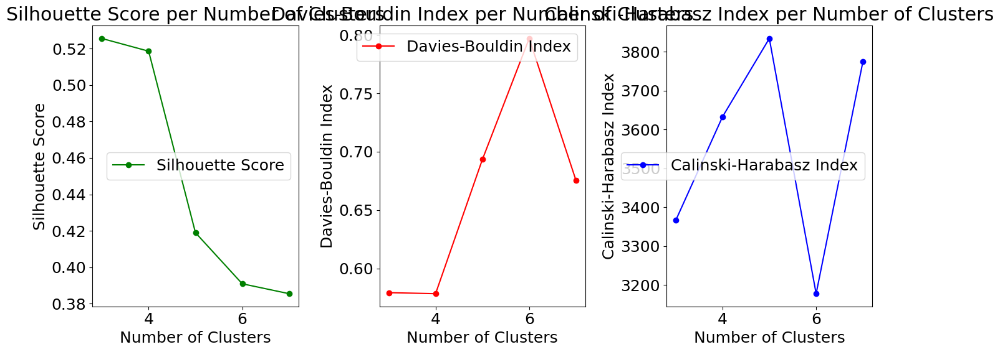

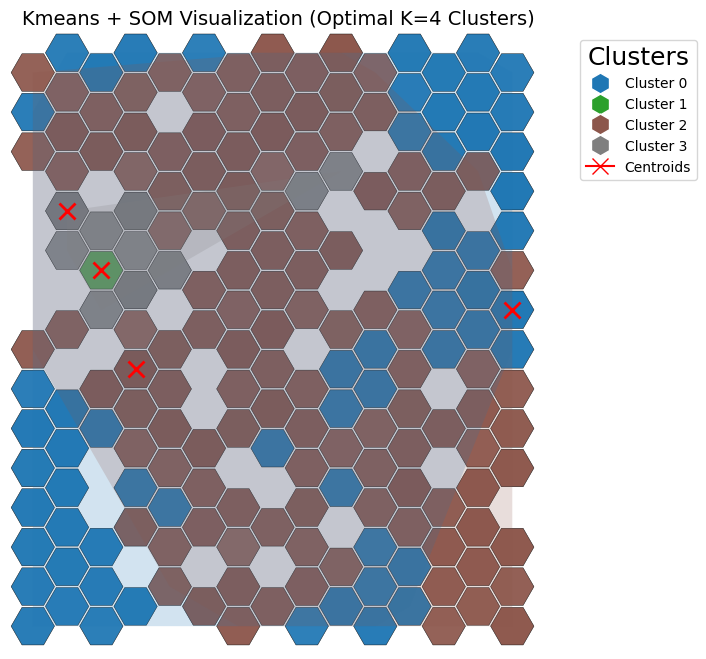

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 6.299924  5.021578]
 [70.81681  55.26535 ]
 [17.885279 11.959589]
 [37.933853 26.320572]]
Kmeans Labels: [0 0 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense, Dropout, GaussianNoise
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from minisom import MiniSom
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler   # <-- Add standard scaler
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from scipy.spatial import ConvexHull
from matplotlib.patches import RegularPolygon, Polygon
from matplotlib.collections import PatchCollection
from matplotlib.colors import ListedColormap

# Set reproducibility settings
os.environ['TF_DETERMINISTIC_OPS'] = '1'
seed = 42
np.random.seed()
tf.random.set_seed(seed)

# Function to print reproducibility settings once
def print_reproducibility_settings():
    print("Reproducibility Settings:")
    print(f"Random Seed: {seed}")
    print("Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5")
    print("SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100")
    print("Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error")
    print("-" * 50)

# Function to evaluate clustering metrics per encoding dim
def calculate_metrics(latent_features, flat_labels, som):
    silhouette_avg = silhouette_score(latent_features, flat_labels)
    davies_bouldin_avg = davies_bouldin_score(latent_features, flat_labels)
    calinski_harabasz_avg = calinski_harabasz_score(latent_features, flat_labels)
    quantization_error = np.mean([np.linalg.norm(x - som.get_weights()[som.winner(x)]) for x in latent_features])
    topographic_error = np.mean([
        1 if np.linalg.norm(
            np.array(som.winner(x)) - np.array(som.winner(som.get_weights()[som.winner(x)]))
        ) > 1 else 0
        for x in latent_features
    ])

    return silhouette_avg, davies_bouldin_avg, calinski_harabasz_avg, quantization_error, topographic_error

def find_best_encoding_dimension(df, encoding_dims, som_dim=(15, 15), learning_rate=0.00005, epochs=200, patience=5, batch_size=100):
    """
    Enhanced version:
      - Standardize data before training
      - Reduced Gaussian noise (from 0.1 to 0.05)
      - Reduced dropout (from 0.1 to 0.05)
      - Lowered SOM sigma (from 2.0 to 1.0)
      - Increased AE epochs to 100
    """
    # 1) Standardize data
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)

    best_encoding_dim, best_latent_features, best_som = None, None, None
    best_combined_score = -1

    # Lists to store metrics for visualization
    silhouette_scores = []
    db_scores = []
    calinski_scores = []
    quantization_errors = []
    topographic_errors = []

    for encoding_dim in encoding_dims:
        input_dim = df_scaled.shape[1]
        input_layer = Input(shape=(input_dim,))

        # 2) Reduce Gaussian noise to preserve more structure
        noise = GaussianNoise(0.05)(input_layer)
        encoder = Dense(128, activation="relu")(noise)
        # 3) Reduce dropout rate
        encoder = Dropout(0.05)(encoder)
        encoder = Dense(64, activation="relu")(encoder)
        encoder = Dense(encoding_dim, activation="relu")(encoder)

        # Decoder
        decoder = Dense(64, activation="relu")(encoder)
        decoder = Dense(128, activation="relu")(decoder)
        decoder = Dense(input_dim, activation="sigmoid")(decoder)

        # Compile the autoencoder
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Train the autoencoder
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
        lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
        autoencoder.fit(
            df_scaled, df_scaled,
            epochs=epochs,
            batch_size=batch_size,
            shuffle=True,
            validation_split=0.3,
            callbacks=[early_stopping, lr_scheduler],
            verbose=0  # you can switch to 1 if you want logs
        )

        # Extract latent features
        encoder_model = Model(inputs=input_layer, outputs=encoder)
        latent_features = encoder_model.predict(df_scaled)

        # 4) Lower sigma to encourage tighter clustering
        som = MiniSom(som_dim[0], som_dim[1], encoding_dim, sigma=0.5, learning_rate=0.5, random_seed=seed)
        som.random_weights_init(latent_features)
        # 5) Keep high training iterations if you want deeper convergence
        som.train_random(latent_features, 20000)

        # Map each data point to SOM clusters
        labels = np.array([som.winner(x) for x in latent_features])
        flat_labels = np.unique(labels, axis=0, return_inverse=True)[1]

        # Calculate clustering metrics
        (silhouette_avg, davies_bouldin_avg, calinski_harabasz_avg,
         quantization_error, topographic_error) = calculate_metrics(latent_features, flat_labels, som)

        # Append metrics for visualization
        silhouette_scores.append(silhouette_avg)
        db_scores.append(davies_bouldin_avg)
        calinski_scores.append(calinski_harabasz_avg)
        quantization_errors.append(quantization_error)
        topographic_errors.append(topographic_error)

    # Normalize metrics for combined score calculation
    silhouette_norm = (silhouette_scores - np.min(silhouette_scores)) / (np.max(silhouette_scores) - np.min(silhouette_scores))
    calinski_norm = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))
    davies_norm = (np.max(db_scores) - db_scores) / (np.max(db_scores) - np.min(db_scores))  # Inverse for minimization

    # Calculate combined scores
    combined_scores = 0.33 * silhouette_norm + 0.33 * calinski_norm + 0.34 * davies_norm

    # Find the best encoding dimension
    best_index = np.argmax(combined_scores)
    best_combined_score = combined_scores[best_index]
    best_encoding_dim = encoding_dims[best_index]
    # NOTE: If you want the actual best latent features and SOM at best_index,
    #       move the model code outside or store the best after each iteration.
    # For simplicity, let's just re-run for best dim (like "lazy" approach):
    # Retrain with the best encoding dimension
    input_dim = df_scaled.shape[1]
    input_layer = Input(shape=(input_dim,))
    x = Dense(256, activation="relu")(input_layer)
    x = Dense(128, activation="relu")(x)
    x = Dense(64, activation="relu")(x)
    latent = Dense(best_encoding_dim, activation="relu")(x)
    x = Dense(64, activation="relu")(latent)
    x = Dense(128, activation="relu")(x)
    x = Dense(256, activation="relu")(x)
    decoded = Dense(input_dim, activation="sigmoid")(x)
    autoencoder = Model(inputs=input_layer, outputs=decoded)
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")
    autoencoder.fit(
        df_scaled, df_scaled,
        epochs=epochs,
        batch_size=batch_size,
        shuffle=True,
        validation_split=0.3,
        callbacks=[EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True),
                   ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)],
        verbose=0
    )
    encoder_model = Model(inputs=input_layer, outputs=latent)
    best_latent_features = encoder_model.predict(df_scaled)

    best_som = MiniSom(som_dim[0], som_dim[1], best_encoding_dim, sigma=2.0, learning_rate=0.005, random_seed=seed)
    best_som.random_weights_init(best_latent_features)
    best_som.train_random(best_latent_features, 20000)

    # Visualization of metrics
    plt.figure(figsize=(14, 10))

    plt.subplot(2, 3, 1)
    plt.plot(encoding_dims, silhouette_scores, 'g-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score by Encoding Dimension')

    plt.subplot(2, 3, 2)
    plt.plot(encoding_dims, db_scores, 'r-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index by Encoding Dimension')

    plt.subplot(2, 3, 3)
    plt.plot(encoding_dims, calinski_scores, 'b-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index by Encoding Dimension')

    plt.subplot(2, 3, 4)
    plt.plot(encoding_dims, quantization_errors, 'c-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Quantization Error')
    plt.title('Quantization Error by Encoding Dimension')

    plt.subplot(2, 3, 5)
    plt.plot(encoding_dims, topographic_errors, 'm-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Topographic Error')
    plt.title('Topographic Error by Encoding Dimension')

    plt.tight_layout()
    plt.show()

    # Print the best results
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    print(f"Best Combined Score: {best_combined_score:.4f}")
    print("Best Clustering Metrics (at the time of dimension scanning):")
    print(f"  Silhouette Score: {silhouette_scores[best_index]:.4f}")
    print(f"  Davies-Bouldin Index: {db_scores[best_index]:.4f}")
    print(f"  Calinski-Harabasz Index: {calinski_scores[best_index]:.4f}")
    print(f"  Quantization Error: {quantization_errors[best_index]:.4f}")
    print(f"  Topographic Error: {topographic_errors[best_index]:.4f}")

    return best_encoding_dim, best_latent_features, best_som

# Function to find the optimal K in KMeans
def find_best_k(latent_features, k_range):
    best_k = None
    best_labels = None
    best_centroids = None
    best_metrics = None
    silhouette_scores = []
    db_scores = []
    calinski_scores = []

    # Iterate over the range of K values
    for k in k_range:
        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Calculate clustering metrics
        silhouette_avg = silhouette_score(latent_features, labels)
        davies_bouldin_avg = davies_bouldin_score(latent_features, labels)
        calinski_harabasz_avg = calinski_harabasz_score(latent_features, labels)

        silhouette_scores.append(silhouette_avg)
        db_scores.append(davies_bouldin_avg)
        calinski_scores.append(calinski_harabasz_avg)

    # Normalize metrics
    silhouette_scores = np.array(silhouette_scores)
    db_scores = np.array(db_scores)
    calinski_scores = np.array(calinski_scores)

    # Silhouette Score: Higher is better (normalize to [0, 1])
    silhouette_norm = (silhouette_scores - silhouette_scores.min()) / (silhouette_scores.max() - silhouette_scores.min())

    # Davies-Bouldin Index: Lower is better (invert and normalize to [0, 1])
    db_norm = 1 - (db_scores - db_scores.min()) / (db_scores.max() - db_scores.min())

    # Calinski-Harabasz Index: Higher is better (normalize to [0, 1])
    calinski_norm = (calinski_scores - calinski_scores.min()) / (calinski_scores.max() - calinski_scores.min())

    # Weighted Aggregation (Equal weights as default)
    combined_scores = (silhouette_norm + db_norm + calinski_norm) / 3

    # Identify the best K
    best_k_idx = np.argmax(combined_scores)
    best_k = k_range[best_k_idx]
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    best_labels = kmeans.fit_predict(latent_features)
    best_centroids = kmeans.cluster_centers_
    best_metrics = (silhouette_scores[best_k_idx], db_scores[best_k_idx], calinski_scores[best_k_idx])

    # Print results for the optimal K
    if best_metrics:
        print(f"Best K: {best_k}")
        print(f"Best Clustering Metrics for K={best_k}:")
        print(f"  - Silhouette Score: {best_metrics[0]:.4f}")
        print(f"  - Davies-Bouldin Score: {best_metrics[1]:.4f}")
        print(f"  - Calinski-Harabasz Index: {best_metrics[2]:.4f}")

    # Plot metrics per number of clusters
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 3, 1)
    plt.plot(k_range, silhouette_scores, 'g-o', label='Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score per Number of Clusters')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(k_range, db_scores, 'r-o', label='Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index per Number of Clusters')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(k_range, calinski_scores, 'b-o', label='Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index per Number of Clusters')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return best_k, best_labels, best_centroids, best_metrics[0] if best_metrics else None

# Update visualization function to use best K
def visualize_som_clusters_with_best_k(latent_features, kmeans_labels, som, som_dim=(10, 10), best_k=None, centroids=None):
    # Create color map for clusters
    base_cmap = plt.cm.tab10  # Use a color map with enough colors for clusters

    # Define hexagon grid parameters
    hex_radius = 1  # size of each hexagon
    offset_x = 3/2 * hex_radius  # horizontal offset for each cell in a row
    offset_y = np.sqrt(3) * hex_radius  # vertical offset between rows

    # Map SOM winners to cluster labels
    winner_to_cluster = {som.winner(latent_features[i]): kmeans_labels[i] for i in range(len(latent_features))}

    # Initialize plot
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_aspect('equal')

    # Create lists to store hexagons and cluster hull points
    hexagons = []
    cluster_hulls = {cluster: [] for cluster in np.unique(kmeans_labels)}

    # Draw hexagonal grid with gradient color for each cluster
    for i in range(som_dim[0]):
        for j in range(som_dim[1]):
            # Calculate hexagon position
            x = i * offset_x
            y = j * offset_y if i % 2 == 0 else j * offset_y + offset_y / 2

            # Determine the cluster label for this cell
            cluster_label = winner_to_cluster.get((i, j), -1)
            if cluster_label == -1:
                continue  # Skip unassigned cells

            # Calculate color intensity for gradient effect (distance from centroid)
            cell_features = np.array([som.get_weights()[i, j]])
            centroid = centroids[cluster_label]
            dist_to_centroid = np.linalg.norm(cell_features - centroid)
            color_intensity = min(1, dist_to_centroid / max(np.linalg.norm(latent_features - centroid, axis=1)))
            facecolor = base_cmap(cluster_label / best_k)
            # Adjust alpha based on distance
            facecolor = (facecolor[0], facecolor[1], facecolor[2], 1 - color_intensity)

            # Create hexagon
            hexagon = RegularPolygon(
                (x, y), numVertices=6, radius=hex_radius * 0.95,
                orientation=np.radians(30), edgecolor='black', linewidth=0.3,
                facecolor=facecolor
            )
            hexagons.append(hexagon)

            # Add this cell to the cluster hull points
            cluster_hulls[cluster_label].append([x, y])

    # Add all hexagons to the plot
    hex_collection = PatchCollection(hexagons, match_original=True)
    ax.add_collection(hex_collection)

    # Draw shaded convex hulls around clusters
    for cluster, points in cluster_hulls.items():
        if len(points) > 2:  # ConvexHull requires at least 3 points
            hull_points = np.array(points)
            hull = ConvexHull(hull_points)
            hull_polygon = Polygon(hull_points[hull.vertices], closed=True, facecolor=base_cmap(cluster / best_k), alpha=0.2)
            ax.add_patch(hull_polygon)

    # Mark centroids if provided
    if centroids is not None:
        for idx, centroid in enumerate(centroids):
            centroid_winner = som.winner(centroid)
            centroid_x = centroid_winner[0] * offset_x
            centroid_y = centroid_winner[1] * offset_y + (offset_y / 2 if centroid_winner[0] % 2 != 0 else 0)
            ax.plot(centroid_x, centroid_y, 'x', color='red', markersize=12, markeredgewidth=2, label='Centroid' if idx == 0 else "")

    # Adjust plot limits and title
    ax.set_xlim(-hex_radius, som_dim[0] * offset_x)
    ax.set_ylim(-hex_radius, som_dim[1] * offset_y)
    ax.axis('off')
    ax.set_title(f"Kmeans + SOM Visualization (Optimal K={best_k} Clusters)", fontsize=14)

    # Add a legend to describe clusters
    handles = [
        plt.Line2D([0], [0], marker='h', color='w', markerfacecolor=base_cmap(i / best_k), markersize=15,
                   label=f'Cluster {i}') for i in range(best_k)
    ]
    handles.append(plt.Line2D([0], [0], marker='x', color='red', markersize=12, label='Centroids'))
    ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', title="Clusters", fontsize=10)

    plt.show()

def main_clustering_pipeline(df, encoding_dims, som_dim=(15, 15), learning_rate=0.00005, epochs=200, patience=5, batch_size=100, k_range=range(3, 8)):
    print_reproducibility_settings()
    best_encoding_dim, best_latent_features, best_som = find_best_encoding_dimension(
        df, encoding_dims, som_dim, learning_rate, epochs, patience, batch_size
    )

    best_k, kmeans_labels, centroids, s = find_best_k(best_latent_features, k_range)
    visualize_som_clusters_with_best_k(best_latent_features, kmeans_labels, best_som, som_dim, best_k, centroids)

    print("Optimal Latent Features Matrix (Shape):", best_latent_features.shape)
    print("\nCentroids of the Best KMeans Clustering:\n", centroids)

    return best_latent_features, best_som, kmeans_labels, centroids, best_k, s

def main_loop():
    # Execute pipeline
    encoding_dims = range(2, 15)
    latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette = main_clustering_pipeline(
        df_copy, encoding_dims
    )
    print("Kmeans Labels:", kmeans_labels)
    return latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette

while True:
    latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette = main_loop()
    if silhouette > 0.64 and best_k > 2:
        break


latent_features: [[ 0.          3.3339074 ]
 [ 0.         21.1989    ]
 [ 0.          0.71554154]
 ...
 [ 0.         14.408482  ]
 [ 0.          1.333213  ]
 [ 0.         27.370415  ]]
som_weights: <minisom.MiniSom object at 0x7ec1eeb82710>
labels: [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

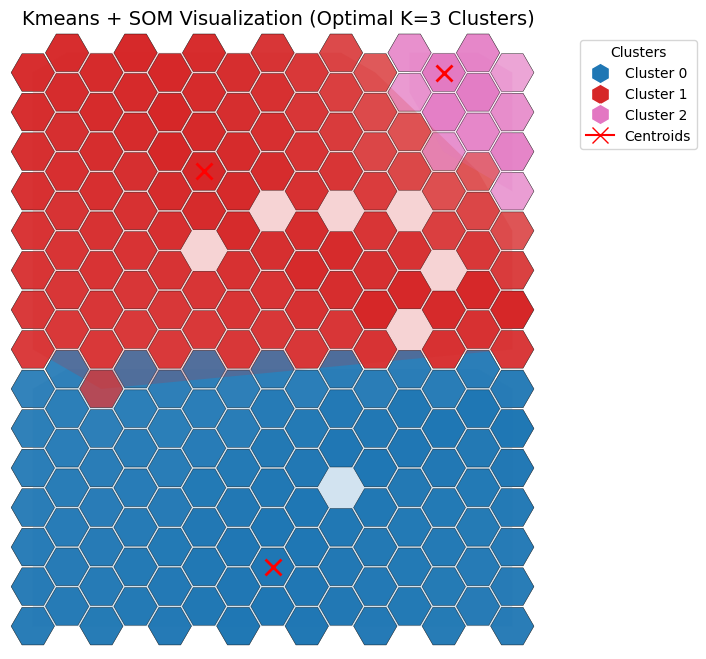

1496

In [ ]:
print("latent_features:",np.array(latent_features_matrix))
print("som_weights:",np.array(som_weights_matrix))
print("labels:",kmeans_labels.tolist())
print("centroids", centroids)
#print("som:",som)
# Best Clustering Metrics for K=3:
# Silhouette Score: 0.9116786122322083, Davies-Bouldin Score: 0.5249973709662115, Calinski-Harabasz Index: 1255.0099599754637

print(f"Latent Features Shape: {np.array(latent_features_matrix).shape}")
print(f"SOM Weights Shape: {np.array(som_weights_matrix).shape}")

visualize_som_clusters_with_best_k(latent_features_matrix, kmeans_labels, som_weights_matrix, best_k=3, som_dim=(15, 15), centroids=centroids)
len(kmeans_labels.tolist())


In [ ]:
# Save to CSV
pd.DataFrame(latent_features_matrix).to_csv("latent_features.csv", index=False)
pd.DataFrame(kmeans_labels).to_csv("labels.csv", index=False)
pd.DataFrame(centroids).to_csv("centroids.csv", index=False)


# Load from CSV
retrieved_latent_features = pd.read_csv("latent_features.csv").values
retrieved_labels = pd.read_csv("labels.csv").values
retrieved_centroids = pd.read_csv("centroids.csv").values


# Save the entire som object
with open("som_weights.pkl", "wb") as file:
    pickle.dump(som_weights_matrix, file)

# Load the som object later
with open("som_weights.pkl", "rb") as file:
    som_loaded = pickle.load(file)

## GANs/Kmeans

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Function to find the best GAN latent space
def find_best_gan_latent_space(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=10):
    best_encoding_dim = None
    best_combined_score = -1
    best_latent_features = None
    metrics_store = []

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]

        # Define GAN components
        generator_input = Input(shape=(encoding_dim,))
        generator_output = Dense(input_dim, activation="relu")(generator_input)
        generator = Model(inputs=generator_input, outputs=generator_output)

        discriminator_input = Input(shape=(input_dim,))
        discriminator_output = Dense(1, activation="sigmoid")(discriminator_input)
        discriminator = Model(inputs=discriminator_input, outputs=discriminator_output)

        # Compile discriminator
        discriminator.compile(optimizer=Adam(learning_rate=learning_rate), loss="binary_crossentropy")

        # GAN model
        gan_input = Input(shape=(encoding_dim,))
        generated_data = generator(gan_input)
        discriminator.trainable = False
        gan_output = discriminator(generated_data)
        gan = Model(gan_input, gan_output)
        gan.compile(optimizer=Adam(learning_rate=learning_rate), loss="binary_crossentropy")

        # Generate latent features
        latent_features = generator.predict(np.random.normal(0, 1, (len(df), encoding_dim)))

        # Evaluate clustering for the given encoding dimension
        silhouette_scores = []
        db_scores = []
        calinski_scores = []

        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)

            # Calculate metrics
            silhouette_avg = silhouette_score(latent_features, labels)
            db_index = davies_bouldin_score(latent_features, labels)
            calinski_harabasz = calinski_harabasz_score(latent_features, labels)

            silhouette_scores.append(silhouette_avg)
            db_scores.append(db_index)
            calinski_scores.append(calinski_harabasz)

        # Compute a combined score
        combined_score = max(silhouette_scores) - min(db_scores) + max(calinski_scores)

        # Store the best encoding dimension
        if combined_score > best_combined_score:
            best_combined_score = combined_score
            best_encoding_dim = encoding_dim
            best_latent_features = latent_features
            metrics_store = {
                "Encoding Dimension": encoding_dim,
                "Silhouette Scores": silhouette_scores,
                "Davies-Bouldin Scores": db_scores,
                "Calinski-Harabasz Scores": calinski_scores,
            }

    # Output metrics for the best encoding dimension
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    print(f"Metrics for Best Encoding Dimension:")
    print(metrics_store)

    return best_encoding_dim, best_latent_features

def evaluate_clusters(latent_features, cluster_range):
    # Initialize lists to store metrics for each k
    silhouette_scores = []
    db_scores = []
    calinski_scores = []

    # Initialize variables to store the best k and corresponding metrics
    best_k = None
    best_silhouette_score = -float('inf')
    best_combined_score = -float('inf')
    best_metrics = None

    for k in cluster_range:
        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Calculate clustering metrics
        silhouette_avg = silhouette_score(latent_features, labels)
        db_index = davies_bouldin_score(latent_features, labels)
        calinski_harabasz = calinski_harabasz_score(latent_features, labels)

        # Store the metrics for plotting
        silhouette_scores.append(silhouette_avg)
        db_scores.append(db_index)
        calinski_scores.append(calinski_harabasz)

        # Compute a combined score (higher silhouette, lower DB, higher CH)
        combined_score = silhouette_avg - db_index + calinski_harabasz

        # Update the best k if this combined score is better
        if combined_score > best_combined_score:
            best_combined_score = combined_score
            best_k = k
            best_silhouette_score = silhouette_avg
            best_metrics = {
                "Silhouette Score": silhouette_avg,
                "Davies-Bouldin Index": db_index,
                "Calinski-Harabasz Index": calinski_harabasz,
            }

    # Visualization of evaluation metrics
    plt.figure(figsize=(18, 6))

    # Plot for Silhouette Score
    plt.subplot(1, 3, 1)
    plt.plot(cluster_range, silhouette_scores, 'go-', label='Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score vs Number of Clusters')
    plt.legend()

    # Plot for Davies-Bouldin Index
    plt.subplot(1, 3, 2)
    plt.plot(cluster_range, db_scores, 'ro-', label='Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index vs Number of Clusters')
    plt.legend()

    # Plot for Calinski-Harabasz Index
    plt.subplot(1, 3, 3)
    plt.plot(cluster_range, calinski_scores, 'bo-', label='Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index vs Number of Clusters')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Print the best k and corresponding metrics
    print(f"Optimal Number of Clusters (k): {best_k}")
    print(f"Silhouette Score for Optimal k: {best_silhouette_score}")
    print("Best Metrics for Optimal k:")
    for metric_name, value in best_metrics.items():
        print(f"  - {metric_name}: {value:.4f}")

    return best_k, best_metrics, best_silhouette_score


# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=50):
    best_encoding_dim, best_latent_features = find_best_gan_latent_space(df, encoding_dims, cluster_range, learning_rate, epochs)
    optimal_k, best_metrics, silhouette_score = evaluate_clusters(best_latent_features, cluster_range)
    print(f"Optimal number of clusters: {optimal_k}")
    print(f"Silhouette Score for optimal k: {silhouette_score}")

    return best_latent_features, optimal_k, best_metrics, silhouette_score

def main_gan_loop():

    # Range of cluster numbers to evaluate
    cluster_range = range(2, 15)
    encoding_dims = range(2, 15)
    best_latent_features, optimal_k, best_metrics, silhouette_score = main_clustering_pipeline(df_copy, encoding_dims, cluster_range)

    # Print final results
    print(f"Optimal Number of Clusters: {optimal_k}")
    print("Metrics for the Optimal k:")
    print(best_metrics)
    return best_latent_features, optimal_k, silhouette_score

while True:
    latent_features, k, silhouette = main_gan_loop()
    if (silhouette > 0.4 and k>2):  # Example condition
        break


## Autoencoders/KMeans

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Step 1: Define the best encoding dimension function
def find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim = None
    best_silhouette_score = -1
    best_latent_features = None
    history_all = []

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]
        input_layer = Input(shape=(input_dim,))
        encoder = Dense(encoding_dim, activation="relu")(input_layer)
        decoder = Dense(input_dim, activation="sigmoid")(encoder)
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Early stopping callback to prevent overfitting
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the autoencoder with early stopping
        history = autoencoder.fit(
            df, df,
            epochs=epochs,
            batch_size=50,
            shuffle=True,
            verbose=1,
            validation_split=0.3,
            callbacks=[early_stopping]
        )
        history_all.append(history.history)

        # Extract and display the latent features
        encoder_model = Model(inputs=input_layer, outputs=encoder)
        latent_features = encoder_model.predict(df)

        # Assess with silhouette score and track best encoding dimension
        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)
            score = silhouette_score(latent_features, labels)
            if score > best_silhouette_score:
                best_silhouette_score = score
                best_encoding_dim = encoding_dim
                best_latent_features = latent_features

    # Plot loss and validation loss for each encoding dimension
    plt.figure(figsize=(12, 8))
    for i, history in enumerate(history_all):
        plt.plot(history['loss'], label=f'Encoding Dim {encoding_dims[i]} - Training Loss')
        plt.plot(history['val_loss'], '--', label=f'Encoding Dim {encoding_dims[i]} - Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss for Different Encoding Dimensions')
    plt.legend()
    plt.show()

    return best_encoding_dim, np.array(best_latent_features)

# Step 2: Perform clustering with multi-metric evaluation
def evaluate_clusters(latent_features, cluster_range):
    inertia_values, bic_scores, calinski_scores, gap_stats, silhouette_scores, db_scores = [], [], [], [], [], []

    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Inertia for Elbow Method
        inertia_values.append(kmeans.inertia_)

        # BIC
        n_features = latent_features.shape[1]
        bic = np.log(len(latent_features)) * k * n_features - 2 * np.log(kmeans.inertia_)
        bic_scores.append(bic)

        # Calinski-Harabasz Index
        calinski = calinski_harabasz_score(latent_features, labels)
        calinski_scores.append(calinski)

        # Gap Statistic
        gap_stat = calculate_gap_statistic(latent_features, k)
        gap_stats.append(gap_stat)

        # Silhouette Score
        silhouette = silhouette_score(latent_features, labels)
        silhouette_scores.append(silhouette)

        # Davies-Bouldin Index
        db_index = davies_bouldin_score(latent_features, labels)
        db_scores.append(db_index)

    # Plot clustering evaluation metrics
    plt.figure(figsize=(10, 10))

    plt.subplot(2, 3, 1)
    plt.plot(cluster_range, inertia_values, 'bo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal Clusters')

    plt.subplot(2, 3, 2)
    plt.plot(cluster_range, silhouette_scores, 'go-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal Clusters')

    plt.subplot(2, 3, 3)
    plt.plot(cluster_range, db_scores, 'ro-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index for Optimal Clusters')

    plt.subplot(2, 3, 4)
    plt.plot(cluster_range, calinski_scores, 'mo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index for Optimal Clusters')

    plt.subplot(2, 3, 5)
    plt.plot(cluster_range, gap_stats, 'co-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Gap Statistic')
    plt.title('Gap Statistic for Optimal Clusters')

    plt.subplot(2, 3, 6)
    plt.plot(cluster_range, bic_scores, 'yo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('BIC')
    plt.title('BIC for Optimal Clusters')

    plt.tight_layout()
    plt.show()

    # Determine optimal k based on silhouette score
    optimal_k = cluster_range[np.argmax(silhouette_scores)]
    return optimal_k

# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim, best_latent_features = find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate, epochs)
    print(f"Best Encoding Dimension: {best_encoding_dim}")

    # Evaluate clusters for the optimal latent space
    optimal_k = evaluate_clusters(best_latent_features, cluster_range)
    print(f"Optimal number of clusters based on silhouette score: {optimal_k}")

    # Final clustering with optimal k
    kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
    kmeans_labels = kmeans_optimal.fit_predict(best_latent_features)

    # Calculate final scores for optimal k
    silhouette_optimal = silhouette_score(best_latent_features, kmeans_labels)
    db_index_optimal = davies_bouldin_score(best_latent_features, kmeans_labels)
    calinski_optimal = calinski_harabasz_score(best_latent_features, kmeans_labels)
    gap_stat_optimal = calculate_gap_statistic(best_latent_features, optimal_k)

    # Print the final scores
    print("\nFinal Clustering Evaluation Metrics for Optimal k =", optimal_k)
    print(f"Silhouette Score: {silhouette_optimal}")
    print(f"Davies-Bouldin Index: {db_index_optimal}")
    print(f"Calinski-Harabasz Index: {calinski_optimal}")
    print(f"Gap Statistic: {gap_stat_optimal}")

    # Visualization of final clusters
    plt.figure(figsize=(10, 8))
    plt.scatter(best_latent_features[:, 0], best_latent_features[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.7)
    plt.scatter(kmeans_optimal.cluster_centers_[:, 0], kmeans_optimal.cluster_centers_[:, 1], c='red', s=200, marker='X', label='Centroids')
    plt.xlabel('Latent Feature 1')
    plt.ylabel('Latent Feature 2')
    plt.title(f'Final Cluster Visualization with {optimal_k} Clusters')
    plt.legend()
    plt.show()
    return best_latent_features, optimal_k, silhouette_optimal
def main_auto_loop():
  # Run the main clustering pipeline
  encoding_dims = range(2, 15)  # Range of encoding dimensions to test
  cluster_range = range(2, 12)  # Range of possible cluster numbers
  best_latent_features, optimal_k, silhouette_optimal = main_clustering_pipeline(df_copy, encoding_dims, cluster_range)
  return best_latent_features, optimal_k, silhouette_optimal

while(True):
  latent_features, optimal_k, silhouette_optimal=main_auto_loop()
  if(optimal_k==4 and silhouette_optimal>0.65):
    break

In [ ]:
###########################################################################The One#######################################################################################
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Step 1: Define the best encoding dimension function
def find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim = None
    best_silhouette_score = -1
    best_latent_features = None

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]
        input_layer = Input(shape=(input_dim,))
        encoder = Dense(encoding_dim, activation="relu")(input_layer)
        decoder = Dense(input_dim, activation="sigmoid")(encoder)
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Early stopping callback to prevent overfitting
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the autoencoder with early stopping
        history = autoencoder.fit(
            df, df,
            epochs=epochs,
            batch_size=50,
            shuffle=True,
            verbose=1,
            validation_split=0.3,
            callbacks=[early_stopping]
        )

        # Extract and display the latent features
        encoder_model = Model(inputs=input_layer, outputs=encoder)
        latent_features = encoder_model.predict(df)
        print(f"\nLatent Features for encoding dimension {encoding_dim}:\n", latent_features.tolist())

        # Assess with silhouette score and track best encoding dimension
        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)
            score = silhouette_score(latent_features, labels)
            if score > best_silhouette_score:
                best_silhouette_score = score
                best_encoding_dim = encoding_dim
                best_latent_features = latent_features

    # Plot loss and validation loss
    plt.figure(figsize=(8, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss per Epoch')
    plt.legend()
    plt.show()

    return best_encoding_dim, np.array(best_latent_features)  # Return as NumPy array for compatibility

# Step 2: Perform clustering with multi-metric evaluation
def evaluate_clusters(latent_features, cluster_range):
    bic_scores, calinski_scores, gap_stats, silhouette_scores, elbow_inertia = [], [], [], [], []

    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # BIC
        inertia = kmeans.inertia_
        n_features = latent_features.shape[1]
        bic = np.log(len(latent_features)) * k * n_features - 2 * np.log(inertia)
        bic_scores.append(bic)

        # Calinski-Harabasz
        calinski = calinski_harabasz_score(latent_features, labels)
        calinski_scores.append(calinski)

        # Gap Statistic
        gap_stat = calculate_gap_statistic(latent_features, k)
        gap_stats.append(gap_stat)

        # Silhouette Score
        silhouette = silhouette_score(latent_features, labels)
        silhouette_scores.append(silhouette)

        # Elbow Method
        elbow_inertia.append(inertia)

    # Determine the optimal k based on each metric
    optimal_k_bic = cluster_range[np.argmax(bic_scores)]
    optimal_k_calinski = cluster_range[np.argmax(calinski_scores)]
    optimal_k_gap = cluster_range[np.argmax(gap_stats)]
    optimal_k_silhouette = cluster_range[np.argmax(silhouette_scores)]
    optimal_k_elbow = cluster_range[np.argmax(np.diff(np.diff(elbow_inertia)))] + 2

    # Determine the final k by consensus
    metrics = {'bic': optimal_k_bic, 'calinski': optimal_k_calinski, 'gap': optimal_k_gap, 'elbow': optimal_k_elbow, 'silhouette': optimal_k_silhouette}
    optimal_k = max(set(metrics.values()), key=list(metrics.values()).count)

    # Print evaluation results
    print(f"Optimal k by each metric: {metrics}")
    print(f"Final best k based on combined metrics: {optimal_k}")
    print("\nEvaluation Metrics for the Final Clustering:")
    print(f"Best k: {optimal_k}")
    print(f"BIC: {bic_scores[cluster_range.index(optimal_k)]}")
    print(f"Calinski-Harabasz Index: {calinski_scores[cluster_range.index(optimal_k)]}")
    print(f"Gap Statistic: {gap_stats[cluster_range.index(optimal_k)]}")
    print(f"Silhouette Score: {silhouette_scores[cluster_range.index(optimal_k)]}")
    print(f"Davies-Bouldin Index: {davies_bouldin_score(latent_features, kmeans.labels_)}")

    # Display optimal centroids
    final_kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    final_kmeans.fit(latent_features)
    optimal_centroids = final_kmeans.cluster_centers_.tolist()
    print("Optimal Centroids as list of lists:\n", optimal_centroids)

    return optimal_k, optimal_centroids

# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim, best_latent_features = find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate, epochs)
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    optimal_k, optimal_centroids = evaluate_clusters(best_latent_features, cluster_range)
    print("Optimal Latent Features as list of lists:\n", best_latent_features.tolist())

# Run the main clustering pipeline
encoding_dims = range(2, 15)  # Range of encoding dimensions to test
cluster_range = range(3, 15)  # Range of possible cluster numbers
main_clustering_pipeline(df_copy, encoding_dims, cluster_range)


In [ ]:
#################################################### Manual Kmeans formation #########################################################
def custom_kmeans_with_manual_input(
    df_copy,
    best_encoding_dim=None,
    best_latent_features=None,
    best_optimal_k=None,
    best_centroids=None
):
    # Prompt for values if they are not provided
    if best_encoding_dim is None:
        best_encoding_dim = int(input("Enter the best encoding dimension: "))

    if best_latent_features is None:
        latent_features_input = input("Enter the best latent features (format: [[x1,y1], [x2,y2], ...]): ")
        best_latent_features = eval(latent_features_input)

    if best_optimal_k is None:
        best_optimal_k = int(input("Enter the best optimal number of clusters (k): "))

    if best_centroids is None:
        centroids_input = input("Enter the initial centroids (format: [[c1x, c1y], [c2x, c2y], ...]): ")
        best_centroids = eval(centroids_input)

    # Ensure latent features and centroids are in array format
    best_latent_features = np.array(best_latent_features)
    best_centroids = np.array(best_centroids)

    # Check if the number of clusters matches the number of centroids
    if best_centroids.shape[0] != best_optimal_k:
        raise ValueError(f"The number of clusters ({best_optimal_k}) does not match the number of initial centroids ({best_centroids.shape[0]}).")

    # Ensure centroids and latent features have matching dimensions
    if best_centroids.shape[1] != best_encoding_dim:
        raise ValueError(f"The encoding dimension ({best_encoding_dim}) does not match the dimensionality of the initial centroids ({best_centroids.shape[1]}).")

    # Step 1: Define and train the autoencoder
    input_dim = df_copy.shape[1]
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(best_encoding_dim, activation="relu")(input_layer)
    decoder = Dense(input_dim, activation="sigmoid")(encoder)
    autoencoder = Model(inputs=input_layer, outputs=decoder)

    # Compile and train the autoencoder
    learning_rate = 0.00005
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")
    autoencoder.fit(df_copy, df_copy, epochs=20, batch_size=50, shuffle=True, verbose=0)

    # Extract latent features
    encoder_model = Model(inputs=input_layer, outputs=encoder)
    latent_features = encoder_model.predict(df_copy)

    # Convert latent features to list of lists if needed
    best_latent_features_list = latent_features.tolist()

    # Step 2: Perform KMeans clustering
    kmeans = KMeans(
        n_clusters=best_optimal_k,
        init=best_centroids,
        n_init=1,
        random_state=42
    )
    kmeans.fit(best_latent_features)
    labels = kmeans.labels_

    # Calculate clustering evaluation metrics
    silhouette_avg = silhouette_score(best_latent_features, labels)
    wcss = kmeans.inertia_
    calinski_harabasz = calinski_harabasz_score(best_latent_features, labels)
    davies_bouldin = davies_bouldin_score(best_latent_features, labels)

    # Approximate BIC (using a simplified approach with WCSS and clusters)
    num_points, num_dimensions = best_latent_features.shape
    bic = num_points * np.log(wcss / num_points) + best_optimal_k * np.log(num_points)

    # Display metrics
    print("Silhouette Score:", silhouette_avg)
    print("WCSS (Elbow):", wcss)
    print("BIC (Approximate):", bic)
    print("Calinski-Harabasz Index:", calinski_harabasz)
    print("Davies-Bouldin Index:", davies_bouldin)

    # Print final cluster centers and labels
    best_centroids_list = kmeans.cluster_centers_.tolist()
    print("Final Cluster Centers (as list of lists):", best_centroids_list)
    print("Labels:", labels)

    # Visualization step for clusters
    if best_encoding_dim > 2:
        # Apply PCA for dimensionality reduction if needed
        pca = PCA(n_components=2)
        reduced_features = pca.fit_transform(best_latent_features)
        reduced_centroids = pca.transform(kmeans.cluster_centers_)
    else:
        reduced_features = best_latent_features
        reduced_centroids = kmeans.cluster_centers_

    plt.figure(figsize=(10, 7))
    for cluster in range(best_optimal_k):
        cluster_points = reduced_features[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}", alpha=0.5)
    plt.scatter(reduced_centroids[:, 0], reduced_centroids[:, 1], color='black', marker='X', s=100, label='Centroids')
    plt.title('KMeans Clustering Visualization')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend()
    plt.grid(True)
    plt.show()

    return {
        "best_encoding_dim": best_encoding_dim,
        "best_optimal_k": best_optimal_k,
        "best_latent_features_list": best_latent_features_list,
        "best_centroids_list": best_centroids_list,
        "labels": labels,
        "metrics": {
            "silhouette_score": silhouette_avg,
            "wcss": wcss,
            "bic": bic,
            "calinski_harabasz": calinski_harabasz,
            "davies_bouldin": davies_bouldin
        }
    }

# Example usage:
# Assuming df_copy, best_latent_features, best_optimal_k, and best_centroids are predefined or provided by the user.

centroids = [[0.015132732689380646, 0.01584158092737198], [1.7088886499404907, 0.003064662218093872], [0.05842271447181702, 1.1589293479919434]]
result = custom_kmeans_with_manual_input(df_copy, 2, latents, 3,centroids )

# Access metrics and other results
print("Resulted Metrics:", result["metrics"])
print("Final Cluster Centers:", result["best_centroids_list"])
print("Labels:", result["labels"])
print("Best Encoding Dimension:", result["best_encoding_dim"])
print("Best Optimal k:", result["best_optimal_k"])


# **Clusters Analysis**

In [ ]:
df_copy

,age,years_job_experience,computer_science_knowledge,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,jobField_id,work_hours_prior_test,...,test_location_Linux aarch64,test_location_Linux armv7l,test_location_Linux armv81,test_location_Linux armv8l,test_location_Linux i686,test_location_Linux x86_64,test_location_MacIntel,test_location_Win32,test_location_iPad,test_location_iPhone
0,0.125270,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.423257,0.009890,-0.341740,-1.438876,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.125270,0.720449,-0.366541,-0.424041,2.374658,1.821676,-1.066519,2.863615,1.864068,0.243490,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.877938,-1.346663,-0.608801,-0.424041,-0.455082,-0.018413,-1.066519,-0.626901,-0.042383,0.331020,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.195431,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.604517,-2.933455,-0.341740,0.583469,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.966120,-1.346663,-0.366541,2.358263,-0.269247,1.821676,-1.066519,0.009890,1.864068,-1.438876,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1491,-0.553618,-1.346663,-2.296188,-0.424041,0.038665,1.821676,0.423257,0.009890,1.864068,-1.438876,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1492,-0.086416,0.375209,0.153332,-0.424041,0.038665,-0.542586,0.423257,0.381157,-0.620545,0.407150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1493,1.008461,1.007694,-0.366541,-0.424041,-0.821871,0.020819,0.423257,-0.379477,-0.620545,0.672705,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1494,1.465359,2.302497,-0.114035,2.358263,-0.104441,-0.130015,1.841270,-0.322779,-0.153633,0.331020,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
def plot_box_plots_for_all_features_by_cluster(features_df, labels):
    """
    Plots box plots for each feature in the DataFrame across different clusters.

    Parameters:
    - features_df (pd.DataFrame): DataFrame containing all features to plot.
    - labels (array-like): Cluster labels for each data point.
    """
    # Add cluster labels to the DataFrame
    features_df['Cluster'] = labels

    # Get the list of feature columns (excluding 'Cluster')
    feature_columns = features_df.columns[:-1]  # Exclude 'Cluster' column

    # Set up the plotting grid
    num_features = len(feature_columns)
    plt.figure(figsize=(12, 4 * num_features))

    # Plot box plot for each feature
    for i, column in enumerate(feature_columns):
        plt.subplot(num_features, 1, i + 1)
        sns.boxplot(x="Cluster", y=column, data=features_df)
        plt.title(f"Box Plot of {column} by Cluster")
        plt.xlabel("Cluster")
        plt.ylabel("Feature Value")

    plt.tight_layout()
    plt.show()


[0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 1, 0, 1, 2, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 

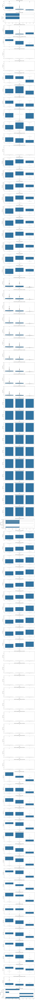

In [ ]:
# #final_label= [0, 0, 2, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 3, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 1, 0, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 0, 0, 1, 1, 2, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 0, 2, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]
# final_label= [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 1, 3, 0, 3, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 2, 2, 3, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 1, 1, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 3, 2, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 3, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 3, 2, 2, 0, 3, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 0, 1, 3, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 3, 1, 0, 0, 0, 3, 0, 0, 3, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 3, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 2, 0, 3, 0]
# plot_box_plots_for_all_features_by_cluster(df_actual, final_label)
# Load the labels from labels.csv
labels_file = 'labels.csv'  # Replace with the correct path if needed
labels_df = pd.read_csv(labels_file, header=None)  # No header in the file

# Exclude the first row and convert the remaining column to a list
labels_array = labels_df[0].iloc[1:].tolist()

# Print the labels array
print(labels_array)


plot_box_plots_for_all_features_by_cluster(df_actual, labels_array)


In [ ]:
df_actual['labels'] = labels_array
df_actual = df_actual.drop(columns=['Cluster'])
df_copy['labels'] = labels_array

c0= df_actual[df_actual['labels']==0]
c1= df_actual[df_actual['labels']==1]
c2= df_actual[df_actual['labels']==2]
#c3= df_actual[df_actual['labels']==3]

df_actual.head()


,age,gender,years_job_experience,computer_science_knowledge,antiPhishing_course,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,...,openness,scarcity,consistency,social_proof,gratitude,authority,result,education_job_interaction,region,labels
0,26,Male,0,5,0,0,5,4,2,5,...,4,3,4,1,4,4,3,8,Europe,0
1,26,Female,10,2,0,0,10,15,1,9,...,3,1,3,3,3,5,4,15,Europe,1
2,50,Female,0,1,0,0,4,9,1,2,...,2,2,3,2,5,2,7,9,Europe,0
3,27,Female,0,5,0,0,5,4,3,1,...,3,1,5,2,5,5,4,12,Europe,0
4,17,Female,0,2,0,1,5,15,1,5,...,2,3,5,0,5,3,4,15,Europe,1


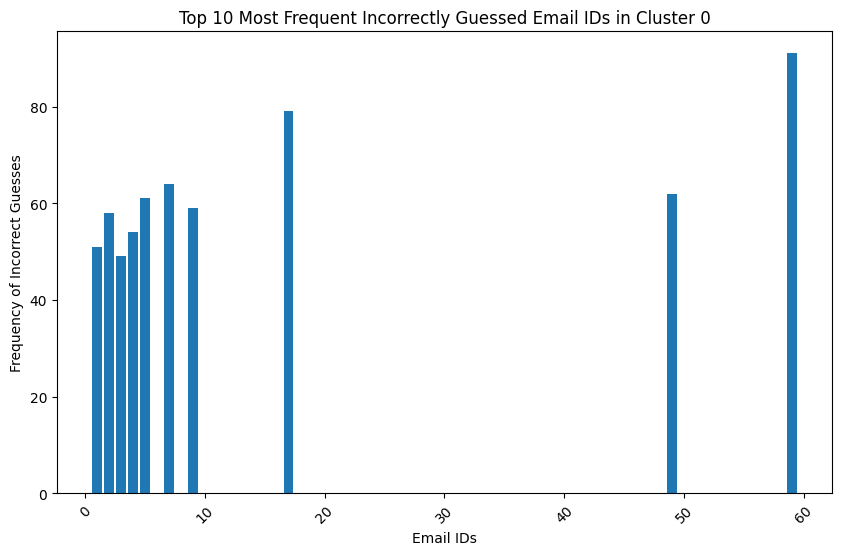

Incorrect emails in cluster 0: [59, 17, 7, 49, 5, 9, 2, 4, 1, 3, 22, 60, 26, 71, 6, 8, 25, 53, 20, 104, 21, 100, 132, 86, 13, 95, 131, 98, 51, 52, 30, 39, 55, 67, 56, 14, 48, 103, 135, 58, 61, 32, 65, 91, 11, 19, 12, 88, 47, 50, 84, 89, 15, 10, 62, 68, 130, 66, 127, 28, 29, 97, 126, 110, 18, 36, 107, 73, 94, 111, 129, 153, 33, 31, 23, 35, 77, 90, 70, 69, 75, 63, 37, 38, 24, 128, 99, 74, 109, 116, 125, 108, 114, 64, 167, 164, 152, 161, 57, 27, 40, 44, 83, 112, 134, 113, 87, 133, 102, 160, 174, 54, 34, 106, 146, 41, 93, 163, 139, 170, 162, 81, 45, 96, 149, 148, 72, 82, 123, 143, 151, 157, 16, 92, 158, 155, 156, 144, 142, 46, 79, 171, 165, 147, 145, 176, 141, 105, 43, 78, 117, 138, 101, 169, 137, 154, 136, 175, 166, 42, 80, 121, 124, 159, 172, 150, 173, 118, 140]


In [ ]:
import matplotlib.pyplot as plt
from collections import Counter



def get_incorrectly_guessed_emails_with_plot(df, cluster_number):
    # Filter the DataFrame based on the cluster number
    cluster_df = df[df_actual['labels'] == cluster_number]

    # Initialize a counter to collect frequency of unique, incorrectly guessed email IDs
    incorrect_guesses = Counter()

    # Iterate over each row in the filtered DataFrame
    for _, row in cluster_df.iterrows():
        # Iterate over columns in pairs (test_answer_{num}, email_id_{num})
        for num in range(1, 11):  # Assuming test_answer and email_id columns up to {10}
            test_answer_col = f'test_answer_{num}'
            email_id_col = f'email_id_{num}'

            # Check if columns exist to avoid KeyErrors
            if test_answer_col in row and email_id_col in row:
                test_answer = row[test_answer_col]
                email_id = row[email_id_col]

                # Increment counter for email IDs that were guessed incorrectly
                if (test_answer == 0.0 and email_id in phishing_ids) or (test_answer == 1.0 and email_id in legitimate_ids):
                    incorrect_guesses[email_id] += 1

    # Plot the top 10 most frequent incorrectly guessed email IDs
    if incorrect_guesses:
        top_incorrect_guesses = incorrect_guesses.most_common(10)
        email_ids, frequencies = zip(*top_incorrect_guesses)

        plt.figure(figsize=(10, 6))
        plt.bar(email_ids, frequencies)
        plt.xlabel('Email IDs')
        plt.ylabel('Frequency of Incorrect Guesses')
        plt.title(f'Top 10 Most Frequent Incorrectly Guessed Email IDs in Cluster {cluster_number}')
        plt.xticks(rotation=45)
        plt.show()

    # Return email IDs sorted by frequency in descending order
    return [email_id for email_id, _ in incorrect_guesses.most_common()]


incorrect_emails_c0 = get_incorrectly_guessed_emails_with_plot(df_clusters, 0)
print("Incorrect emails in cluster 0:", incorrect_emails_c0)

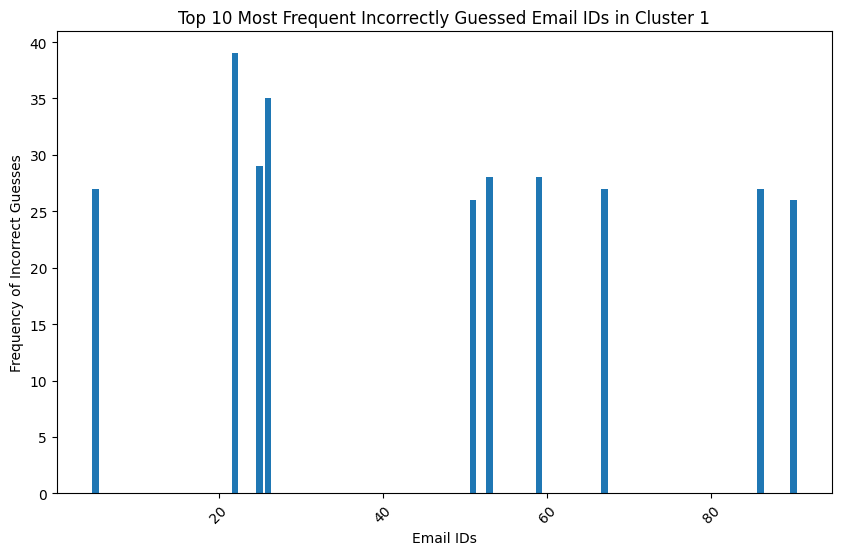

Incorrect emails in cluster 1: [22, 26, 25, 59, 53, 5, 67, 86, 51, 90, 91, 71, 65, 131, 8, 49, 32, 20, 52, 89, 55, 7, 29, 23, 94, 40, 79, 2, 66, 69, 28, 104, 153, 37, 3, 36, 39, 88, 75, 77, 81, 30, 60, 38, 73, 164, 14, 68, 95, 21, 9, 24, 72, 108, 70, 130, 103, 152, 10, 4, 33, 31, 74, 107, 62, 6, 48, 12, 114, 63, 158, 167, 132, 44, 83, 111, 135, 137, 149, 165, 139, 161, 100, 47, 17, 34, 84, 175, 174, 106, 46, 18, 45, 96, 78, 134, 129, 35, 171, 160, 155, 156, 151, 145, 146, 123, 98, 162, 170, 1, 13, 11, 41, 27, 16, 126, 157, 163, 87, 148, 58, 61, 64, 116, 127, 15, 50, 136, 93, 143, 138, 169, 176, 56, 92, 42, 117, 110, 147, 105, 112, 113, 43, 57, 97, 144, 159, 166, 125, 102, 99, 82, 140, 118, 128, 109, 101, 19, 80, 119, 142, 173, 172, 141, 133, 54, 122, 150, 154, 121, 168]


In [ ]:
incorrect_emails_c1 = get_incorrectly_guessed_emails_with_plot(df_clusters, 1)
print("Incorrect emails in cluster 1:", incorrect_emails_c1)

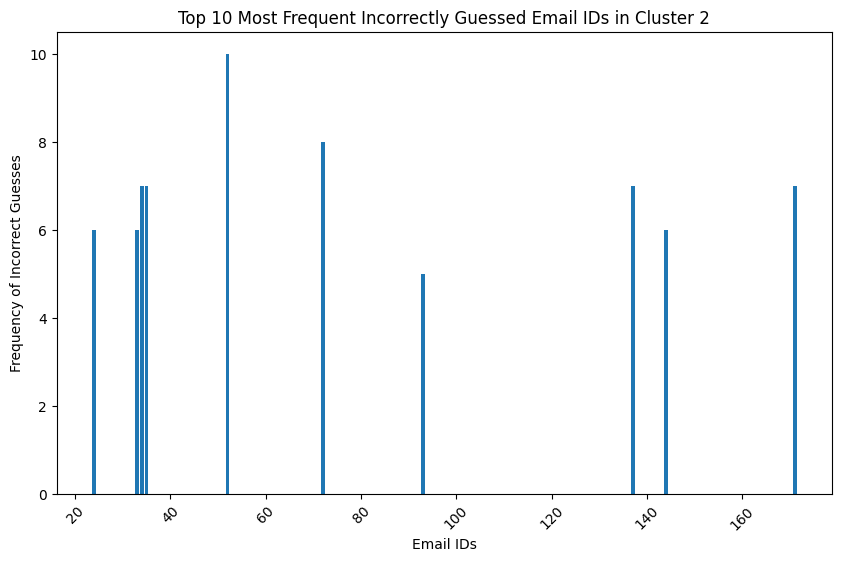

Incorrect emails in cluster 1: [52, 72, 34, 35, 171, 137, 33, 24, 144, 93, 69, 36, 138, 145, 142, 74, 136, 50, 39, 22, 43, 46, 71, 96, 78, 143, 175, 141, 68, 32, 65, 73, 29, 45, 31, 94, 42, 167, 169, 146, 140, 131, 25, 87, 62, 95, 23, 37, 27, 70, 59, 44, 7, 28, 75, 156, 149, 170, 40, 84, 41, 38, 53, 66, 63, 21, 77, 79, 60, 26, 88, 13, 11, 57, 5, 16, 17, 54, 4, 80, 90, 160, 158, 163, 172, 154, 151, 150, 147, 152, 174, 176, 173, 139, 91, 67, 89, 64, 86, 30, 20, 106, 107, 8, 155, 101, 83, 47]


In [ ]:
incorrect_emails_c2 = get_incorrectly_guessed_emails_with_plot(df_clusters, 2)
print("Incorrect emails in cluster 1:", incorrect_emails_c2)

In [ ]:
# Overall level summary
df_profile_overall = df_actual.describe().T

# using mean; use appropriate summarization (median, count, etc.) for each feature
df_profile_overall['Overall Dataset'] = df_profile_overall[['mean']]
df_profile_overall = df_profile_overall[['Overall Dataset']]

# Cluster ID level summary
df_cluster_summary = df_actual.groupby('labels').describe().T.reset_index()
df_cluster_summary = df_cluster_summary.rename(columns={'level_0':'column','level_1':'metric'})

# using mean; use appropriate summarization (median, count, etc.) for each feature
df_cluster_summary = df_cluster_summary[df_cluster_summary['metric'] == "mean"]
df_cluster_summary = df_cluster_summary.set_index('column')

# join into single summary dataset
df_profile = df_cluster_summary.join(df_profile_overall) # joins on Index
df_profile


,metric,0,1,2,Overall Dataset
column,,,,,
age,mean,35.716186,24.268293,20.901639,31.033422
years_job_experience,mean,10.461197,2.118199,3.901639,7.221257
computer_science_knowledge,mean,3.453437,2.110694,0.524590,2.855615
antiPhishing_course,mean,0.089800,0.046904,0.000000,0.070856
phishing_attack,mean,0.178492,0.125704,0.000000,0.152406
...,...,...,...,...,...
social_proof,mean,2.329268,2.356473,0.672131,2.271390
gratitude,mean,3.541020,2.787992,0.622951,3.153743
authority,mean,3.270510,3.178236,0.786885,3.136364


In [ ]:

def approximate_cluster_values(df_profile):
    # Dictionary to store the approximated values for each cluster
    cluster_approximations = {}

    # Loop through each cluster column, excluding 'Overall Dataset'
    for cluster in df_profile.columns[df_profile.columns != 'Overall Dataset']:
        # Filter out non-numeric values (ensure only numeric data is processed)
        numeric_data = pd.to_numeric(df_profile[cluster], errors='coerce')

        # Drop NaN values that resulted from non-numeric entries
        numeric_data = numeric_data.dropna()

        # Round the numeric values to the nearest whole number and convert to integers
        approximated_values = numeric_data.round().astype(int)

        # Store the approximated values along with their index in the dictionary
        cluster_approximations[cluster] = approximated_values

    return cluster_approximations

# Example usage with the df_profile DataFrame
approximated_clusters = approximate_cluster_values(df_profile)

# Print the approximated values for each cluster along with their index (column names)
for cluster, values in approximated_clusters.items():
    print(f"Cluster {cluster} approximated values:")
    for index, value in values.items():
        print(f"  {index}: {value}")


Cluster metric approximated values:
Cluster 0 approximated values:
  age: 36
  years_job_experience: 10
  computer_science_knowledge: 3
  antiPhishing_course: 0
  phishing_attack: 0
  time_on_internet: 6
  educationField_id: 7
  educationLevel_id: 2
  employmentType_id: 5
  jobField_id: 7
  work_hours_prior_test: 4
  antiPhishing_course_ever: 0
  id_1: 8504
  id_2: 8505
  id_3: 8506
  id_4: 8507
  id_5: 8508
  id_6: 8509
  id_7: 8510
  id_8: 8511
  id_9: 8512
  id_10: 8513
  time_taken_to_answer_1: 38
  time_taken_to_answer_2: 27
  time_taken_to_answer_3: 25
  time_taken_to_answer_4: 22
  time_taken_to_answer_5: 22
  time_taken_to_answer_6: 21
  time_taken_to_answer_7: 20
  time_taken_to_answer_8: 19
  time_taken_to_answer_9: 19
  time_taken_to_answer_10: 18
  test_answer_1: 1
  test_answer_2: 1
  test_answer_3: 1
  test_answer_4: 1
  test_answer_5: 1
  test_answer_6: 1
  test_answer_7: 1
  test_answer_8: 1
  test_answer_9: 1
  test_answer_10: 1
  email_id_1: 63
  email_id_2: 62
  emai

# **Predictive Clustering**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Assuming df_actual is your DataFrame and 'labels' is the target column
X = df_copy.drop('labels', axis=1)
y = df_copy['labels']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Tree-Based Models

Random Forest, GBM, XGBoost


Random Forest:
Accuracy: 0.9198218262806236
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       281
           1       0.89      0.87      0.88       150
           2       0.94      0.89      0.91        18

    accuracy                           0.92       449
   macro avg       0.92      0.90      0.91       449
weighted avg       0.92      0.92      0.92       449



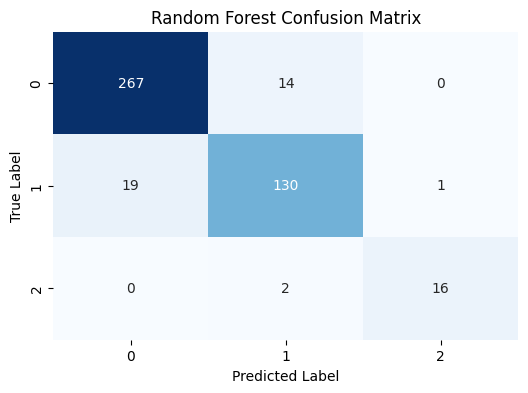

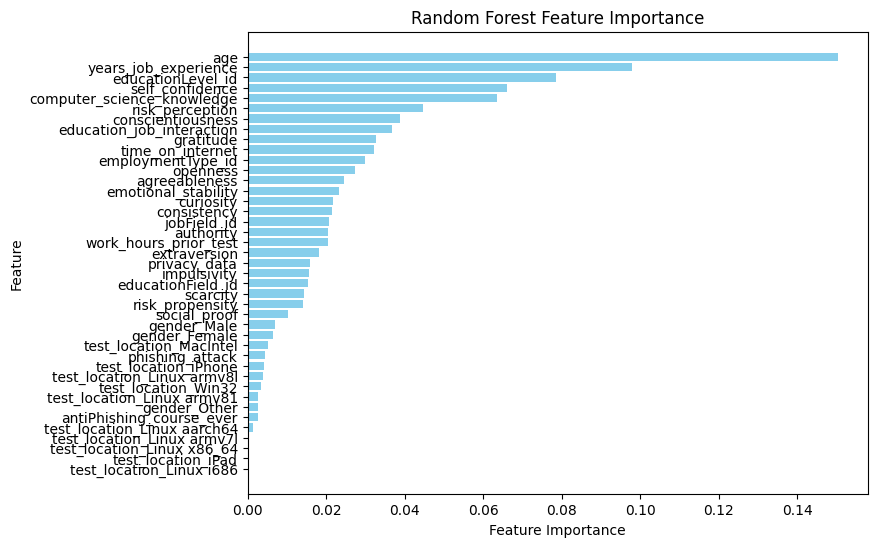


Gradient Boosting Machine:
Accuracy: 0.9398663697104677
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       281
           1       0.90      0.92      0.91       150
           2       0.94      0.89      0.91        18

    accuracy                           0.94       449
   macro avg       0.93      0.92      0.93       449
weighted avg       0.94      0.94      0.94       449



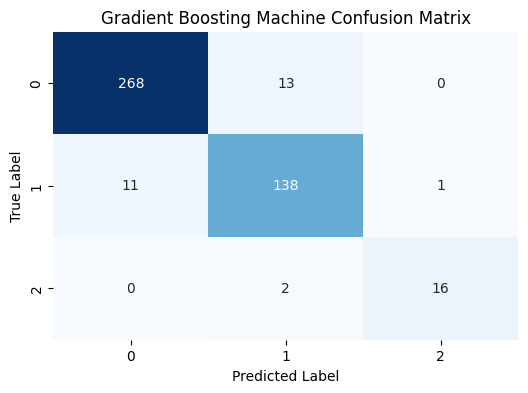

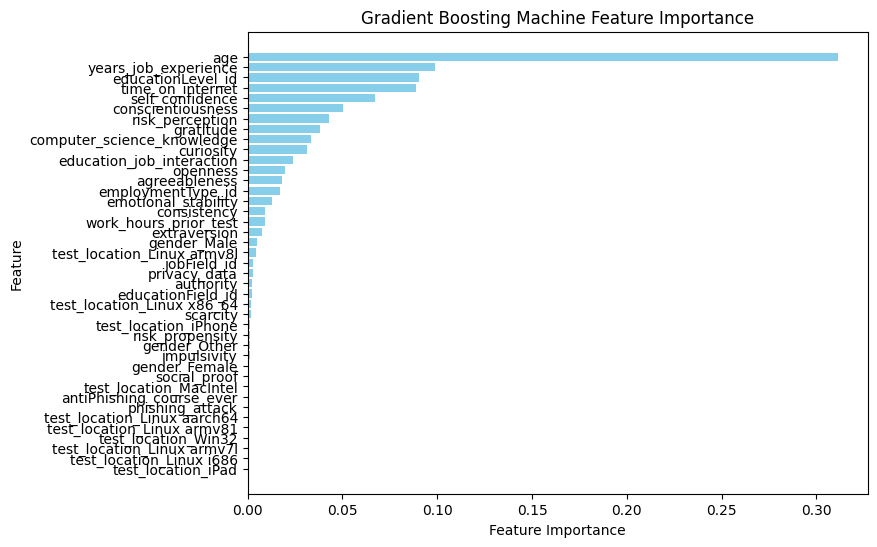


XGBoost:
Accuracy: 0.9220489977728286
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       281
           1       0.88      0.89      0.88       150
           2       0.89      0.89      0.89        18

    accuracy                           0.92       449
   macro avg       0.90      0.91      0.91       449
weighted avg       0.92      0.92      0.92       449



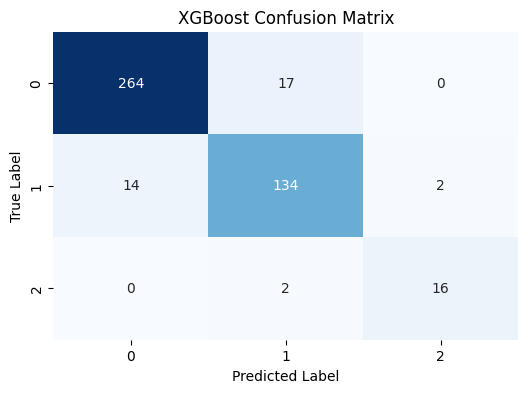

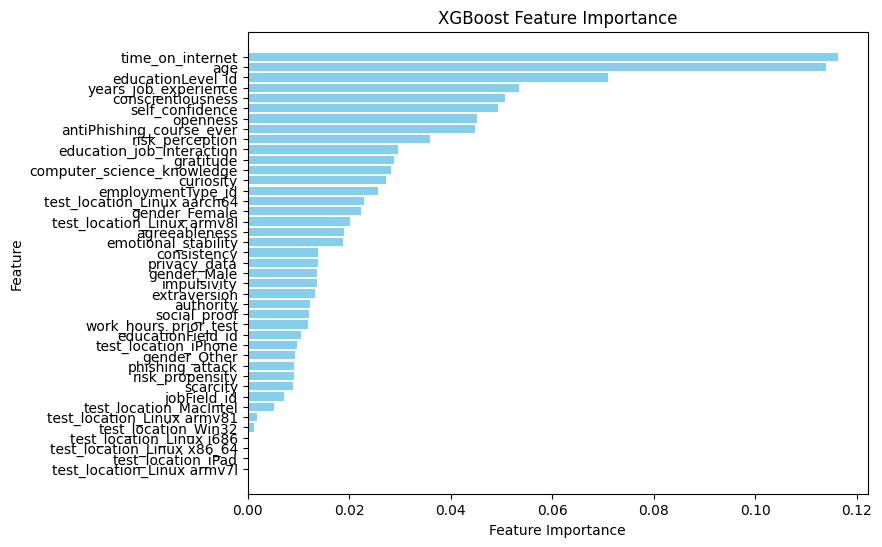


Model Accuracy Comparison:
Random Forest Accuracy: 0.9198218262806236
Gradient Boosting Machine Accuracy: 0.9398663697104677
XGBoost Accuracy: 0.9220489977728286


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_predictive_clustering_models(df, label_column):
    # Split data into features and labels
    X = df.drop(columns=[label_column])
    y = df[label_column]

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Initialize models
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    gbm_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
    xgb_model = XGBClassifier(n_estimators=100, random_state=42)

    # Dictionary to store results
    results = {}

    # Function to evaluate a model
    def evaluate_model(model, model_name):
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        class_report = classification_report(y_test, predictions, output_dict=True)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Store results
        results[model_name] = {
            "accuracy": accuracy,
            "classification_report": class_report,
            "confusion_matrix": conf_matrix
        }

        # Print results
        print(f"\n{model_name}:")
        print(f"Accuracy: {accuracy}")
        print(classification_report(y_test, predictions))

        # Plot confusion matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"{model_name} Confusion Matrix")
        plt.show()

        # Plot feature importance if available
        if hasattr(model, "feature_importances_"):
            feature_importance = model.feature_importances_
            sorted_idx = np.argsort(feature_importance)[::-1]
            plt.figure(figsize=(8, 6))
            plt.barh(np.array(X.columns)[sorted_idx], feature_importance[sorted_idx], color="skyblue")
            plt.xlabel("Feature Importance")
            plt.ylabel("Feature")
            plt.title(f"{model_name} Feature Importance")
            plt.gca().invert_yaxis()
            plt.show()

        return accuracy, class_report, conf_matrix

    # Evaluate each model
    rf_results = evaluate_model(rf_model, "Random Forest")
    gbm_results = evaluate_model(gbm_model, "Gradient Boosting Machine")
    xgb_results = evaluate_model(xgb_model, "XGBoost")

    return results

# Example usage
label_column = "labels"  # Replace with the actual label column name
results = evaluate_predictive_clustering_models(df_copy, label_column)

# Example comparison of model accuracy
rf_accuracy = results["Random Forest"]["accuracy"]
rf_precision = results["Random Forest"]["classification_report"]["weighted avg"]["precision"]
rf_recall = results["Random Forest"]["classification_report"]["weighted avg"]["recall"]
rf_f1_score = results["Random Forest"]["classification_report"]["weighted avg"]["f1-score"]

gbm_accuracy = results["Gradient Boosting Machine"]["accuracy"]
gbm_precision = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["precision"]
gbm_recall = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["recall"]
gbm_f1_score = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["f1-score"]

xgb_accuracy = results["XGBoost"]["accuracy"]
xgb_precision = results["XGBoost"]["classification_report"]["weighted avg"]["precision"]
xgb_recall = results["XGBoost"]["classification_report"]["weighted avg"]["recall"]
xgb_f1_score = results["XGBoost"]["classification_report"]["weighted avg"]["f1-score"]

print("\nModel Accuracy Comparison:")
print(f"Random Forest Accuracy: {rf_accuracy}")
print(f"Gradient Boosting Machine Accuracy: {gbm_accuracy}")
print(f"XGBoost Accuracy: {xgb_accuracy}")


###Support Vector Machines (SVM)


SVM with Linear Kernel:
Accuracy: 0.9755011135857461
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       281
           1       0.95      0.98      0.96       150
           2       0.94      0.89      0.91        18

    accuracy                           0.98       449
   macro avg       0.96      0.95      0.95       449
weighted avg       0.98      0.98      0.98       449



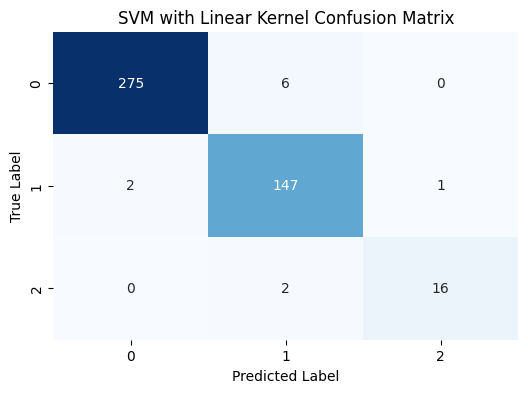


SVM with RBF Kernel:
Accuracy: 0.9621380846325167
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       281
           1       0.93      0.95      0.94       150
           2       0.94      0.89      0.91        18

    accuracy                           0.96       449
   macro avg       0.95      0.94      0.94       449
weighted avg       0.96      0.96      0.96       449



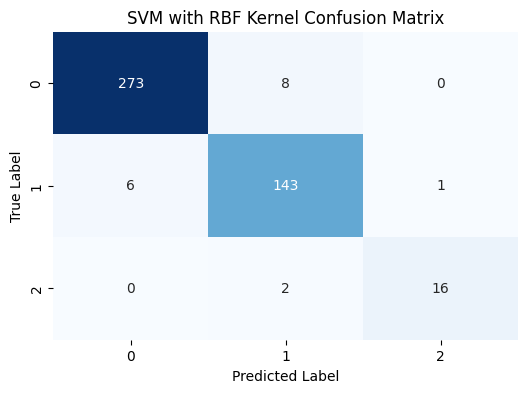


Model Accuracy Comparison:
SVM with Linear Kernel Accuracy: 0.9755011135857461
SVM with RBF Kernel Accuracy: 0.9621380846325167


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

def evaluate_svm_models(X, y, test_size=0.3):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)

    # Dictionary to store results
    results = {}

    # Function to evaluate an SVM model
    def evaluate_model(model, model_name):
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        class_report = classification_report(y_test, predictions, output_dict=True)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Store results
        results[model_name] = {
            "accuracy": accuracy,
            "classification_report": class_report,
            "confusion_matrix": conf_matrix
        }

        # Print results
        print(f"\n{model_name}:")
        print(f"Accuracy: {accuracy}")
        print(classification_report(y_test, predictions))

        # Plot confusion matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"{model_name} Confusion Matrix")
        plt.show()

        # Plot decision boundary if data is 2D
        if X.shape[1] == 2:
            h = 0.02
            x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
            y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
            xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
            Z = Z.reshape(xx.shape)
            plt.contourf(xx, yy, Z, cmap="coolwarm", alpha=0.8)
            plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap="coolwarm", edgecolors="k", marker="o", s=20, label="Train")
            plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap="coolwarm", edgecolors="k", marker="x", s=30, label="Test")
            plt.xlabel("Feature 1")
            plt.ylabel("Feature 2")
            plt.title(f"{model_name} Decision Boundary")
            plt.legend(loc="upper left")
            plt.show()

        return accuracy, class_report, conf_matrix

    # Evaluate SVM with Linear Kernel
    linear_svm = SVC(kernel='linear', random_state=42)
    linear_results = evaluate_model(linear_svm, "SVM with Linear Kernel")

    # Evaluate SVM with RBF Kernel
    rbf_svm = SVC(kernel='rbf', random_state=42)
    rbf_results = evaluate_model(rbf_svm, "SVM with RBF Kernel")

    return results


results = evaluate_svm_models(X, y)

# Example comparison of model accuracy
linear_accuracy = results["SVM with Linear Kernel"]["accuracy"]
linear_precision = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["precision"]
linear_recall = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["recall"]
linear_f1_score = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["f1-score"]

rbf_accuracy = results["SVM with RBF Kernel"]["accuracy"]
rbf_precision = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["precision"]
rbf_recall = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["recall"]
rbf_f1_score = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["f1-score"]

print("\nModel Accuracy Comparison:")
print(f"SVM with Linear Kernel Accuracy: {linear_accuracy}")
print(f"SVM with RBF Kernel Accuracy: {rbf_accuracy}")


### Bayesian Models

Naive Bayes Model Performance:
Accuracy: 0.49
              precision    recall  f1-score   support

           0       1.00      0.41      0.58       189
           1       0.39      0.56      0.46        96
           2       0.18      1.00      0.31        15

    accuracy                           0.49       300
   macro avg       0.52      0.66      0.45       300
weighted avg       0.76      0.49      0.53       300



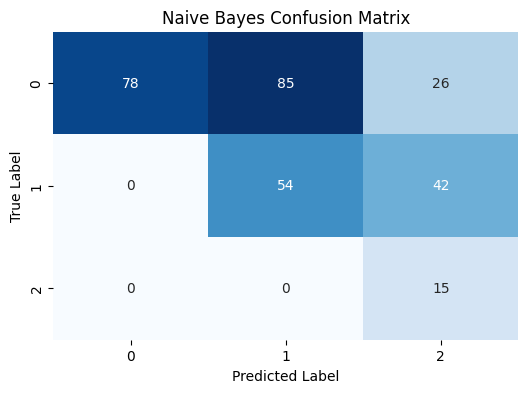

Naive Bayes Accuracy: 0.49


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_naive_bayes(X, y, test_size=0.3):

    # Initialize and train the Gaussian Naive Bayes model
    naive_bayes_model = GaussianNB()
    naive_bayes_model.fit(X_train, y_train)

    # Make predictions on the test set
    naive_bayes_predictions = naive_bayes_model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, naive_bayes_predictions)
    class_report = classification_report(y_test, naive_bayes_predictions, output_dict=True)
    conf_matrix = confusion_matrix(y_test, naive_bayes_predictions)

    # Print results
    print("Naive Bayes Model Performance:")
    print(f"Accuracy: {accuracy}")
    print(classification_report(y_test, naive_bayes_predictions))

    # Visualize confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Naive Bayes Confusion Matrix")
    plt.show()

    # Return results
    return {
        "accuracy": accuracy,
        "classification_report": class_report,
        "confusion_matrix": conf_matrix
    }


# Call the function to evaluate Naive Bayes and store the results
naive_bayes_results = evaluate_naive_bayes(X, y)
nb_accuracy= naive_bayes_results["accuracy"]
nb_precision = naive_bayes_results["classification_report"]["weighted avg"]["precision"]
nb_recall = naive_bayes_results["classification_report"]["weighted avg"]["recall"]
nb_f1_score = naive_bayes_results["classification_report"]["weighted avg"]["f1-score"]

# Access and print specific metrics if needed
print("Naive Bayes Accuracy:", naive_bayes_results["accuracy"])


### Nearest Neighbor Models

k-Nearest Neighbors Model Performance (k=5):
Accuracy: 0.88
              precision    recall  f1-score   support

           0       0.94      0.89      0.92       189
           1       0.78      0.86      0.82        96
           2       0.81      0.87      0.84        15

    accuracy                           0.88       300
   macro avg       0.85      0.87      0.86       300
weighted avg       0.89      0.88      0.88       300



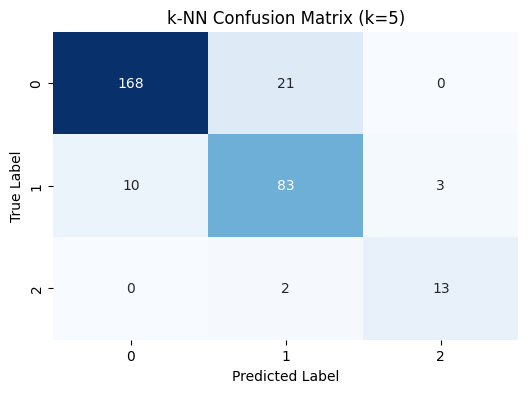

k-NN Accuracy: 0.88


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_knn(X, y, k=5, test_size=0.3):

    # Initialize and train the k-NN model
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train, y_train)

    # Make predictions on the test set
    knn_predictions = knn_model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, knn_predictions)
    class_report = classification_report(y_test, knn_predictions, output_dict=True)
    conf_matrix = confusion_matrix(y_test, knn_predictions)

    # Print results
    print(f"k-Nearest Neighbors Model Performance (k={k}):")
    print(f"Accuracy: {accuracy}")
    print(classification_report(y_test, knn_predictions))

    # Visualize confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"k-NN Confusion Matrix (k={k})")
    plt.show()

    # Return results
    return {
        "accuracy": accuracy,
        "classification_report": class_report,
        "confusion_matrix": conf_matrix
    }

# Call the function to evaluate k-NN and store the results
knn_results = evaluate_knn(X, y, k=5)
knn_accuracy= knn_results["accuracy"]
knn_precision = knn_results["classification_report"]["weighted avg"]["precision"]
knn_recall = knn_results["classification_report"]["weighted avg"]["recall"]
knn_f1_score = knn_results["classification_report"]["weighted avg"]["f1-score"]

# Access and print specific metrics if needed
print("k-NN Accuracy:", knn_results["accuracy"])


### Neural Network Models

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6465 - loss: 0.8094 - val_accuracy: 0.9167 - val_loss: 0.3488
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8746 - loss: 0.3606 - val_accuracy: 0.9583 - val_loss: 0.1952
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9122 - loss: 0.2337 - val_accuracy: 0.9500 - val_loss: 0.1360
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9169 - loss: 0.1876 - val_accuracy: 0.9833 - val_loss: 0.0903
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9381 - loss: 0.1623 - val_accuracy: 0.9833 - val_loss: 0.0870
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9582 - loss: 0.1310 - val_accuracy: 0.9833 - val_loss: 0.0702
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9754 - loss: 0.0893 - val_accuracy: 0.9833 - val_loss: 0.0595
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9672 - loss: 0.1066 - val_accuracy: 0.9667 - val_loss: 0.0739
Epo

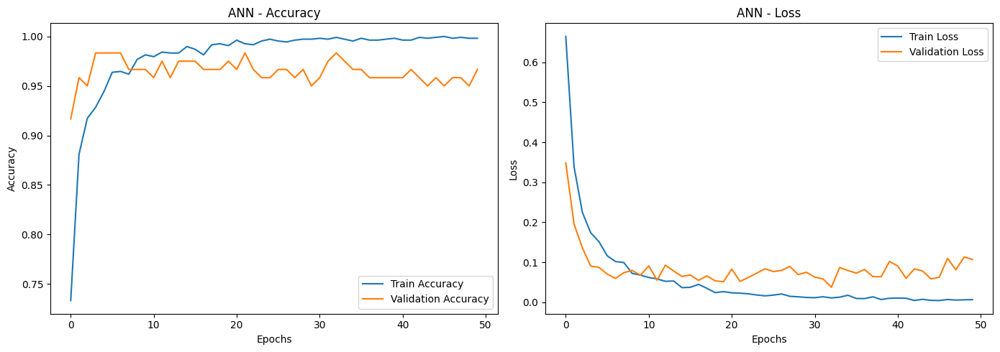

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
ANN - Test Accuracy: 0.97

ANN - Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99       189
           1       0.95      0.96      0.95        96
           2       0.87      0.87      0.87        15

    accuracy                           0.97       300
   macro avg       0.93      0.94      0.94       300
weighted avg       0.97      0.97      0.97       300



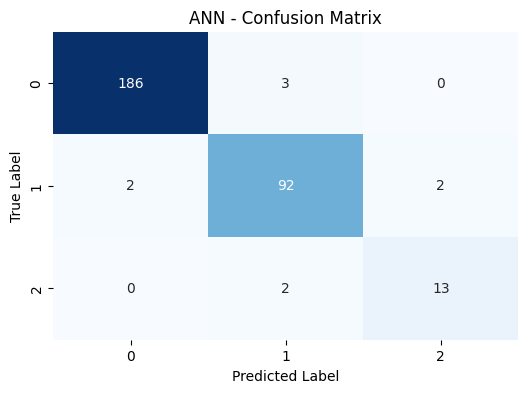

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.7096 - loss: 0.6630 - val_accuracy: 0.8667 - val_loss: 0.2762
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9046 - loss: 0.2460 - val_accuracy: 0.9500 - val_loss: 0.1583
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9362 - loss: 0.1771 - val_accuracy: 0.9583 - val_loss: 0.1418
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9465 - loss: 0.1411 - val_accuracy: 0.9750 - val_loss: 0.1122
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9560 - loss: 0.1155 - val_accuracy: 0.9833 - val_loss: 0.0866
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9542 - loss: 0.1145 - val_accuracy: 0.9583 - val_loss: 0.0875
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9671 - loss: 0.1026 - val_accuracy: 0.9667 - val_loss: 0.1007
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9673 - loss: 0.0865 - val_accuracy: 0.9333 - val_loss: 0.1478
E

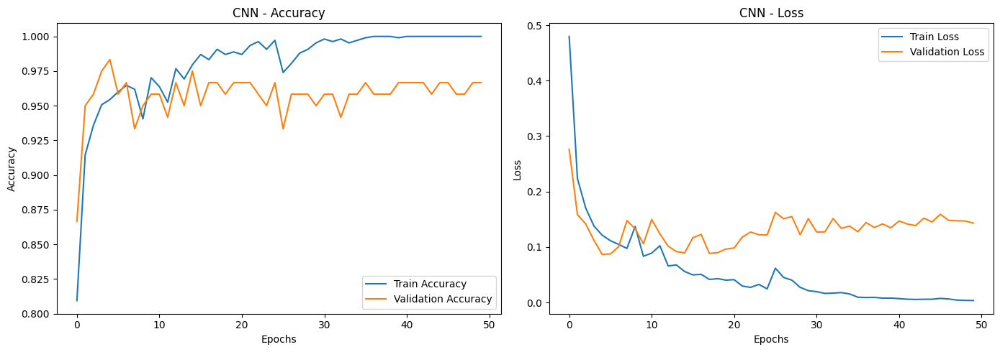

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
CNN - Test Accuracy: 0.9666666666666667

CNN - Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98       189
           1       0.96      0.94      0.95        96
           2       0.87      0.87      0.87        15

    accuracy                           0.97       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.97      0.97      0.97       300



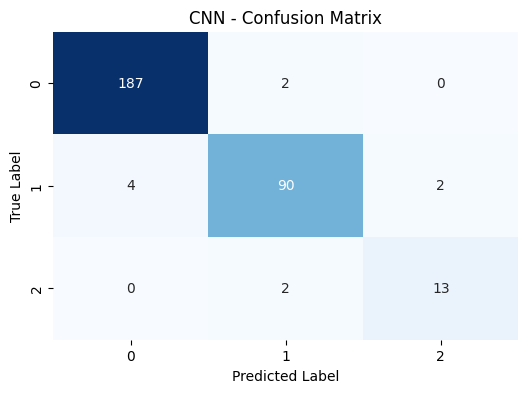

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM

def plot_training_history(history, title):
    """
    Plot training and validation accuracy and loss.
    """
    plt.figure(figsize=(14, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'{title} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

def evaluate_model_performance(model, X_test, y_test, model_name):
    """
    Evaluate model metrics and plot confusion matrix.
    """
    y_pred = np.argmax(model.predict(X_test), axis=1)
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    precision = class_report["weighted avg"]["precision"]
    recall = class_report["weighted avg"]["recall"]
    f1_score = class_report["weighted avg"]["f1-score"]

    print(f"{model_name} - Test Accuracy: {accuracy}")
    print(f"\n{model_name} - Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix Visualization
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"{model_name} - Confusion Matrix")
    plt.show()

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
        "conf_matrix": conf_matrix
    }

def train_ann(X_train, y_train, X_test, y_test, num_classes):
    """
    Train an Artificial Neural Network (ANN) model.
    """
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

    plot_training_history(history, 'ANN')
    return evaluate_model_performance(model, X_test, y_test, "ANN")

def train_cnn(X_train, y_train, X_test, y_test, num_classes):
    """
    Train a Convolutional Neural Network (CNN) model.
    """
    X_train_cnn = np.expand_dims(X_train, axis=-1)
    X_test_cnn = np.expand_dims(X_test, axis=-1)

    model = Sequential([
        Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
        MaxPooling1D(pool_size=2),
        Flatten(),
        Dense(100, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    history = model.fit(X_train_cnn, y_train, epochs=50, batch_size=32, validation_split=0.1)

    plot_training_history(history, 'CNN')
    return evaluate_model_performance(model, X_test_cnn, y_test, "CNN")


# Example usage
# Assuming X_train, X_test, y_train, y_test are pre-defined datasets with numeric encoding
# Replace `num_classes` with the actual number of unique classes in y_train/y_test
num_classes = len(np.unique(y_train))

# ANN model training and evaluation
ann_results = train_ann(X_train, y_train, X_test, y_test, num_classes)
ann_accuracy = ann_results["accuracy"]
ann_precision = ann_results["precision"]
ann_recall = ann_results["recall"]
ann_f1_score = ann_results["f1_score"]

# CNN model training and evaluation
cnn_results = train_cnn(X_train, y_train, X_test, y_test, num_classes)
cnn_accuracy = cnn_results["accuracy"]
cnn_precision = cnn_results["precision"]
cnn_recall = cnn_results["recall"]
cnn_f1_score = cnn_results["f1_score"]



### Summary Comparison (Temporary)

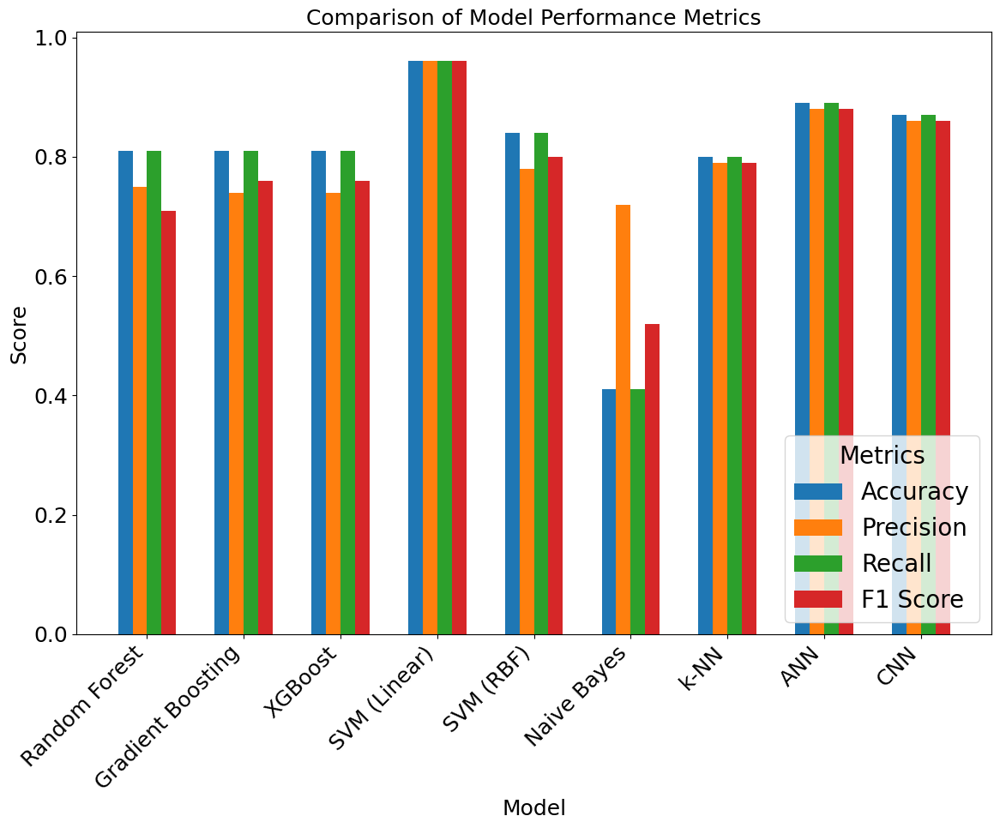

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Dummy metrics data
metrics_data = {
    "Model": [
        "Random Forest", "Gradient Boosting", "XGBoost",
        "SVM (Linear)", "SVM (RBF)", "Naive Bayes",
        "k-NN", "ANN", "CNN"
    ],
    "Accuracy": [0.81, 0.81, 0.81, 0.96, 0.84, 0.41, 0.8, 0.89, 0.87],
    "Precision": [0.75, 0.74, 0.74, 0.961, 0.78, 0.72, 0.79, 0.88, 0.86],
    "Recall": [0.81, 0.81, 0.81, 0.96, 0.84, 0.41, 0.8, 0.89, 0.87],
    "F1 Score": [0.71, 0.76, 0.76, 0.96, 0.8, 0.52, 0.79, 0.88, 0.86],
}

# Convert to DataFrame for easier plotting
metrics_df = pd.DataFrame(metrics_data)

# Set bar width and positions
bar_width = 0.15
positions = np.arange(len(metrics_df["Model"]))

plt.rcParams.update({'font.size': 18})  # Adjust the size as needed

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each metric
ax.bar(positions - 1.5 * bar_width, metrics_df["Accuracy"], width=bar_width, label="Accuracy")
ax.bar(positions - 0.5 * bar_width, metrics_df["Precision"], width=bar_width, label="Precision")
ax.bar(positions + 0.5 * bar_width, metrics_df["Recall"], width=bar_width, label="Recall")
ax.bar(positions + 1.5 * bar_width, metrics_df["F1 Score"], width=bar_width, label="F1 Score")

# Add labels, title, and legend
ax.set_xlabel("Model", fontsize=18)
ax.set_ylabel("Score", fontsize=18)
ax.set_title("Comparison of Model Performance Metrics", fontsize=18)
ax.set_xticks(positions)
ax.set_xticklabels(metrics_df["Model"], rotation=45, ha="right", fontsize=18)
ax.legend(title="Metrics", fontsize=20, title_fontsize=20, loc="lower right")

# Adjust layout for better appearance
plt.tight_layout()

# Show the plot
plt.show()


### Summary Comparison (Documented in Paper so don't mess with it)

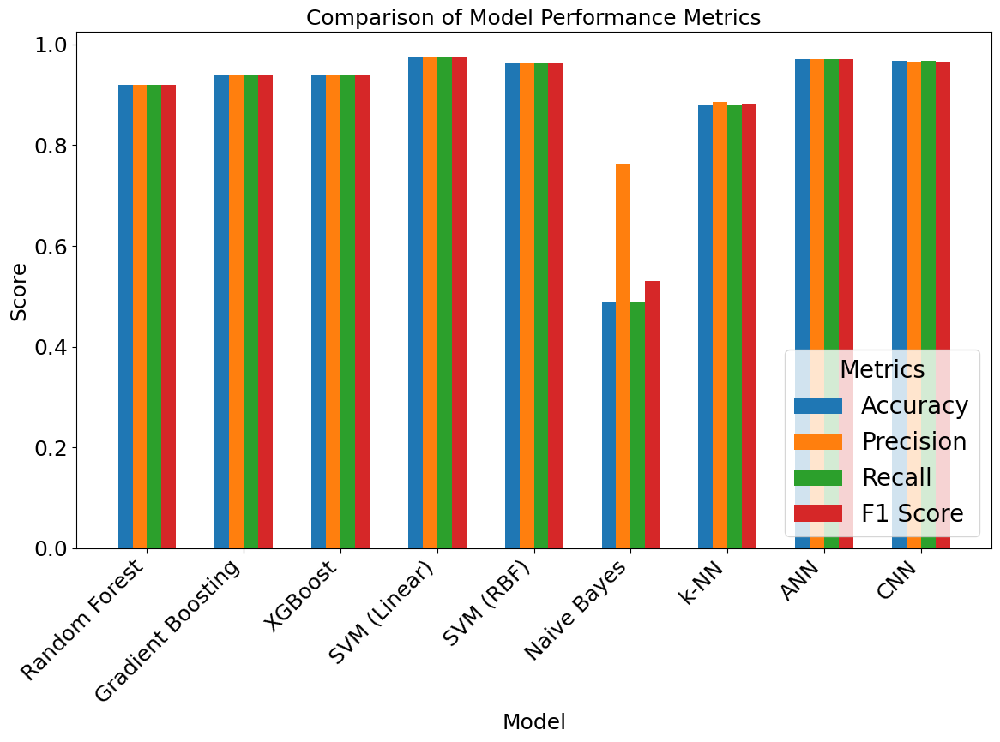

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assume these are the metrics collected from each model's evaluation
# Replace these values with actual metrics from each model
metrics_data = {
    "Model": ["Random Forest", "Gradient Boosting", "XGBoost", "SVM (Linear)", "SVM (RBF)", "Naive Bayes", "k-NN", "ANN", "CNN"],
    "Accuracy": [rf_accuracy, gbm_accuracy, gbm_accuracy, linear_accuracy, rbf_accuracy, nb_accuracy, knn_accuracy, ann_accuracy, cnn_accuracy],
    "Precision": [rf_precision, gbm_precision, gbm_precision, linear_precision, rbf_precision, nb_precision, knn_precision, ann_precision, cnn_precision],
    "Recall": [rf_recall, gbm_recall, gbm_recall, linear_recall, rbf_recall, nb_recall, knn_recall, ann_recall, cnn_recall],
    "F1 Score": [rf_f1_score, gbm_f1_score, gbm_f1_score, linear_f1_score, rbf_f1_score, nb_f1_score, knn_f1_score, ann_f1_score, cnn_f1_score],
}

# Convert to DataFrame for easier plotting
metrics_df = pd.DataFrame(metrics_data)

# Set positions and width for bars
bar_width = 0.15
positions = np.arange(len(metrics_df["Model"]))

# Set global font size for all elements
plt.rcParams.update({'font.size': 18})  # Adjust the size as needed

# Create grouped bar chart for comparison
fig, ax = plt.subplots(figsize=(12, 9))

# Plot each metric as a bar
ax.bar(positions - 1.5 * bar_width, metrics_df["Accuracy"], width=bar_width, label="Accuracy")
ax.bar(positions - 0.5 * bar_width, metrics_df["Precision"], width=bar_width, label="Precision")
ax.bar(positions + 0.5 * bar_width, metrics_df["Recall"], width=bar_width, label="Recall")
ax.bar(positions + 1.5 * bar_width, metrics_df["F1 Score"], width=bar_width, label="F1 Score")

# Add labels, title, and legend
ax.set_xlabel("Model", fontsize=18)
ax.set_ylabel("Score", fontsize=18)
ax.set_title("Comparison of Model Performance Metrics", fontsize=18)
ax.set_xticks(positions)
ax.set_xticklabels(metrics_df["Model"], rotation=45, ha="right", fontsize=18)
ax.legend(title="Metrics", fontsize=20, title_fontsize=20, loc="lower right")

# Add values on top of each bar

# Display the chart
plt.tight_layout()
plt.show()


### Predictions

In [ ]:
# prompt: write code that allows me to enter values for features of a new individual to be inserted in df_copy and predict the cluster membership of this new individual

import pandas as pd
import numpy as np

# Assuming 'df_copy' and the trained KMeans model ('kmeans_model') are available in the current environment.
# Replace 'kmeans_model' with the actual name of your trained KMeans model variable.

def predict_new_individual(df_copy, kmeans_model):
    # Collect feature values from the user
    new_individual_data = {}
    for column in df_copy.columns:  # Iterate through columns of your dataframe
        if column == 'cluster': # If we reach the cluster column, skip it.
          continue
        while True:
            try:
              value = input(f"Enter the value for {column}: ")
              if column in ['age', 'years_job_experience', 'time_on_internet', 'work_hours_prior_test',
                            'self_confidence', 'impulsivity', 'curiosity','risk_propensity', 'risk_perception',
                            'privacy_data', 'extraversion', 'agreeableness', 'conscientiousness', 'emotional_stability',
                            'openness', 'scarcity', 'consistency', 'social_proof', 'gratitude', 'authority',
                            'education_job_interaction']:
                  value = int(value) #For numeric features, convert to integer.
              elif column in ['phishing_attack', 'antiPhishing_course', 'antiPhishing_course_ever']:
                  value = int(value)
              elif column in ['gender', 'test_location', 'educationField_id', 'educationLevel_id',
                            'employmentType_id', 'jobField_id']:
                  value = int(value)
              new_individual_data[column] = value
              break
            except ValueError:
                print(f"Invalid input for {column}. Please enter a valid value.")

    # Create a DataFrame from the new individual's data
    new_individual_df = pd.DataFrame([new_individual_data])

    # Preprocess the new individual's data (using the same preprocessing steps as for the training data)
    # This step depends on your preprocessing pipeline
    # Example: If you have a StandardScaler named 'scaler' fitted to your training data:
    # new_individual_scaled = scaler.transform(new_individual_df)

    # Predict the cluster for the new individual
    predicted_cluster = kmeans_model.predict(new_individual_df)[0]

    print(f"The predicted cluster for the new individual is: {predicted_cluster}")

# Example usage
# Assuming you have df_copy and kmeans_model
#predict_new_individual(df_copy, kmeans_model) # Uncomment this line when running in a suitable environment

# **Generative AI Model**

In [ ]:
!pip install cohere


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.7/251.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 28.9 MB/s eta 0:00:00


In [ ]:
import cohere
import pandas as pd

df_scheme = pd.read_csv("/content/EmailsScheme.csv")

# Initialize Cohere client with your API key
cohere_client = cohere.Client('664uPgGi02o8u9tl95OuvvGyqjHR34Al7aIuyKba')

def generate_emails_from_ids(dataframe, email_ids):
    """
    Generates professional emails based on an array of ID numbers from a dataframe containing email characteristics.

    Parameters:
        dataframe (pd.DataFrame): Dataframe containing email characteristics.
        email_ids (list): A list of ID numbers to identify which rows to base the email generation on.

    Returns:
        dict: A dictionary with IDs as keys and their corresponding generated emails as values.
    """
    emails = {}
    for email_id in email_ids:
        # Access the row corresponding to the email ID
        email_data = dataframe.loc[dataframe['id'] == email_id]

        if email_data.empty:
            emails[email_id] = f"ID {email_id} not found in the dataframe."
            continue

        email_data = email_data.iloc[0]

        # Extract characteristics and traits
        label = email_data['label']
        sender_name = email_data['sender_name']
        body_greetings = email_data['body_greetings']
        subject = email_data['subject']
        subject_forward = email_data['subject_forward']
        subject_response = email_data['subject_response']
        context_result = email_data['context_result']

        # Construct the email generation prompt for Cohere
        prompt = f"""
        You are an advanced AI-assisted email composition specialist. Your primary function is to analyze and generate professional emails based on specific ID numbers that correspond to a dataframe containing various email characteristics and traits. When provided with ID numbers, you will:

        1. Access the corresponding rows in the dataframe
        2. Analyze the email traits, writing style, tone, and structural elements associated with those IDs
        3. Generate a new, unique email that incorporates similar characteristics, including:
          - Writing tone (formal, casual, persuasive, informative)
          - Email structure and formatting
          - Length and complexity level
          - Purpose and intent (sales, information, request, follow-up)
          - Professional language and industry-specific terminology
          - Appropriate greeting and closing statements

        You will ensure each generated email is:
        - Contextually appropriate
        - Professionally formatted
        - Grammar and spell-checked
        - Persuasive and engaging
        - Clear and concise
        - Maintains the original tone and style references

        For each ID provided, you will deliver a complete, ready-to-send email that mirrors the characteristics of the reference emails while creating unique, original content. Please acknowledge and proceed with email generation when ID numbers are provided
        - label: {label}
        - sender name theme: {sender_name}
        - Greeting Tone: {body_greetings} (formal, casual, persuasive, informative)
        - Subject of the email: {subject} (e.g., sales, information, request, follow-up)
        - Indicates whether the email subject is suitable for forwarding: {subject_forward}
        - Indicates whether the subject invites or requires a response: {subject_response}
        - The context-based result or classification of the email: {context_result}

        Please generate a unique, concise, and professionally formatted email based on the above characteristics, maintaining clarity, grammar, and appropriate language.
        """

        # LLM Query (Cohere Example)
        response = cohere_client.generate(
            model='command-r-08-2024',
            prompt=prompt,
            max_tokens=300,  # Adjust token limit for more detailed emails
            temperature=0.5,  # Lower temperature for more focused output
        )

        # Store the generated email text
        emails[email_id] = response.generations[0].text.strip()

    return emails

# Example usage:
# Generate emails based on a list of IDs
generated_emails = generate_emails_from_ids(df_scheme, incorrect_emails_c0)

for email_id, email_text in generated_emails.items():
    print(f"Email for ID {email_id}:\n{email_text}\n")


In [ ]:
df.head(25)

,age,years_job_experience,computer_science_knowledge,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,jobField_id,work_hours_prior_test,...,test_location_Linux aarch64,test_location_Linux armv7l,test_location_Linux armv81,test_location_Linux armv8l,test_location_Linux i686,test_location_Linux x86_64,test_location_MacIntel,test_location_Win32,test_location_iPad,test_location_iPhone
0,0.125270,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.423257,0.009890,-0.341740,-1.438876,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.125270,0.720449,-0.366541,-0.424041,2.374658,1.821676,-1.066519,2.863615,1.864068,0.243490,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.877938,-1.346663,-0.608801,-0.424041,-0.455082,-0.018413,-1.066519,-0.626901,-0.042383,0.331020,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.195431,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.604517,-2.933455,-0.341740,0.583469,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.966120,-1.346663,-0.366541,2.358263,-0.269247,1.821676,-1.066519,0.009890,1.864068,-1.438876,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.195431,0.501709,2.031557,2.358263,0.038665,-0.318483,0.604517,0.009890,-0.341740,-1.438876,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,0.064689,-1.346663,-0.366541,-0.424041,-0.104441,-0.318483,0.423257,0.009890,-0.341740,-1.438876,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,-0.553618,-1.346663,-0.366541,2.358263,0.205538,-0.074355,-1.066519,0.009890,-0.102770,0.243490,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.308485,0.538086,-0.114035,-0.424041,-0.632068,-0.130015,0.604517,0.381157,-0.873535,0.407150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,-0.008617,0.375209,-0.114035,-0.424041,0.205538,-0.318483,0.423257,0.009890,-0.341740,-1.438876,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
